# Telecom Churn Prediction - Starter Notebook

**Team:** Ankit Surna , Ankan Putatunda

The goal of this notebook is to provide an overview of how write a notebook and create a submission file that successfully solves the churn prediction problem. Please download the datasets, unzip and place them in the same folder as this notebook.

We are going to follow the process called CRISP-DM.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b9/CRISP-DM_Process_Diagram.png/639px-CRISP-DM_Process_Diagram.png" style="height: 400px; width:400px;"/>

After Business and Data Understanding via EDA, we want to prepare data for modelling. Then evaluate and submit our predictions.

# Problem statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn, and identify the main indicators of churn.

**Customer behaviour during churn:**

Customers usually do not decide to switch to another competitor instantly, but rather over a
period of time (this is especially applicable to high-value customers). In churn prediction, we
assume that there are three phases of customer lifecycle :

1. <u>The ‘good’ phase:</u> In this phase, the customer is happy with the service and behaves as usual.

2. <u>The ‘action’ phase:</u> The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. <u>The ‘churn’ phase:</u> In this phase, the customer is said to have churned. In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month (September) is the ‘churn’ phase.

##### Steps : 

* ##### _Data Understanding, Preparation, and Pre-Processing_ : 
    * Data understanding, identification of potentially useful and non-useful attributes and variable importance and impact estimation
    * Data preparation, performing data cleaning, missing values imputation, outlier removal, and column level standardization (for e.g., date, etc.) into one format
 
* ##### _Exploratory Data Analysis_ :
    * Performing basic preliminary data analysis including finding the correlation between variables and scatter plots to identify relationships between variables
    * Performing advanced data analysis, including plotting relevant heatmaps, histograms, and basic clustering to find patterns in the data
 
* ##### _Feature Engineering and Variable Transformation_ :
    * Feature engineering and performing one or more methods on attributes that can lead to the creation of a new potentially useful variable; for e.g., day from the date
    * Variable transformation and applying categorical variable transformations to turn into numerical data and numerical variable transformations to scale data
 
* ##### _Model Selection, Model Building, and  Prediction_ :
    * Identifying the type of problem and making a list of decisive models from all available choices
    * Choosing a training mechanism; for e.g., cross-validation, etc., and tuning hyperparameters of each model
    * Testing each model on the respective model evaluation metric
    * Choosing the best model based on the fit of the data set and output variable
    * Using ensemble options to improve the efficacy based on the evaluation metric stated in the problem

# Loading dependencies & datasets

In [102]:
#Data Structures
import pandas as pd
import numpy as np
import re
import os

### For installing missingno library, type this command in terminal
#pip install missingno

import missingno as msno

#Sklearn
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, precision_score, recall_score, roc_auc_score, RocCurveDisplay, PrecisionRecallDisplay

#Plotting
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

#Others
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# Data Understanding, Preparation, and Pre-Processing

In [2]:
# Load datasets from CSV files
train_data = pd.read_csv("train.csv")
test_data = pd.read_csv("test.csv")
sample_csv = pd.read_csv("sample.csv")
data_dict = pd.read_csv("data_dictionary.csv")

# Print the shape (number of rows and columns) of each loaded dataset
print(f"Shape of Training Data: {train_data.shape}")
print(f"Shape of Test Data: {test_data.shape}")
print(f"Shape of Sample CSV: {sample_csv.shape}")
print(f"Shape of Data Dictionary: {data_dict.shape}")

Shape of Training Data: (69999, 172)
Shape of Test Data: (30000, 171)
Shape of Sample CSV: (30000, 2)
Shape of Data Dictionary: (36, 2)


In [3]:
data_dict

,Acronyms,Description
0,CIRCLE_ID,Telecom circle area to which the customer belo...
1,LOC,Local calls within same telecom circle
2,STD,STD calls outside the calling circle
3,IC,Incoming calls
4,OG,Outgoing calls
5,T2T,Operator T to T ie within same operator mobile...
6,T2M,Operator T to other operator mobile
7,T2O,Operator T to other operator fixed line
8,T2F,Operator T to fixed lines of T
9,T2C,Operator T to its own call center


In [4]:
train_data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,60.806,103.176,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,156.362,205.260,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,240.708,128.191,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


In [5]:
# Calculate and print the number of duplicated rows in the training dataset
# Duplicated rows are those that have the same values across all columns
num_duplicates = train_data.duplicated().sum()
print(f"Number of duplicated rows in the training dataset: {num_duplicates}")

Number of duplicated rows in the training dataset: 0


In [6]:
# Identify columns with all values as NULL in the training dataset
# This will help in determining columns that are completely empty
null_cols = train_data.columns[train_data.isnull().all(axis=0)].tolist()

# Print the list of columns where all values are NULL
print(f"List of columns that have all NULL values:{null_cols}")

# Print the count of columns with all NULL values
print(f"Count of columns having all NULL values: {len(null_cols)}")

List of columns that have all NULL values:[]
Count of columns having all NULL values: 0


In [7]:
# Identify columns with only one unique value in the training dataset
# These columns have the same value for all records and may not provide useful information
uniq_list = train_data.columns[train_data.nunique() == 1].tolist()

# Print the list of columns where all records have the same value
print(f"List of columns with the same value for all records:\n{uniq_list}\n")

# Print the count of columns where all records have the same value
print(f"Count of columns with the same value for all records: {len(uniq_list)}")

List of columns with the same value for all records:
['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']

Count of columns with the same value for all records: 13


In [8]:
# Find columns with categorical values in the dataset

# Function to display categorical values in specified columns
def categorical_values(df, column_list):
    """
    Displays the categorical values and their counts for each specified column in the DataFrame.
    
    Parameters:
    df (DataFrame): The DataFrame containing the data.
    column_list (list): A list of columns to examine.
    """
    for index, column in enumerate(column_list):
        # Display column name and index with formatted output
        display(HTML(f"<h3>{index + 1}. Categorical column: \"{column}\" and their values</h3>"))
        
        # Get value counts and format into a DataFrame
        value_counts_df = df[column].value_counts().reset_index()
        value_counts_df.columns = ['Value', 'Count']
        
        # Display the DataFrame as HTML
        display(HTML(value_counts_df.to_html(index=False)))
        
# List of columns in the DataFrame with categorical values
# Categorical columns are those with between 2 and 14 unique values
cat_list = train_data.columns[(train_data.nunique() == 2)].tolist()

# Print the list of categorical columns and their count with formatting
print(f"List of columns that have categorical values:\n{cat_list}\n")
print(f"Count of columns with categorical values: {len(cat_list)}")
categorical_values(train_data,cat_list)

List of columns that have categorical values:
['night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'churn_probability']

Count of columns with categorical values: 7


Value,Count
0.0,17124
1.0,444


Value,Count
0.0,17435
1.0,430


Value,Count
0.0,18030
1.0,387


Value,Count
1.0,16098
0.0,1470


Value,Count
1.0,16249
0.0,1616


Value,Count
1.0,16397
0.0,2020


Value,Count
0,62867
1,7132


In [9]:
# Calculate percentage of null values in each column
def validate_nulls(df, threshold=40):
    """
    Validate columns in the DataFrame that have more than a given percentage of null values.
    
    Parameters:
    df (pd.DataFrame): The DataFrame to validate.
    threshold (float): The percentage threshold for filtering columns with high null values.
    
    Returns:
    pd.DataFrame: A DataFrame containing columns with more than the given percentage of null values,
                  including data type and number of unique values, sorted by percentage of null values.
    """
    # Calculate percentage of null values in each column
    df_null = df.isnull().mean() * 100
    df_null = df_null.reset_index(drop=False)
    df_null.columns = ['column_name', 'perc_nulls']

    # Add datatype and number of unique values for each column
    df_null['data_type'] = df_null['column_name'].apply(lambda col: df[col].dtype)
    df_null['n_unique'] = df_null['column_name'].apply(lambda col: df[col].nunique())

    # Filter for columns with more than the threshold percentage of null values
    df_null_high = df_null[df_null['perc_nulls'] > threshold]

    # Sort the DataFrame by perc_nulls in descending order
    df_null_sorted = df_null_high.sort_values(by='perc_nulls', ascending=False)

    # Display the DataFrame as HTML (optional, for Jupyter Notebooks or similar environments)
    display(HTML(df_null_sorted.to_html(index=False)))

    # Return the sorted DataFrame for further inspection if needed
    return df_null_sorted

result = validate_nulls(train_data)

column_name,perc_nulls,data_type,n_unique
date_of_last_rech_data_6,74.902499,object,30
count_rech_2g_6,74.902499,float64,30
fb_user_6,74.902499,float64,2
night_pck_user_6,74.902499,float64,2
arpu_2g_6,74.902499,float64,5389
arpu_3g_6,74.902499,float64,5506
count_rech_3g_6,74.902499,float64,23
av_rech_amt_data_6,74.902499,float64,792
max_rech_data_6,74.902499,float64,47
total_rech_data_6,74.902499,float64,36


##### Columns that requires further breakdown to derive additonal information: 
> * date_of_last_rech_data_6, date_of_last_rech_data_7, date_of_last_rech_data_8

##### Columns that have binaries and the Nulls can be replaced with 0: 
> * night_pck_user_6, night_pck_user_7, night_pck_user_8
> * fb_user_6, fb_user_7, fb_user_8

##### Columns that have amount values can be replaced with 0:
> * arpu_3g_6, arpu_3g_7, arpu_3g_8
> * arpu_2g_6, arpu_2g_7, arpu_2g_8
> * av_rech_amt_data_6, av_rech_amt_data_7, av_rech_amt_data_8

##### Columns that are quantifiable can be replaced with 0:
> * count_rech_3g_6, count_rech_3g_7, count_rech_3g_8
> * count_rech_2g_6, count_rech_2g_7, count_rech_2g_8
> * max_rech_data_6, max_rech_data_7, max_rech_data_8
> * total_rech_data_6, total_rech_data_7, total_rech_data_8

### Cleaning

> * Drop the columns that have all the values same as they will not aid in analysis.
> * Replace the NaN in the amount columns with 0.
> * Replace the NaN in the quantifiable columns with 0.
> * Convert the datatype of the binaries to category.
> * Convert the data type date column to datetime.
> * Derive dummies from the date column and drop the duplicate columns.
> * Visualise outliers and handle them.
> * Impute the missing values.

In [10]:
# Creating copy of train and test data sets

df_train_clean = train_data
df_test_clean = test_data

In [11]:
# Drop columns where all values are the same, as they don't contribute to analysis
def drop_constant_columns(df, df_name):
    """
    Drop columns where all values are the same from the specified DataFrame, as they don't contribute to analysis.

    Parameters:
    df (pd.DataFrame): The DataFrame from which to drop columns.
    df_name (str): The name of the DataFrame for reporting purposes.

    Returns:
    pd.DataFrame: The updated DataFrame with constant columns removed.
    """
    print(f"Identifying and dropping columns with the same value across all rows from DataFrame '{df_name}'...")

    # Find columns with only one unique value
    columns_to_drop = df.columns[df.nunique() == 1].tolist()

    # Drop these columns from the DataFrame
    df_dropped = df.drop(columns=columns_to_drop)

    # Confirm the columns have been removed
    print(f"\nColumns dropped from DataFrame '{df_name}':", columns_to_drop)
    print(f"\nValidation: Remaining columns with the same value across all rows in DataFrame '{df_name}':", 
          df_dropped.columns[df_dropped.nunique() == 1].tolist())
    
    return df_dropped


df_train_clean = drop_constant_columns(df_train_clean, 'df_train_clean')

df_test_clean = drop_constant_columns(df_test_clean, 'df_test_clean')

Identifying and dropping columns with the same value across all rows from DataFrame 'df_train_clean'...

Columns dropped from DataFrame 'df_train_clean': ['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']

Validation: Remaining columns with the same value across all rows in DataFrame 'df_train_clean': []
Identifying and dropping columns with the same value across all rows from DataFrame 'df_test_clean'...

Columns dropped from DataFrame 'df_test_clean': ['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']

Validation: Remaining columns with the same value across all rows in Dat

In [12]:
def replace_nan_in_amount_columns(df, amount_columns, df_name):
    """
    Replace NaN values with 0 in specified amount columns of the DataFrame.

    Parameters:
    df (pd.DataFrame): The DataFrame in which to replace NaN values.
    amount_columns (list): List of column names in which NaNs should be replaced with 0.
    df_name (str): The name of the DataFrame for reporting purposes.

    Returns:
    pd.DataFrame: The updated DataFrame with NaNs replaced in the specified columns.
    """
    print(f"Displaying statistics for amount columns in DataFrame '{df_name}':\n")
    # print(df[amount_columns].describe())
    display(HTML(df[amount_columns].describe().to_html(index=False)))
    

    print(f"\nReplacing NaN values with 0 in amount columns of DataFrame '{df_name}'...")

    # Replace NaN values with 0 in the specified amount columns
    df[amount_columns] = df[amount_columns].fillna(0)

    # Verify if NaNs have been replaced
    nan_counts = df[amount_columns].isnull().sum()
    print(f"\nVerification: NaN counts in amount columns of DataFrame '{df_name}':")
    print(nan_counts)

    return df


amount_columns = ['arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 
                  'arpu_2g_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8']

df_train_clean = replace_nan_in_amount_columns(df_train_clean, amount_columns, 'df_train_clean')

df_test_clean = replace_nan_in_amount_columns(df_test_clean, amount_columns, 'df_test_clean')

Displaying statistics for amount columns in DataFrame 'df_train_clean':



arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8
17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000
90.069931,89.115767,90.618564,86.863900,85.846074,86.348404,192.831096,201.455940,196.815792
193.600413,195.826990,189.907986,171.321203,178.067280,170.297094,190.623115,198.346141,192.280532
-20.380000,-26.040000,-24.490000,-35.830000,-13.090000,-55.830000,1.000000,1.000000,1.000000
0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,82.000000,92.000000,84.000000
0.520000,0.420000,0.840000,11.300000,8.800000,9.090000,154.000000,154.000000,154.000000
122.070000,120.860000,122.070000,122.070000,122.070000,122.070000,252.000000,252.000000,252.000000
5054.370000,4980.900000,3716.900000,5054.350000,4809.360000,3483.170000,5920.000000,4365.000000,4076.000000



Replacing NaN values with 0 in amount columns of DataFrame 'df_train_clean'...

Verification: NaN counts in amount columns of DataFrame 'df_train_clean':
arpu_3g_6             0
arpu_3g_7             0
arpu_3g_8             0
arpu_2g_6             0
arpu_2g_7             0
arpu_2g_8             0
av_rech_amt_data_6    0
av_rech_amt_data_7    0
av_rech_amt_data_8    0
dtype: int64
Displaying statistics for amount columns in DataFrame 'df_test_clean':



arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8
7585.000000,7706.000000,7922.000000,7585.000000,7706.000000,7922.000000,7585.000000,7706.000000,7922.000000
88.362531,90.006250,92.464772,85.318916,86.072967,87.183175,192.068004,199.880903,199.178710
192.025613,196.060312,184.108675,176.078483,172.415705,163.393576,197.264397,193.146529,189.006928
-30.820000,-9.260000,-12.040000,-19.790000,-15.480000,-20.490000,1.000000,0.500000,0.500000
0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,82.000000,92.000000,91.000000
0.410000,0.415000,0.985000,9.960000,8.865000,9.600000,154.000000,154.000000,154.000000
121.850000,117.320000,123.195000,122.070000,122.070000,122.070000,252.000000,252.000000,252.000000
6362.280000,3455.620000,2460.850000,6433.760000,3214.460000,2139.550000,7546.000000,3765.000000,2520.000000



Replacing NaN values with 0 in amount columns of DataFrame 'df_test_clean'...

Verification: NaN counts in amount columns of DataFrame 'df_test_clean':
arpu_3g_6             0
arpu_3g_7             0
arpu_3g_8             0
arpu_2g_6             0
arpu_2g_7             0
arpu_2g_8             0
av_rech_amt_data_6    0
av_rech_amt_data_7    0
av_rech_amt_data_8    0
dtype: int64


In [13]:
def replace_nan_in_quantifiable_columns(df, quantifiable_columns, df_name):
    """
    Replace NaN values with 0 in specified quantifiable columns of the DataFrame.

    Parameters:
    df (pd.DataFrame): The DataFrame in which to replace NaN values.
    quantifiable_columns (list): List of column names in which NaNs should be replaced with 0.
    df_name (str): The name of the DataFrame for reporting purposes.

    Returns:
    pd.DataFrame: The updated DataFrame with NaNs replaced in the specified columns.
    """
    print(f"Replacing NaN values with 0 in quantifiable columns of DataFrame '{df_name}'...")

    # Replace NaN values with 0 in the specified quantifiable columns
    df[quantifiable_columns] = df[quantifiable_columns].fillna(0)

    # Verify if NaNs have been replaced
    nan_counts = df[quantifiable_columns].isnull().sum()
    print(f"\nVerification: NaN counts in quantifiable columns of DataFrame '{df_name}':")
    print(nan_counts)

    return df


quantifiable_columns = [
    'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8',
    'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
    'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8',
    'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8'
]

df_train_clean = replace_nan_in_quantifiable_columns(df_train_clean, quantifiable_columns, 'df_train_clean')


df_test_clean = replace_nan_in_quantifiable_columns(df_test_clean, quantifiable_columns, 'df_test_clean')



Replacing NaN values with 0 in quantifiable columns of DataFrame 'df_train_clean'...

Verification: NaN counts in quantifiable columns of DataFrame 'df_train_clean':
count_rech_3g_6      0
count_rech_3g_7      0
count_rech_3g_8      0
count_rech_2g_6      0
count_rech_2g_7      0
count_rech_2g_8      0
max_rech_data_6      0
max_rech_data_7      0
max_rech_data_8      0
total_rech_data_6    0
total_rech_data_7    0
total_rech_data_8    0
dtype: int64
Replacing NaN values with 0 in quantifiable columns of DataFrame 'df_test_clean'...

Verification: NaN counts in quantifiable columns of DataFrame 'df_test_clean':
count_rech_3g_6      0
count_rech_3g_7      0
count_rech_3g_8      0
count_rech_2g_6      0
count_rech_2g_7      0
count_rech_2g_8      0
max_rech_data_6      0
max_rech_data_7      0
max_rech_data_8      0
total_rech_data_6    0
total_rech_data_7    0
total_rech_data_8    0
dtype: int64


In [14]:
def process_binary_columns(df, binary_columns, df_name):
    """
    Replace NaN values with 0 in binary columns and convert their datatype to 'category'.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the binary columns.
    binary_columns (list): List of binary column names to be processed.
    df_name (str): The name of the DataFrame for reporting purposes.

    Returns:
    pd.DataFrame: The updated DataFrame with binary columns processed.
    """
    print(f"Processing binary columns in DataFrame '{df_name}'...")

    # Replace NaN values with 0 in binary columns
    df[binary_columns] = df[binary_columns].fillna(0)
    print(f"\nReplaced NaN values with 0 in binary columns of DataFrame '{df_name}'.")

    # Convert the datatype of binary columns to 'category'
    df[binary_columns] = df[binary_columns].astype('category')
    print(f"\nConverted binary columns to 'category' dtype in DataFrame '{df_name}'.")

    # Verify the changes
    print(f"\nVerification: Data types of binary columns in DataFrame '{df_name}':")
    print(df[binary_columns].dtypes)

    return df


binary_columns = [
    'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8',
    'fb_user_6', 'fb_user_7', 'fb_user_8', 'churn_probability'
]

df_train_clean = process_binary_columns(df_train_clean, binary_columns, 'df_train_clean')

df_test_clean = process_binary_columns(df_test_clean, binary_columns[:-1], 'df_test_clean')


Processing binary columns in DataFrame 'df_train_clean'...

Replaced NaN values with 0 in binary columns of DataFrame 'df_train_clean'.

Converted binary columns to 'category' dtype in DataFrame 'df_train_clean'.

Verification: Data types of binary columns in DataFrame 'df_train_clean':
night_pck_user_6     category
night_pck_user_7     category
night_pck_user_8     category
fb_user_6            category
fb_user_7            category
fb_user_8            category
churn_probability    category
dtype: object
Processing binary columns in DataFrame 'df_test_clean'...

Replaced NaN values with 0 in binary columns of DataFrame 'df_test_clean'.

Converted binary columns to 'category' dtype in DataFrame 'df_test_clean'.

Verification: Data types of binary columns in DataFrame 'df_test_clean':
night_pck_user_6    category
night_pck_user_7    category
night_pck_user_8    category
fb_user_6           category
fb_user_7           category
fb_user_8           category
dtype: object


In [15]:
def process_date_columns(df, date_columns, df_name):
    """
    Convert the data type of date columns to datetime in the DataFrame.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the date columns.
    date_columns (list): List of date column names to be converted.
    df_name (str): The name of the DataFrame for reporting purposes.

    Returns:
    pd.DataFrame: The updated DataFrame with date columns converted to datetime.
    """
    print(f"Converting date columns to datetime in DataFrame '{df_name}'...")

    # Convert the data type of date columns to datetime
    df[date_columns] = df[date_columns].apply(pd.to_datetime, errors='coerce')
    print(f"\nConverted date columns to datetime in DataFrame '{df_name}'.")

    # Verify the changes
    print(f"\nVerification: Data types of date columns in DataFrame '{df_name}':")
    print(df[date_columns].dtypes)

    return df


date_columns = [
    'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8'
]

df_train_clean = process_date_columns(df_train_clean, date_columns, 'df_train_clean')

df_test_clean = process_date_columns(df_test_clean, date_columns, 'df_test_clean')


Converting date columns to datetime in DataFrame 'df_train_clean'...

Converted date columns to datetime in DataFrame 'df_train_clean'.

Verification: Data types of date columns in DataFrame 'df_train_clean':
date_of_last_rech_data_6    datetime64[ns]
date_of_last_rech_data_7    datetime64[ns]
date_of_last_rech_data_8    datetime64[ns]
dtype: object
Converting date columns to datetime in DataFrame 'df_test_clean'...

Converted date columns to datetime in DataFrame 'df_test_clean'.

Verification: Data types of date columns in DataFrame 'df_test_clean':
date_of_last_rech_data_6    datetime64[ns]
date_of_last_rech_data_7    datetime64[ns]
date_of_last_rech_data_8    datetime64[ns]
dtype: object


In [16]:
# Convert date columns to weekday names, handle NaN values, and create dummy variables for 'No_recharge'.

def process_date_columns(df, date_columns):
    """
    Convert date columns to weekday names, handle NaN values, and create dummy variables for 'No_recharge'.

    Parameters:
    df (pd.DataFrame): The DataFrame to process.
    date_columns (list): List of columns containing date information.

    Returns:
    pd.DataFrame: The updated DataFrame with processed date columns.
    """
    # Define weekday mapping
    w_day = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}

    # Loop over each date column
    for col in date_columns:
        # Convert the date to weekday using the map
        df[col + '_WeekDay'] = pd.to_datetime(df[col]).dt.weekday.map(w_day)
        
        # Replace NaN with 'No_recharge' followed by the date suffix
        df[col + '_WeekDay'].fillna(f'No_recharge_{col[-1]}', inplace=True)
        
        # Generate dummies but only for 'No_recharge'
        dummies = pd.get_dummies(df[col + '_WeekDay'], prefix=col, drop_first=True).astype('int')
        
        # Filter to keep only the 'No_recharge' dummy column
        no_recharge_col = [dummy_col for dummy_col in dummies.columns if 'No_recharge' in dummy_col]
        
        # Add the 'No_recharge' dummy column to the original DataFrame
        df[no_recharge_col] = dummies[no_recharge_col]

    # Drop the original date columns, keep WeekDay and no_recharge columns
    df.drop(columns=date_columns + [col + '_WeekDay' for col in date_columns], inplace=True)

    # Display the DataFrame as HTML
    display(HTML(df.head().to_html(index=False)))

    return df

# List of date columns
date_columns = [
    'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8',
    'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'
]

df_train_clean = process_date_columns(df_train_clean, date_columns)

df_test_clean = process_date_columns(df_test_clean, date_columns)

id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,date_of_last_rech_data_6_No_recharge_6,date_of_last_rech_data_7_No_recharge_7,date_of_last_rech_data_8_No_recharge_8,date_of_last_rech_6_No_recharge_6,date_of_last_rech_7_No_recharge_7,date_of_last_rech_8_No_recharge_8
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1958,0.0,0.0,0.0,0,1,1,1,0,0,0
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0.0,1.0,0.0,0.0,145.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,145.0,0.0,0.0,352.91,0.00,0.0,3.96,0.0,0.0,122.07,0.0,0.0,122.08,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0.0,1.0,0.0,710,0.0,0.0,0.0,0,1,0,1,0,0,0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,2

id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,date_of_last_rech_data_6_No_recharge_6,date_of_last_rech_data_7_No_recharge_7,date_of_last_rech_data_8_No_recharge_8,date_of_last_rech_6_No_recharge_6,date_of_last_rech_7_No_recharge_7,date_of_last_rech_8_No_recharge_8
69999,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1692,0.00,0.00,0.00,1,1,1,0,0,0
70000,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2533,0.00,0.00,0.00,1,1,1,0,0,0
70001,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00

In [17]:
df_test_clean.columns.tolist()

['id',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'l

In [18]:
# Validate columns in df_train_clean with more than 40% null values
# The function validate_nulls will compute the percentage of null values, add metadata such as data type
# and number of unique values, filter columns exceeding the 40% null threshold, and return a DataFrame
# sorted by the percentage of null values. The results will also be displayed as HTML for better visualization.
result = validate_nulls(df_train_clean)

column_name,perc_nulls,data_type,n_unique


In [19]:
# Print the shape of the training DataFrame after processing
print("\nShape of the training DataFrame after operations:")
print(df_train_clean.shape)

# Print the shape of the test DataFrame (if relevant to your workflow)
print("\nShape of the test DataFrame:")
print(df_test_clean.shape)


Shape of the training DataFrame after operations:
(69999, 159)

Shape of the test DataFrame:
(30000, 158)


In [20]:
# Visualize Outliers

def outlier_plot(dataframe, column_list):
    """
    Plots boxplots to visualize outliers in specified columns of the given DataFrame.

    Parameters:
    dataframe (pd.DataFrame): The DataFrame containing the data.
    column_list (list): List of column names to plot for outliers.

    Returns:
    None
    """
    
    # Filter out columns that are empty or contain only NaN values
    column_list = [col for col in column_list if not dataframe[col].dropna().empty]
    
    if not column_list:
        print("No valid columns with data to plot.")
        return

    # Determine the layout of subplots
    num_columns = 5  # Number of columns in subplot grid
    num_rows = int(np.ceil(len(column_list) / num_columns))  # Number of rows needed

    # Create a figure with dynamic size based on the number of columns and rows
    plt.figure(figsize=(num_columns * 5, num_rows * 4))

    # Generate a color palette for the boxplots
    color_palette = plt.cm.viridis(np.linspace(0, 1, len(column_list)))

    # Plot boxplots for each column
    for index, column in enumerate(column_list):
        # Create a subplot for each column
        plt.subplot(num_rows, num_columns, index + 1)
        
        # Data to plot (excluding NaN values)
        data_to_plot = dataframe[column].dropna()
        if not data_to_plot.empty:
            plt.boxplot(data_to_plot, patch_artist=True, 
                        boxprops=dict(facecolor=color_palette[index % len(color_palette)]))
        
        # Set title and labels for the subplot
        plt.title(f"Outliers in '{column}'", fontsize=8)
        plt.xlabel('Column')
        plt.ylabel('Values')
        
        # Improve readability for large numbers of subplots
        plt.xticks(rotation=45, ha='right')

    # Hide empty subplots if there are fewer plots than subplot grid spaces
    num_plots = len(column_list)
    if num_plots < num_rows * num_columns:
        for i in range(num_plots, num_rows * num_columns):
            plt.subplot(num_rows, num_columns, i + 1).set_visible(False)

    # Adjust layout to prevent overlap
    plt.tight_layout()
    
    # Display the plot
    plt.show()


In [21]:
numerical_columns  = df_train_clean.select_dtypes(exclude=['object','datetime','category']).columns.tolist()
categorical_columns = df_train_clean.select_dtypes(include=['category']).columns.tolist()
extra_columns = df_train_clean.select_dtypes(include=['object','datetime']).columns.tolist()
print("Numerical_Columns :", numerical_columns)
print("\nCateogrical_Columns :", categorical_columns)
print("\nExtra_Columns :", extra_columns)

Numerical_Columns : ['id', 'arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7

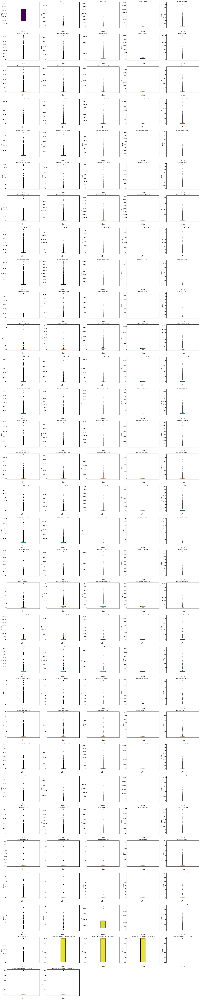

In [22]:
# Display message indicating that boxplots for outlier examination are being plotted
display(HTML("Generating boxplots to examine potential outliers in each feature."))

# Call the function to plot boxplots for all columns in the dataset
outlier_plot(df_train_clean, numerical_columns)

Given the high number of outliers, normalizing some features could improve model accuracy in predicting churn.

In [23]:
# Function to replace outliers with median after removing extreme outliers using IQR
def replace_outliers_with_median_iqr(df, col):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Remove extreme outliers based on IQR
    df[col] = df[col][(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    # Replace remaining outliers with median
    median = df[col].median()
    df[col][df[col] < lower_bound] = median
    df[col][df[col] > upper_bound] = median
    return df[col]

# Removing outliers
display(HTML(f"<br>Removing outliers for the below numerical columns based on the IQR method..."))
for col in numerical_columns:
    print(col, end=", ")
    df_train_clean[col] = replace_outliers_with_median_iqr(df_train_clean, col)

id, arpu_6, arpu_7, arpu_8, onnet_mou_6, onnet_mou_7, onnet_mou_8, offnet_mou_6, offnet_mou_7, offnet_mou_8, roam_ic_mou_6, roam_ic_mou_7, roam_ic_mou_8, roam_og_mou_6, roam_og_mou_7, roam_og_mou_8, loc_og_t2t_mou_6, loc_og_t2t_mou_7, loc_og_t2t_mou_8, loc_og_t2m_mou_6, loc_og_t2m_mou_7, loc_og_t2m_mou_8, loc_og_t2f_mou_6, loc_og_t2f_mou_7, loc_og_t2f_mou_8, loc_og_t2c_mou_6, loc_og_t2c_mou_7, loc_og_t2c_mou_8, loc_og_mou_6, loc_og_mou_7, loc_og_mou_8, std_og_t2t_mou_6, std_og_t2t_mou_7, std_og_t2t_mou_8, std_og_t2m_mou_6, std_og_t2m_mou_7, std_og_t2m_mou_8, std_og_t2f_mou_6, std_og_t2f_mou_7, std_og_t2f_mou_8, std_og_mou_6, std_og_mou_7, std_og_mou_8, isd_og_mou_6, isd_og_mou_7, isd_og_mou_8, spl_og_mou_6, spl_og_mou_7, spl_og_mou_8, og_others_6, og_others_7, og_others_8, total_og_mou_6, total_og_mou_7, total_og_mou_8, loc_ic_t2t_mou_6, loc_ic_t2t_mou_7, loc_ic_t2t_mou_8, loc_ic_t2m_mou_6, loc_ic_t2m_mou_7, loc_ic_t2m_mou_8, loc_ic_t2f_mou_6, loc_ic_t2f_mou_7, loc_ic_t2f_mou_8, loc_ic

In [24]:
# Imputing the columns with missing values in dataframe 
def impute_missing_values(df):
    """
    Imputes missing values in the DataFrame and returns columns that still have missing values.

    Parameters:
    df (DataFrame): The DataFrame with missing values.

    Returns:
    List: Columns with missing values after imputation.
    """
    # Check which columns have missing values
    missing_cols = df.isnull().any()
    print("Columns with missing values before imputation:")
    print(missing_cols[missing_cols].index.tolist())

    # Impute missing values
    # For numeric columns, use the mean
    for col in df.select_dtypes(include=['float64', 'int64']).columns:
        df[col].fillna(df[col].mean(), inplace=True)

    # For categorical columns, use the mode
    for col in df.select_dtypes(include=['object']).columns:
        df[col].fillna(df[col].mode()[0], inplace=True)

    # Verify if there are any missing values left
    remaining_missing = df.isnull().sum()
    cols_with_remaining_missing = remaining_missing[remaining_missing > 0].index.tolist()

    print("\nColumns with missing values after imputation:")

    return cols_with_remaining_missing

missing_columns = impute_missing_values(df_train_clean)
print(missing_columns)

Columns with missing values before imputation:
['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_

In [25]:
data_groups = {
    "ID": [
        "id"
    ],
    "ARPU (Average Revenue Per User)": [
        "arpu_6",
        "arpu_7",
        "arpu_8",
        "arpu_3g_6",
        "arpu_3g_7",
        "arpu_3g_8",
        "arpu_2g_6",
        "arpu_2g_7",
        "arpu_2g_8"
    ],
    "Minutes of Usage (MOU)": {
        "On-Net MOU": [
            "onnet_mou_6",
            "onnet_mou_7",
            "onnet_mou_8"
        ],
        "Off-Net MOU": [
            "offnet_mou_6",
            "offnet_mou_7",
            "offnet_mou_8"
        ],
        "Roaming Incoming MOU": [
            "roam_ic_mou_6",
            "roam_ic_mou_7",
            "roam_ic_mou_8"
        ],
        "Roaming Outgoing MOU": [
            "roam_og_mou_6",
            "roam_og_mou_7",
            "roam_og_mou_8"
        ],
        "Local Outgoing MOU": [
            "loc_og_t2t_mou_6",
            "loc_og_t2t_mou_7",
            "loc_og_t2t_mou_8",
            "loc_og_t2m_mou_6",
            "loc_og_t2m_mou_7",
            "loc_og_t2m_mou_8",
            "loc_og_t2f_mou_6",
            "loc_og_t2f_mou_7",
            "loc_og_t2f_mou_8",
            "loc_og_t2c_mou_6",
            "loc_og_t2c_mou_7",
            "loc_og_t2c_mou_8",
            "loc_og_mou_6",
            "loc_og_mou_7",
            "loc_og_mou_8"
        ],
        "STD Outgoing MOU": [
            "std_og_t2t_mou_6",
            "std_og_t2t_mou_7",
            "std_og_t2t_mou_8",
            "std_og_t2m_mou_6",
            "std_og_t2m_mou_7",
            "std_og_t2m_mou_8",
            "std_og_t2f_mou_6",
            "std_og_t2f_mou_7",
            "std_og_t2f_mou_8",
            "std_og_mou_6",
            "std_og_mou_7",
            "std_og_mou_8"
        ],
        "ISD Outgoing MOU": [
            "isd_og_mou_6",
            "isd_og_mou_7",
            "isd_og_mou_8"
        ],
        "Special Outgoing MOU": [
            "spl_og_mou_6",
            "spl_og_mou_7",
            "spl_og_mou_8"
        ],
        "Other Outgoing MOU": [
            "og_others_6",
            "og_others_7",
            "og_others_8"
        ],
        "Total Outgoing MOU": [
            "total_og_mou_6",
            "total_og_mou_7",
            "total_og_mou_8"
        ]
    },
    "Incoming Calls MOU": {
        "Local Incoming MOU": [
            "loc_ic_t2t_mou_6",
            "loc_ic_t2t_mou_7",
            "loc_ic_t2t_mou_8",
            "loc_ic_t2m_mou_6",
            "loc_ic_t2m_mou_7",
            "loc_ic_t2m_mou_8",
            "loc_ic_t2f_mou_6",
            "loc_ic_t2f_mou_7",
            "loc_ic_t2f_mou_8",
            "loc_ic_mou_6",
            "loc_ic_mou_7",
            "loc_ic_mou_8"
        ],
        "STD Incoming MOU": [
            "std_ic_t2t_mou_6",
            "std_ic_t2t_mou_7",
            "std_ic_t2t_mou_8",
            "std_ic_t2m_mou_6",
            "std_ic_t2m_mou_7",
            "std_ic_t2m_mou_8",
            "std_ic_t2f_mou_6",
            "std_ic_t2f_mou_7",
            "std_ic_t2f_mou_8",
            "std_ic_mou_6",
            "std_ic_mou_7",
            "std_ic_mou_8"
        ],
        "ISD Incoming MOU": [
            "isd_ic_mou_6",
            "isd_ic_mou_7",
            "isd_ic_mou_8"
        ],
        "Special Incoming MOU": [
            "spl_ic_mou_6",
            "spl_ic_mou_7",
            "spl_ic_mou_8"
        ],
        "Other Incoming MOU": [
            "ic_others_6",
            "ic_others_7",
            "ic_others_8"
        ],
        "Total Incoming MOU": [
            "total_ic_mou_6",
            "total_ic_mou_7",
            "total_ic_mou_8"
        ]
    },
    "Recharge Data": {
        "Total Recharge Number": [
            "total_rech_num_6",
            "total_rech_num_7",
            "total_rech_num_8"
        ],
        "Total Recharge Amount": [
            "total_rech_amt_6",
            "total_rech_amt_7",
            "total_rech_amt_8"
        ],
        "Maximum Recharge Amount": [
            "max_rech_amt_6",
            "max_rech_amt_7",
            "max_rech_amt_8"
        ],
        "Last Day Recharge Amount": [
            "last_day_rch_amt_6",
            "last_day_rch_amt_7",
            "last_day_rch_amt_8"
        ],
        "Recharge Data": [
            "total_rech_data_6",
            "total_rech_data_7",
            "total_rech_data_8",
            "max_rech_data_6",
            "max_rech_data_7",
            "max_rech_data_8",
            "count_rech_2g_6",
            "count_rech_2g_7",
            "count_rech_2g_8",
            "count_rech_3g_6",
            "count_rech_3g_7",
            "count_rech_3g_8"
        ]
    },
    "Volume and Usage": {
        "2G Mobile Internet Volume": [
            "vol_2g_mb_6",
            "vol_2g_mb_7",
            "vol_2g_mb_8"
        ],
        "3G Mobile Internet Volume": [
            "vol_3g_mb_6",
            "vol_3g_mb_7",
            "vol_3g_mb_8"
        ],
        "Average Recharge Amount for Data": [
            "av_rech_amt_data_6",
            "av_rech_amt_data_7",
            "av_rech_amt_data_8"
        ]
    },
    "Service Schemes": {
        "Night Pack User": [
            "night_pck_user_6",
            "night_pck_user_7",
            "night_pck_user_8"
        ],
        "Monthly 2G": [
            "monthly_2g_6",
            "monthly_2g_7",
            "monthly_2g_8"
        ],
        "Sachet 2G": [
            "sachet_2g_6",
            "sachet_2g_7",
            "sachet_2g_8"
        ],
        "Monthly 3G": [
            "monthly_3g_6",
            "monthly_3g_7",
            "monthly_3g_8"
        ],
        "Sachet 3G": [
            "sachet_3g_6",
            "sachet_3g_7",
            "sachet_3g_8"
        ],
        "Facebook User": [
            "fb_user_6",
            "fb_user_7",
            "fb_user_8"
        ]
    },
    "Churn Probability": [
        "churn_probability"
    ],
    "Date of Last Recharge (No Recharge)": {
        "Last No Recharge": [
            "date_of_last_rech_data_6_No_recharge_6",
            "date_of_last_rech_data_7_No_recharge_7",
            "date_of_last_rech_data_8_No_recharge_8",
            "date_of_last_rech_6_No_recharge_6",
            "date_of_last_rech_7_No_recharge_7",
            "date_of_last_rech_8_No_recharge_8"
        ]
    },
    "Miscellaneous": {
        "aon": [
            "aon"
        ],
        "aug_vbc_3g": [
            "aug_vbc_3g"
        ],
        "jul_vbc_3g": [
            "jul_vbc_3g"
        ],
        "jun_vbc_3g": [
            "jun_vbc_3g"
        ]
    }
}


In [26]:
class DataAnalyzer:
    def __init__(self, data_dict):
        self.data_dict = data_dict
    
    def count_values(self):
        return self._recursive_count(self.data_dict)[0]

    def get_keys(self, level=None):
        return self._recursive_keys(self.data_dict, level)

    def get_values(self):
        return self._recursive_count(self.data_dict)[1]

    def _recursive_count(self, d):
        count = 0
        values = []
        
        if isinstance(d, dict):
            for key, value in d.items():
                if isinstance(value, dict):
                    sub_count, sub_values = self._recursive_count(value)
                    count += sub_count
                    values.extend(sub_values)
                elif isinstance(value, list):
                    count += len(value)
                    values.extend(value)
                else:
                    count += 1
                    values.append(value)
        
        return count, values

    def _recursive_keys(self, d, level, current_level=0):
        keys = []
        
        if isinstance(d, dict):
            if level is None or current_level == level:
                keys.extend(d.keys())
            if level is None or current_level < level:
                for value in d.values():
                    if isinstance(value, dict):
                        keys.extend(self._recursive_keys(value, level, current_level + 1))
        
        return keys

In [27]:
data_analyzer = DataAnalyzer(data_groups)
total_count = data_analyzer.count_values()
all_keys = data_analyzer.get_keys(level=0)  # Specify level of keys
all_values = data_analyzer.get_values()

print("Total Count:", total_count)
print("\nKeys at level 0:", all_keys)
# print("\nValues:", all_values)

Total Count: 159

Keys at level 0: ['ID', 'ARPU (Average Revenue Per User)', 'Minutes of Usage (MOU)', 'Incoming Calls MOU', 'Recharge Data', 'Volume and Usage', 'Service Schemes', 'Churn Probability', 'Date of Last Recharge (No Recharge)', 'Miscellaneous']


# Exploratory Data Analysis

In [28]:
numerical_columns  = df_train_clean.select_dtypes(exclude=['object','datetime','category']).columns.tolist()
categorical_columns = df_train_clean.select_dtypes(include=['category']).columns.tolist()
extra_columns = df_train_clean.select_dtypes(include=['object','datetime']).columns.tolist()
print("Numerical_Columns :", numerical_columns)
print("\nCateogrical_Columns :", categorical_columns)
print("\nExtra_Columns :", extra_columns)

Numerical_Columns : ['id', 'arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7

### Univariate Analysis

In [29]:
# Class for performing univariate analysis on a specified column in a DataFrame.
class UnivariateAnalysis:
    # Initializes the UnivariateAnalysis object with the given DataFrame.
    def __init__(self, dataframe,column_name):       
        self.dataframe = dataframe
        self.column_name = column_name
        print(f"Initiating detailed analysis of {column_name}...")
        print(f"\nStatistical summary for {self.column_name}:\n{self.dataframe[self.column_name].describe()}")
        mode = self.dataframe[self.column_name].mode()[0]
        print(f"\nThe mode of {self.column_name} is: {mode}\n")

    # Performs univariate analysis on the specified column with bins.
    def analyze_with_bins(self, bin_range=None, discrete=False, value_counts=False):
        sns.set_style('whitegrid')
        plt.figure(figsize=(12, 6))
        print(f"Count summary for {self.column_name}:\n{self.dataframe[self.column_name].value_counts()}") if value_counts else ''
        sns.histplot(data=self.dataframe, x=self.column_name, bins=bin_range, discrete=discrete, kde=True, color='skyblue') if bin_range else sns.histplot(data=self.dataframe, x=self.column_name, kde=True, color='skyblue')
        plt.title(f'Distribution of {self.column_name}', fontsize=16, fontweight='bold')
        
        plt.xlabel(self.column_name, fontsize=14)
        plt.ylabel('Frequency', fontsize=14)
        plt.xticks(bin_range, rotation=45, fontsize=12) if bin_range else plt.xticks(rotation=45, fontsize=12)
        plt.yticks(fontsize=12)

        plt.tight_layout()
        plt.show()

    # Performs univariate analysis on the specified column without bins.
    def analyze_without_bins(self):
        sns.set_style('whitegrid')
    
        fig, ax = plt.subplots(1, 2, figsize=(16, 6))
        
        sns.histplot(data=self.dataframe, x=self.column_name, ax=ax[0], kde=True, color='salmon')
        ax[0].set_title(f'{self.column_name} Histogram', fontsize=16, fontweight='bold')
    
        sns.boxplot(data=self.dataframe, y=self.column_name, ax=ax[1], palette='muted')
        ax[1].set_title(f'{self.column_name} Box Plot', fontsize=16, fontweight='bold')
    
        for axis in ax:
            axis.set_xlabel(self.column_name, fontsize=14)
            axis.set_ylabel('Frequency', fontsize=14)
            axis.tick_params(axis="x", rotation=45, labelsize=12)
            axis.tick_params(axis="y", labelsize=12)
    
        plt.tight_layout()
        plt.show()

Initiating detailed analysis of arpu_6...

Statistical summary for arpu_6:
count    69999.000000
mean       228.408506
std        176.743207
min       -209.465000
25%         93.581000
50%        197.512000
75%        317.268000
max        786.529000
Name: arpu_6, dtype: float64

The mode of arpu_6 is: 228.4085063842048



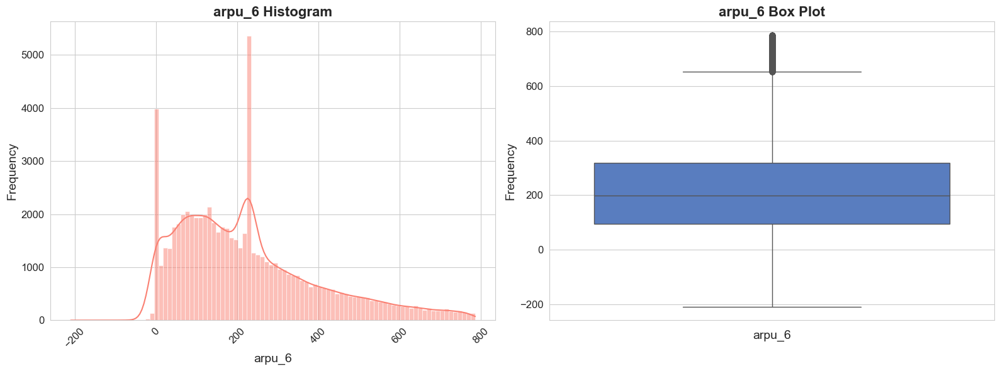

Initiating detailed analysis of arpu_7...

Statistical summary for arpu_7:
count    69999.000000
mean       223.454738
std        176.874217
min       -282.788000
25%         86.743500
50%        191.651000
75%        312.378000
max        783.237000
Name: arpu_7, dtype: float64

The mode of arpu_7 is: 223.45473827313924



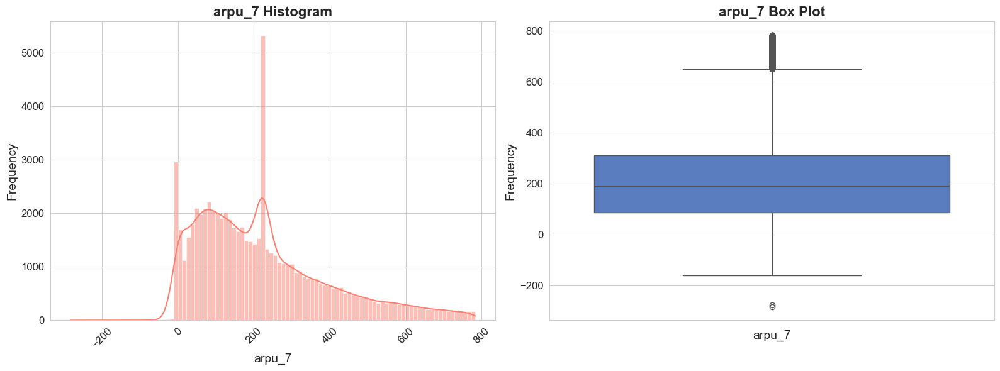

Initiating detailed analysis of arpu_8...

Statistical summary for arpu_8:
count    69999.000000
mean       224.602897
std        181.480423
min       -197.957000
25%         84.118500
50%        192.253000
75%        318.722000
max        798.627000
Name: arpu_8, dtype: float64

The mode of arpu_8 is: 0.0



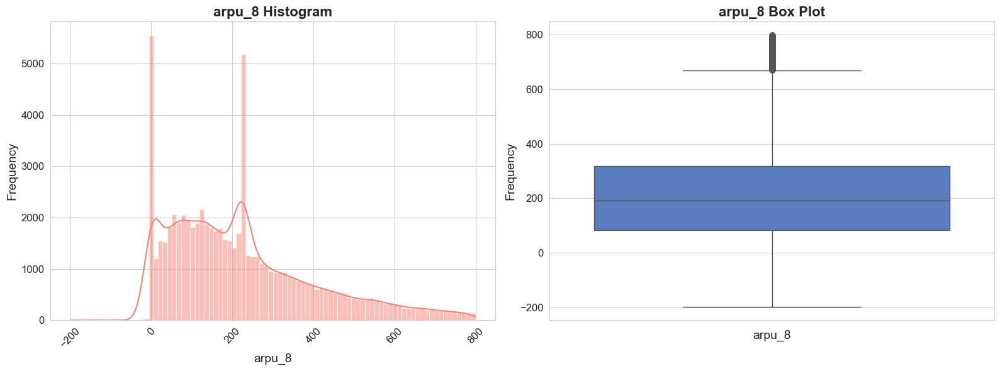

Initiating detailed analysis of arpu_3g_6...

Statistical summary for arpu_3g_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: arpu_3g_6, dtype: float64

The mode of arpu_3g_6 is: 0.0



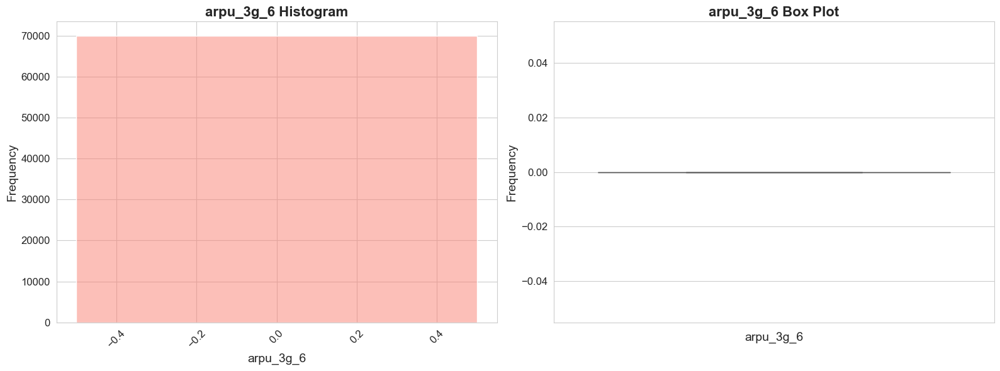

Initiating detailed analysis of arpu_3g_7...

Statistical summary for arpu_3g_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: arpu_3g_7, dtype: float64

The mode of arpu_3g_7 is: 0.0



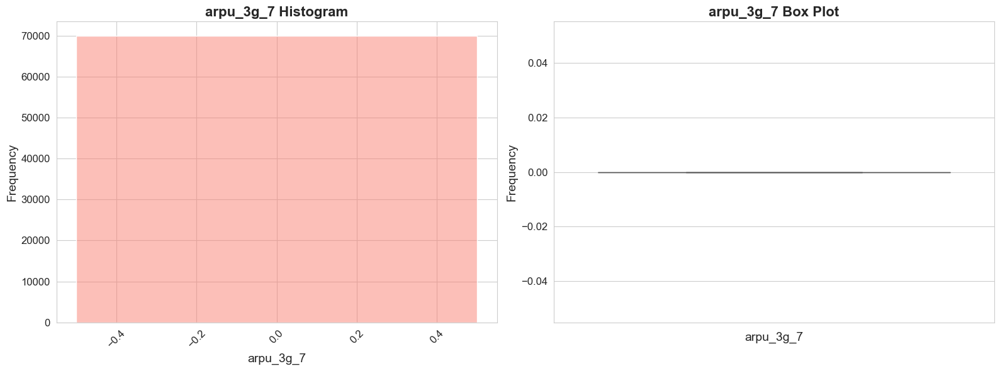

Initiating detailed analysis of arpu_3g_8...

Statistical summary for arpu_3g_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: arpu_3g_8, dtype: float64

The mode of arpu_3g_8 is: 0.0



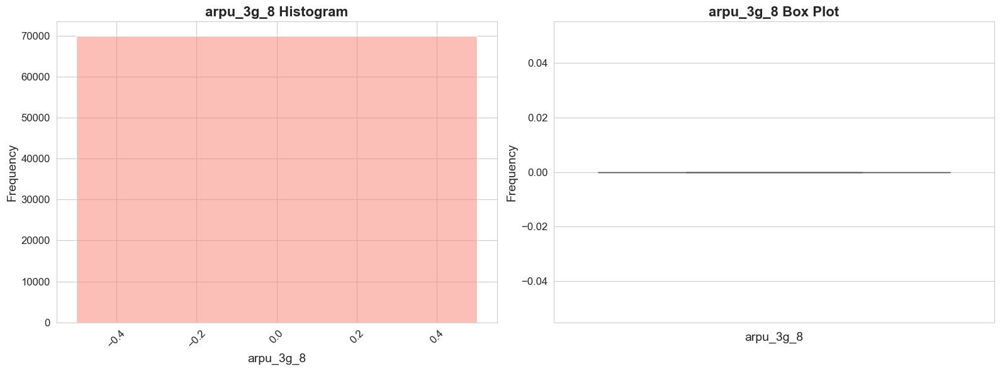

Initiating detailed analysis of arpu_2g_6...

Statistical summary for arpu_2g_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: arpu_2g_6, dtype: float64

The mode of arpu_2g_6 is: 0.0



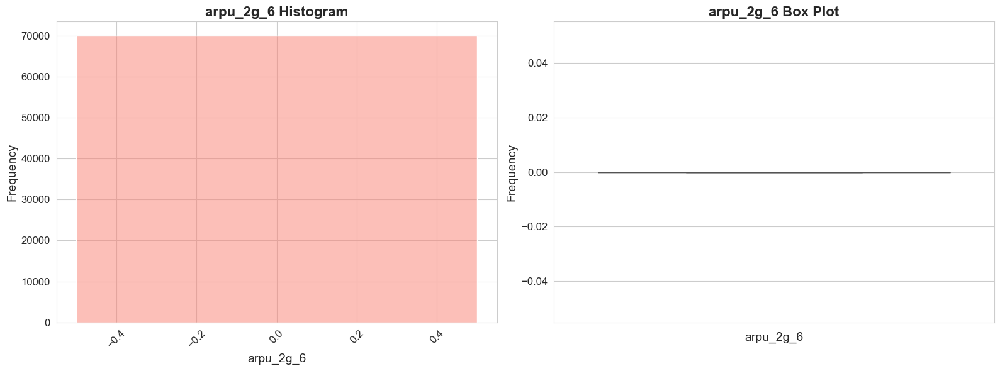

Initiating detailed analysis of arpu_2g_7...

Statistical summary for arpu_2g_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: arpu_2g_7, dtype: float64

The mode of arpu_2g_7 is: 0.0



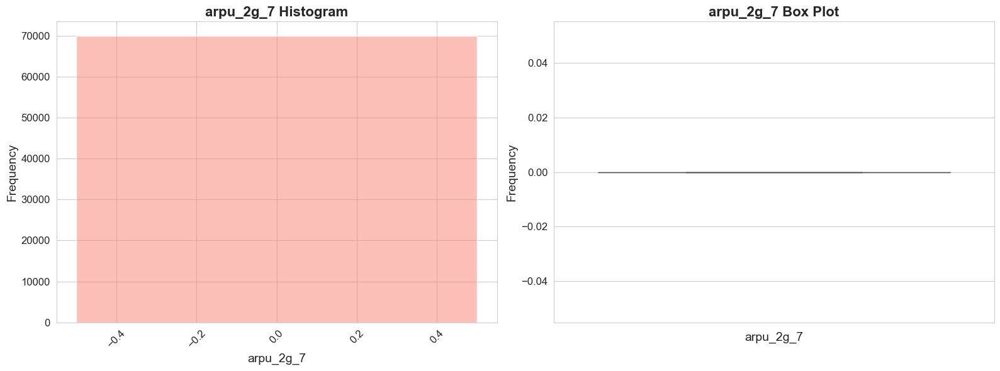

Initiating detailed analysis of arpu_2g_8...

Statistical summary for arpu_2g_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: arpu_2g_8, dtype: float64

The mode of arpu_2g_8 is: 0.0



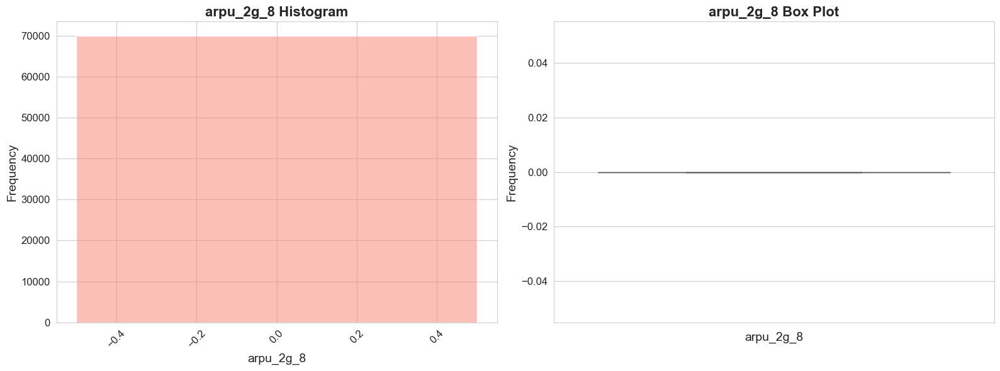

In [30]:
# Analysing for ARPU (Average Revenue Per User)
arpu_group = data_groups['ARPU (Average Revenue Per User)']
for arpu in arpu_group:
    univariate_analysis = UnivariateAnalysis(df_train_clean, arpu)
    univariate_analysis.analyze_without_bins()

Initiating detailed analysis of onnet_mou_6...

Statistical summary for onnet_mou_6:
count    69999.000000
mean        52.219743
std         59.496112
min          0.000000
25%          8.060000
50%         37.730000
75%         60.860000
max        287.240000
Name: onnet_mou_6, dtype: float64

The mode of onnet_mou_6 is: 52.219743173556516



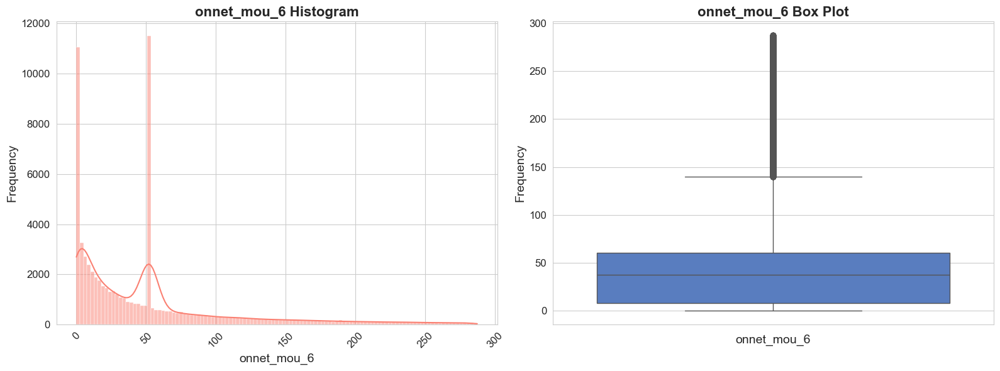

Initiating detailed analysis of onnet_mou_7...

Statistical summary for onnet_mou_7:
count    69999.000000
mean        49.791241
std         57.656576
min          0.000000
25%          7.260000
50%         35.690000
75%         57.280000
max        279.580000
Name: onnet_mou_7, dtype: float64

The mode of onnet_mou_7 is: 49.79124105901895



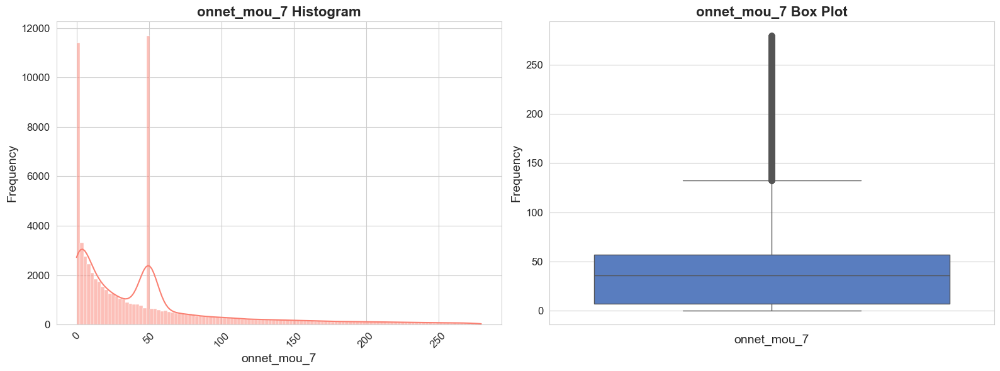

Initiating detailed analysis of onnet_mou_8...

Statistical summary for onnet_mou_8:
count    69999.000000
mean        49.624534
std         57.114221
min          0.000000
25%          7.360000
50%         36.790000
75%         55.830000
max        278.030000
Name: onnet_mou_8, dtype: float64

The mode of onnet_mou_8 is: 49.62453367741936



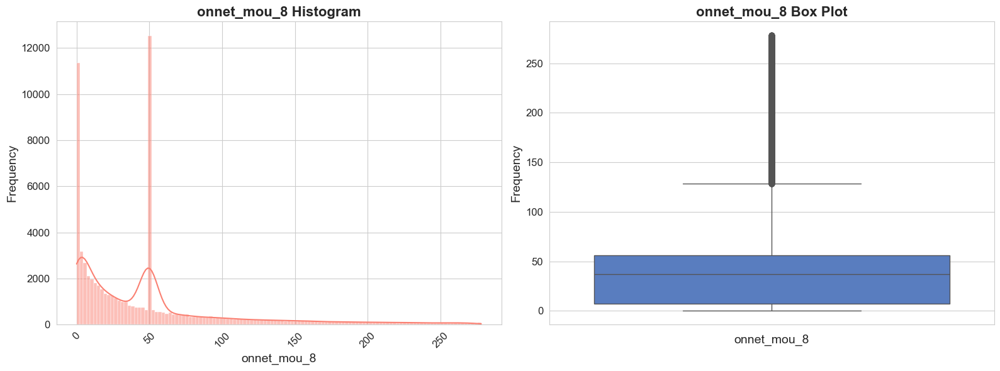

Initiating detailed analysis of offnet_mou_6...

Statistical summary for offnet_mou_6:
count    69999.000000
mean       124.834477
std        115.633674
min          0.000000
25%         36.880000
50%        103.830000
75%        162.935000
max        530.130000
Name: offnet_mou_6, dtype: float64

The mode of offnet_mou_6 is: 124.83447665056359



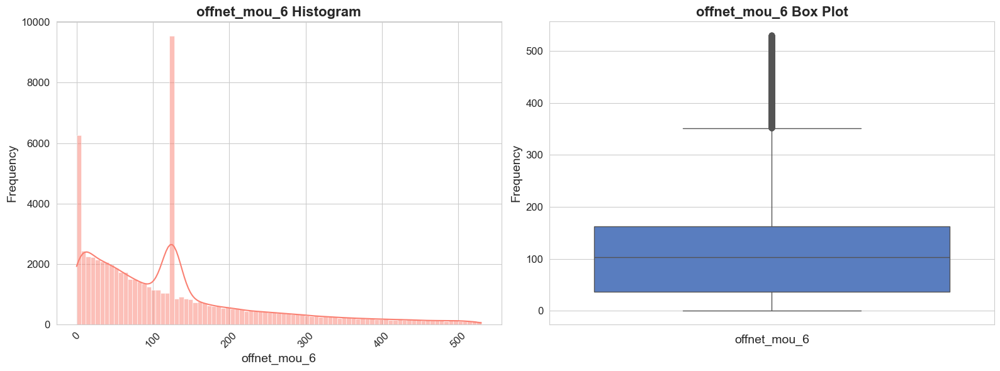

Initiating detailed analysis of offnet_mou_7...

Statistical summary for offnet_mou_7:
count    69999.000000
mean       120.141415
std        113.286864
min          0.000000
25%         33.980000
50%         98.580000
75%        156.530000
max        520.610000
Name: offnet_mou_7, dtype: float64

The mode of offnet_mou_7 is: 120.1414152405501



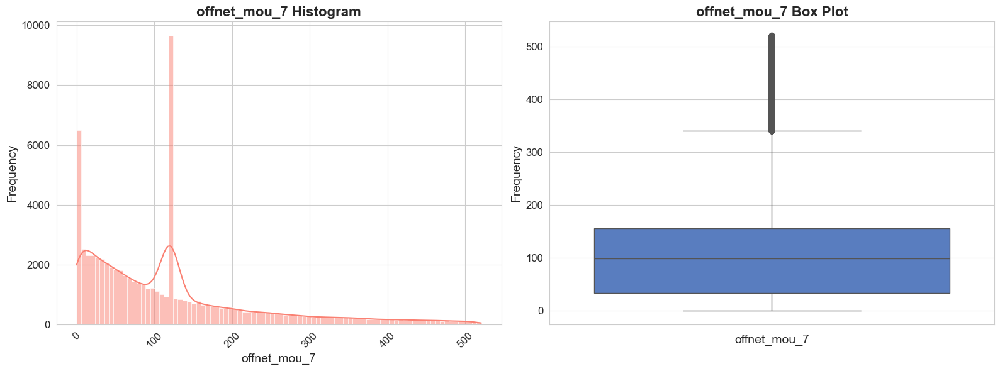

Initiating detailed analysis of offnet_mou_8...

Statistical summary for offnet_mou_8:
count    69999.000000
mean       120.663087
std        113.763113
min          0.000000
25%         34.390000
50%        101.680000
75%        153.890000
max        525.960000
Name: offnet_mou_8, dtype: float64

The mode of offnet_mou_8 is: 120.66308723721238



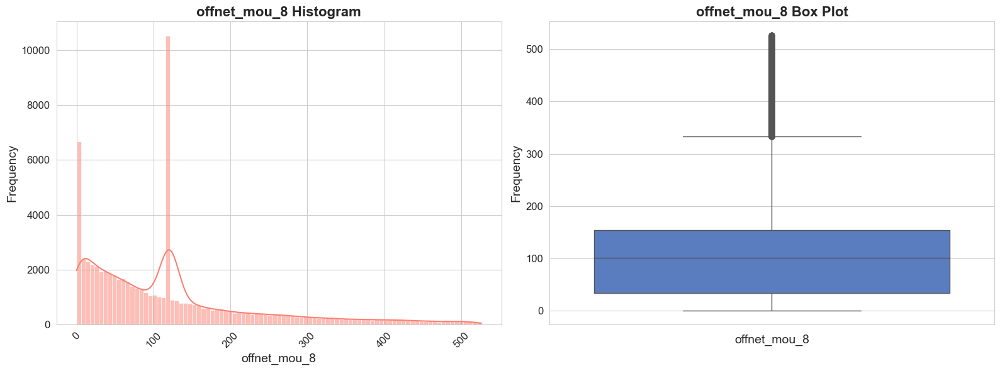

Initiating detailed analysis of roam_ic_mou_6...

Statistical summary for roam_ic_mou_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: roam_ic_mou_6, dtype: float64

The mode of roam_ic_mou_6 is: 0.0



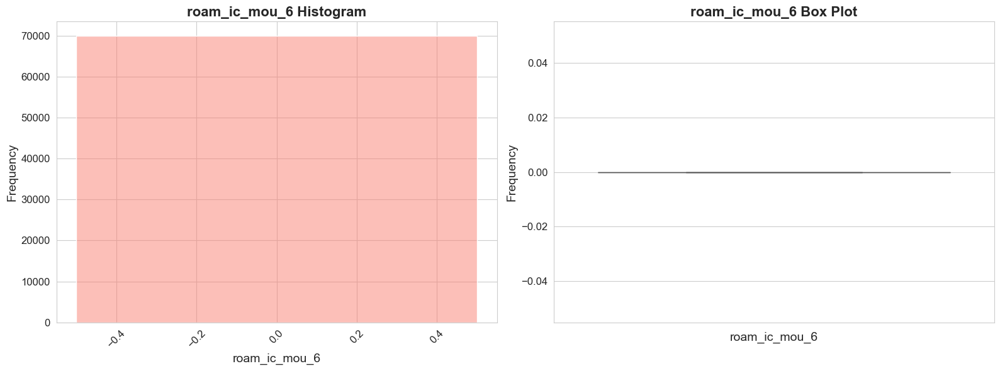

Initiating detailed analysis of roam_ic_mou_7...

Statistical summary for roam_ic_mou_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: roam_ic_mou_7, dtype: float64

The mode of roam_ic_mou_7 is: 0.0



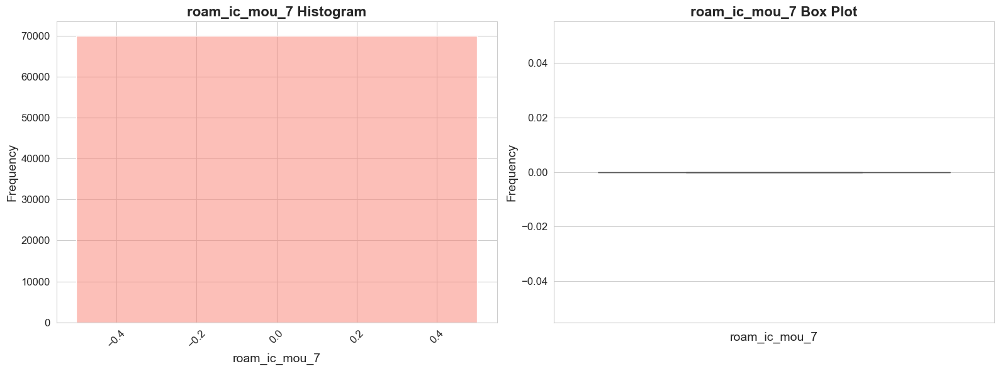

Initiating detailed analysis of roam_ic_mou_8...

Statistical summary for roam_ic_mou_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: roam_ic_mou_8, dtype: float64

The mode of roam_ic_mou_8 is: 0.0



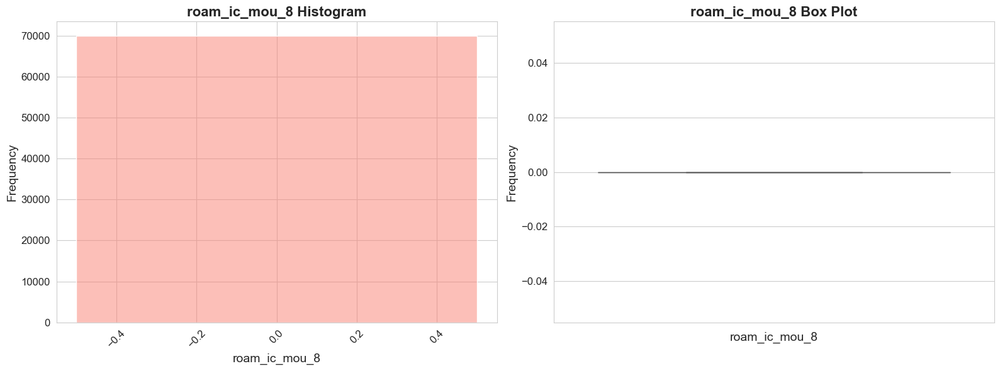

Initiating detailed analysis of roam_og_mou_6...

Statistical summary for roam_og_mou_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: roam_og_mou_6, dtype: float64

The mode of roam_og_mou_6 is: 0.0



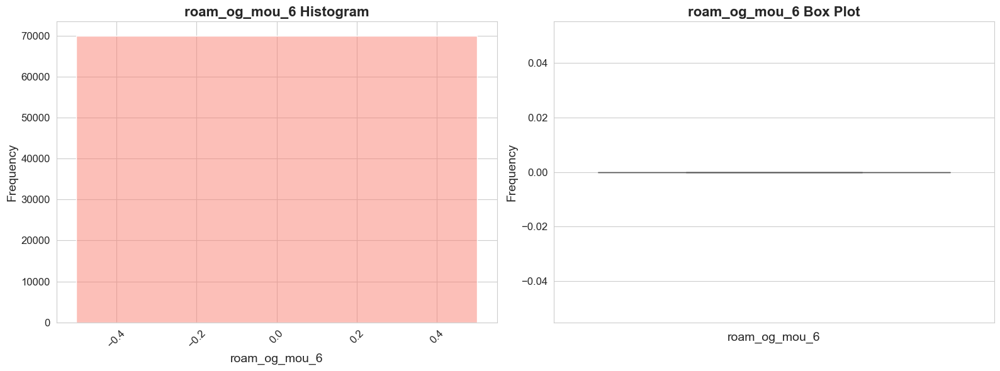

Initiating detailed analysis of roam_og_mou_7...

Statistical summary for roam_og_mou_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: roam_og_mou_7, dtype: float64

The mode of roam_og_mou_7 is: 0.0



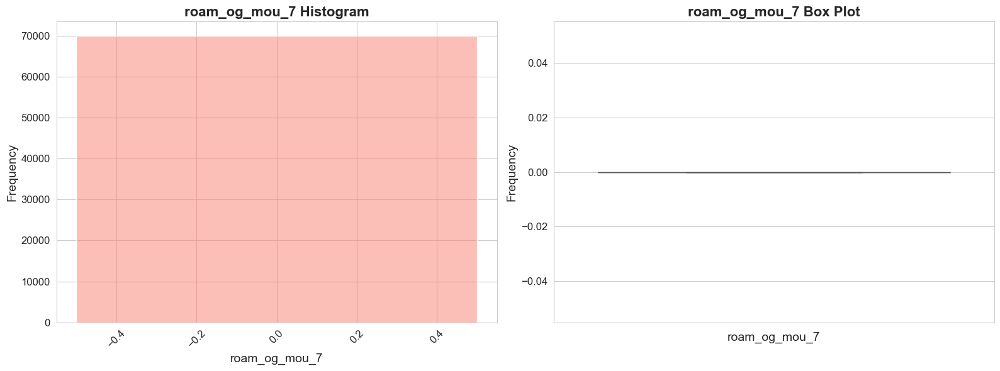

Initiating detailed analysis of roam_og_mou_8...

Statistical summary for roam_og_mou_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: roam_og_mou_8, dtype: float64

The mode of roam_og_mou_8 is: 0.0



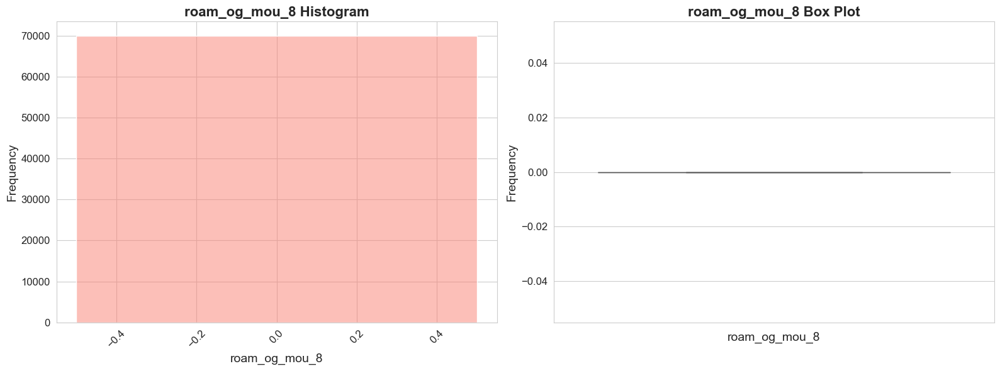

Initiating detailed analysis of loc_og_t2t_mou_6...

Statistical summary for loc_og_t2t_mou_6:
count    69999.000000
mean        18.511635
std         21.366518
min          0.000000
25%          1.930000
50%         13.230000
75%         23.080000
max         99.360000
Name: loc_og_t2t_mou_6, dtype: float64

The mode of loc_og_t2t_mou_6 is: 0.0



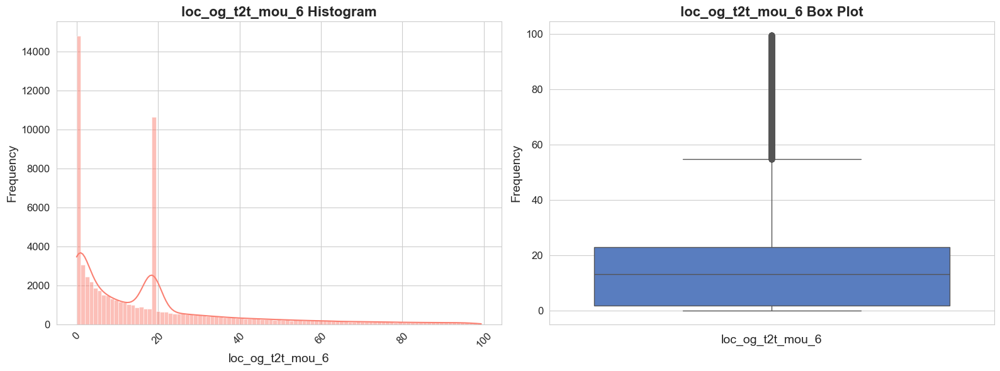

Initiating detailed analysis of loc_og_t2t_mou_7...

Statistical summary for loc_og_t2t_mou_7:
count    69999.000000
mean        18.081027
std         20.871440
min          0.000000
25%          1.880000
50%         12.840000
75%         22.580000
max         96.910000
Name: loc_og_t2t_mou_7, dtype: float64

The mode of loc_og_t2t_mou_7 is: 0.0



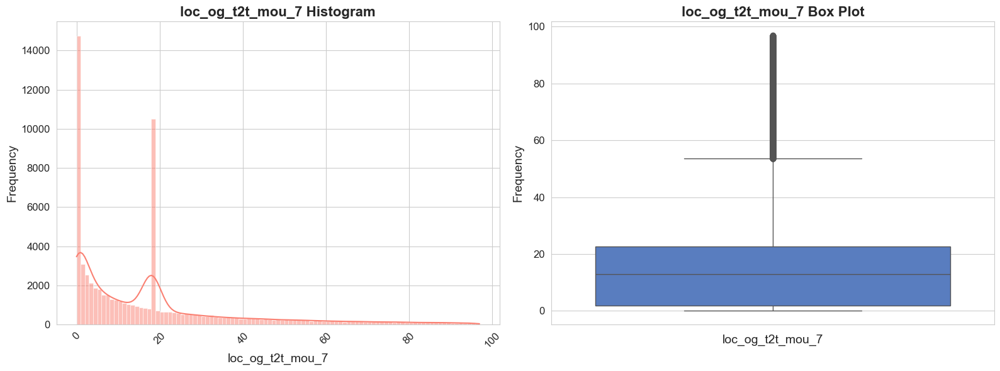

Initiating detailed analysis of loc_og_t2t_mou_8...

Statistical summary for loc_og_t2t_mou_8:
count    69999.000000
mean        18.194950
std         20.810073
min          0.000000
25%          1.950000
50%         13.540000
75%         22.490000
max         97.310000
Name: loc_og_t2t_mou_8, dtype: float64

The mode of loc_og_t2t_mou_8 is: 0.0



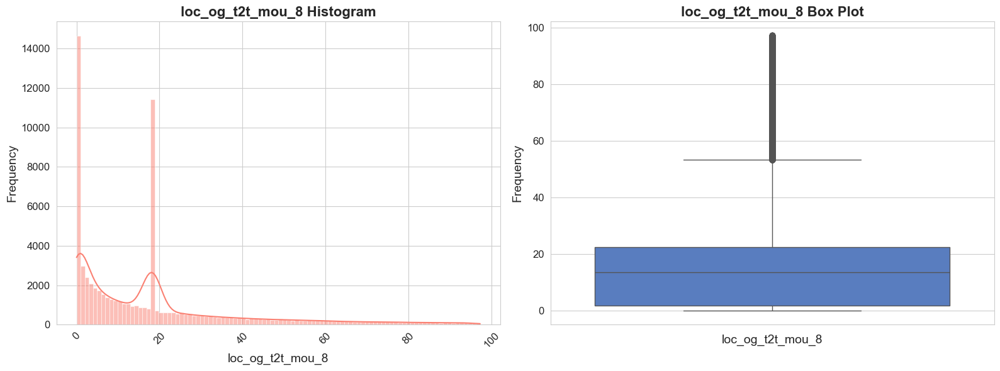

Initiating detailed analysis of loc_og_t2m_mou_6...

Statistical summary for loc_og_t2m_mou_6:
count    69999.000000
mean        56.776713
std         58.082923
min          0.000000
25%         10.830000
50%         44.640000
75%         76.190000
max        261.190000
Name: loc_og_t2m_mou_6, dtype: float64

The mode of loc_og_t2m_mou_6 is: 56.776712520098094



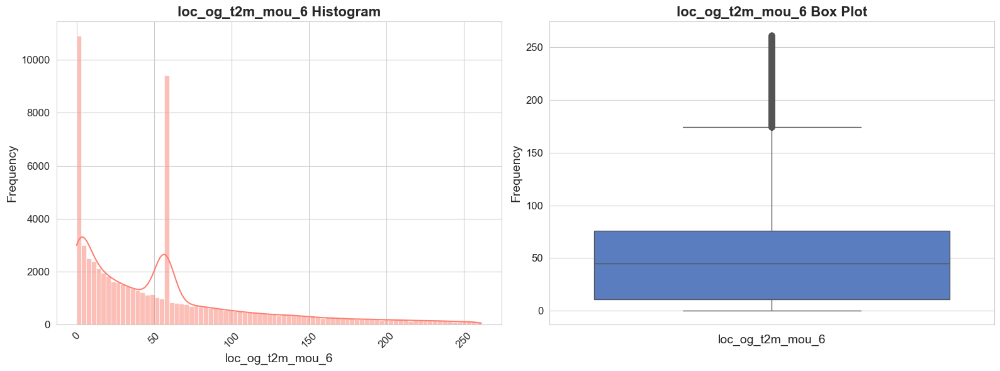

Initiating detailed analysis of loc_og_t2m_mou_7...

Statistical summary for loc_og_t2m_mou_7:
count    69999.000000
mean        55.390512
std         56.471321
min          0.000000
25%         10.935000
50%         43.490000
75%         73.640000
max        253.710000
Name: loc_og_t2m_mou_7, dtype: float64

The mode of loc_og_t2m_mou_7 is: 55.39051180079862



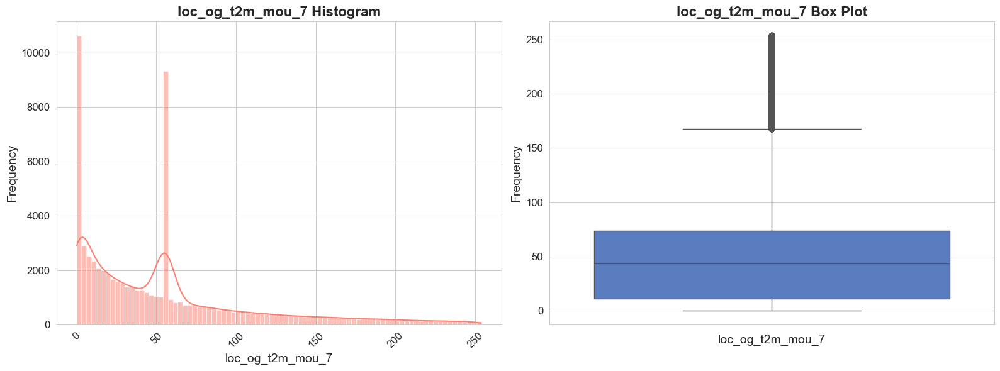

Initiating detailed analysis of loc_og_t2m_mou_8...

Statistical summary for loc_og_t2m_mou_8:
count    69999.000000
mean        56.139074
std         57.122381
min          0.000000
25%         11.140000
50%         45.130000
75%         73.610000
max        258.340000
Name: loc_og_t2m_mou_8, dtype: float64

The mode of loc_og_t2m_mou_8 is: 56.139073860642775



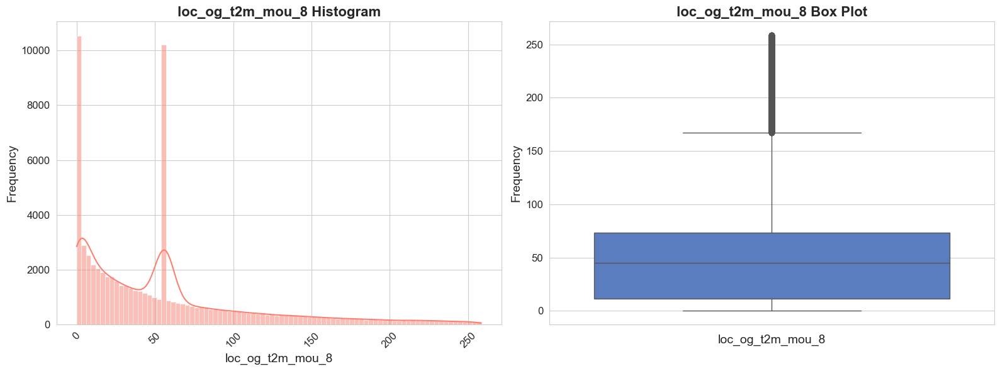

Initiating detailed analysis of loc_og_t2f_mou_6...

Statistical summary for loc_og_t2f_mou_6:
count    69999.000000
mean         0.546766
std          1.010661
min          0.000000
25%          0.000000
50%          0.000000
75%          0.546766
max          5.150000
Name: loc_og_t2f_mou_6, dtype: float64

The mode of loc_og_t2f_mou_6 is: 0.0



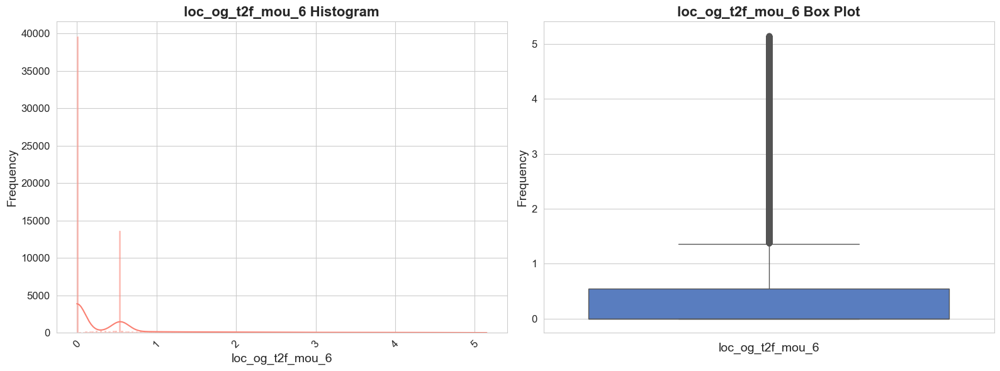

Initiating detailed analysis of loc_og_t2f_mou_7...

Statistical summary for loc_og_t2f_mou_7:
count    69999.000000
mean         0.559356
std          1.026357
min          0.000000
25%          0.000000
50%          0.000000
75%          0.559356
max          5.200000
Name: loc_og_t2f_mou_7, dtype: float64

The mode of loc_og_t2f_mou_7 is: 0.0



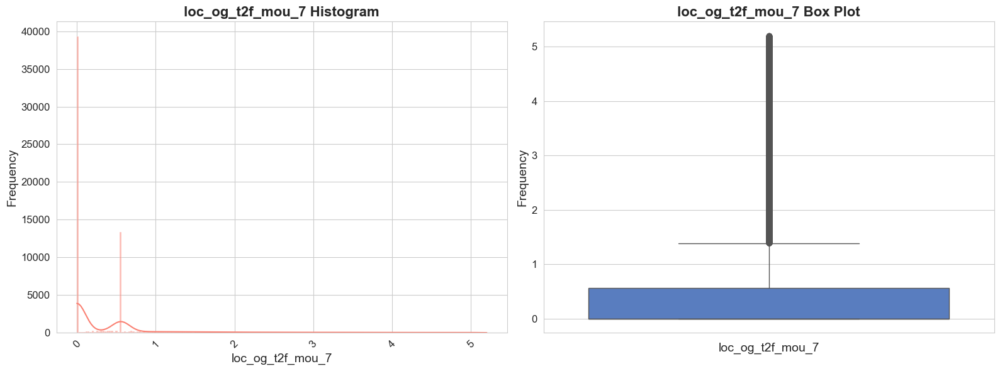

Initiating detailed analysis of loc_og_t2f_mou_8...

Statistical summary for loc_og_t2f_mou_8:
count    69999.000000
mean         0.540124
std          0.992572
min          0.000000
25%          0.000000
50%          0.000000
75%          0.540124
max          5.060000
Name: loc_og_t2f_mou_8, dtype: float64

The mode of loc_og_t2f_mou_8 is: 0.0



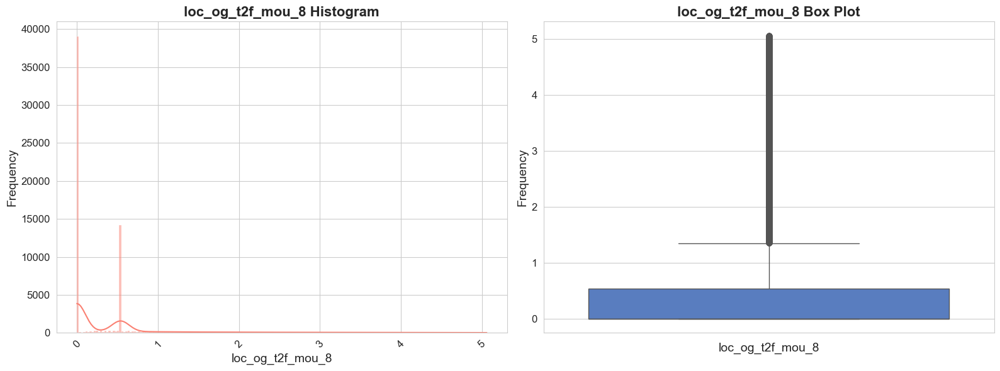

Initiating detailed analysis of loc_og_t2c_mou_6...

Statistical summary for loc_og_t2c_mou_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: loc_og_t2c_mou_6, dtype: float64

The mode of loc_og_t2c_mou_6 is: 0.0



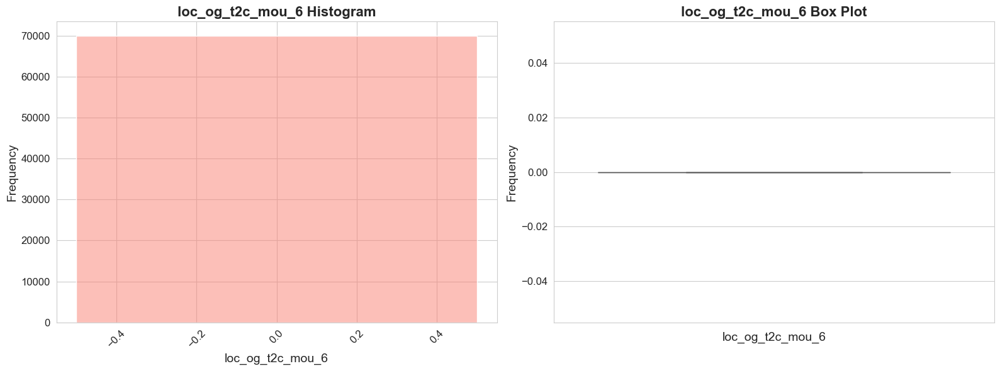

Initiating detailed analysis of loc_og_t2c_mou_7...

Statistical summary for loc_og_t2c_mou_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: loc_og_t2c_mou_7, dtype: float64

The mode of loc_og_t2c_mou_7 is: 0.0



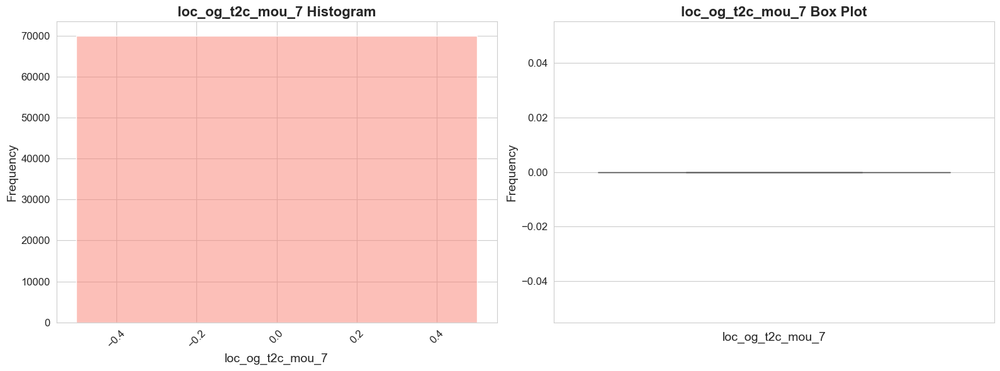

Initiating detailed analysis of loc_og_t2c_mou_8...

Statistical summary for loc_og_t2c_mou_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: loc_og_t2c_mou_8, dtype: float64

The mode of loc_og_t2c_mou_8 is: 0.0



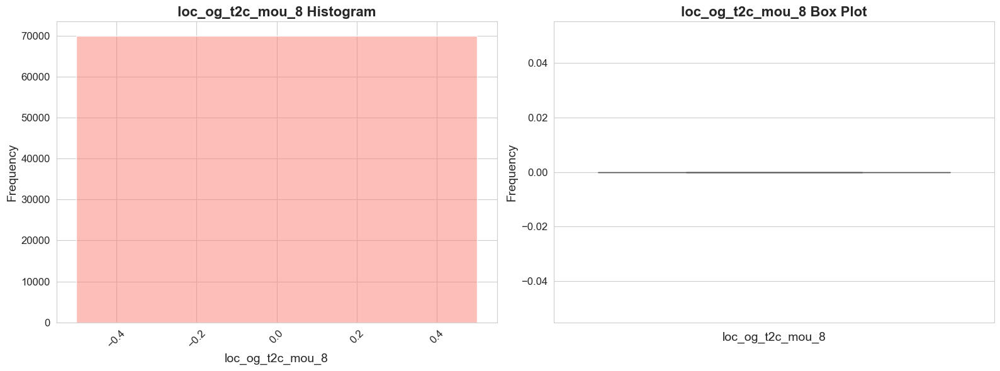

Initiating detailed analysis of loc_og_mou_6...

Statistical summary for loc_og_mou_6:
count    69999.000000
mean        87.466570
std         87.183716
min          0.000000
25%         18.730000
50%         70.680000
75%        116.510000
max        393.840000
Name: loc_og_mou_6, dtype: float64

The mode of loc_og_mou_6 is: 87.4665703554356



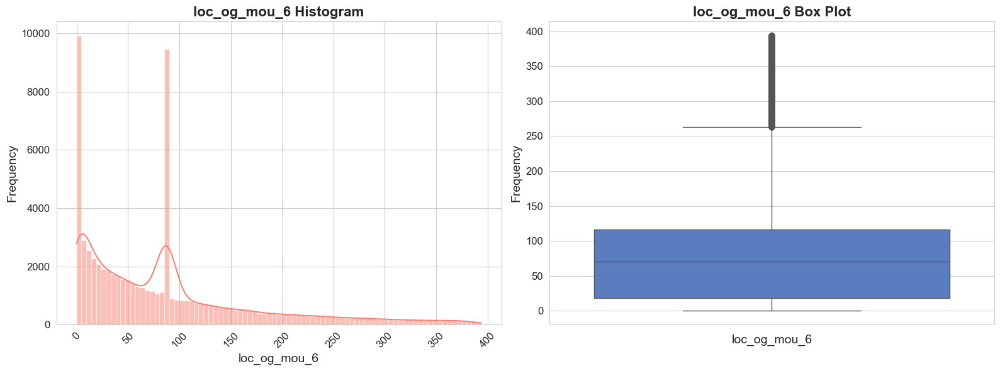

Initiating detailed analysis of loc_og_mou_7...

Statistical summary for loc_og_mou_7:
count    69999.000000
mean        85.125441
std         84.491410
min          0.000000
25%         18.950000
50%         68.390000
75%        112.685000
max        383.430000
Name: loc_og_mou_7, dtype: float64

The mode of loc_og_mou_7 is: 85.12544074134287



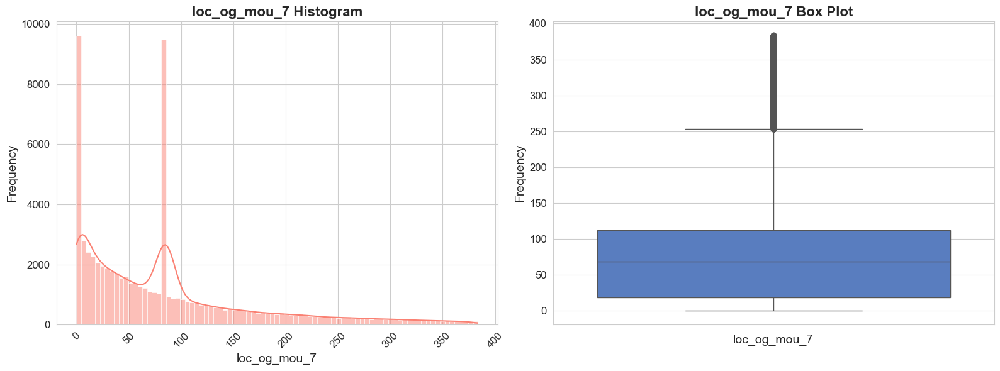

Initiating detailed analysis of loc_og_mou_8...

Statistical summary for loc_og_mou_8:
count    69999.000000
mean        86.129990
std         85.326625
min          0.000000
25%         19.240000
50%         70.510000
75%        113.260000
max        388.160000
Name: loc_og_mou_8, dtype: float64

The mode of loc_og_mou_8 is: 86.12999011580976



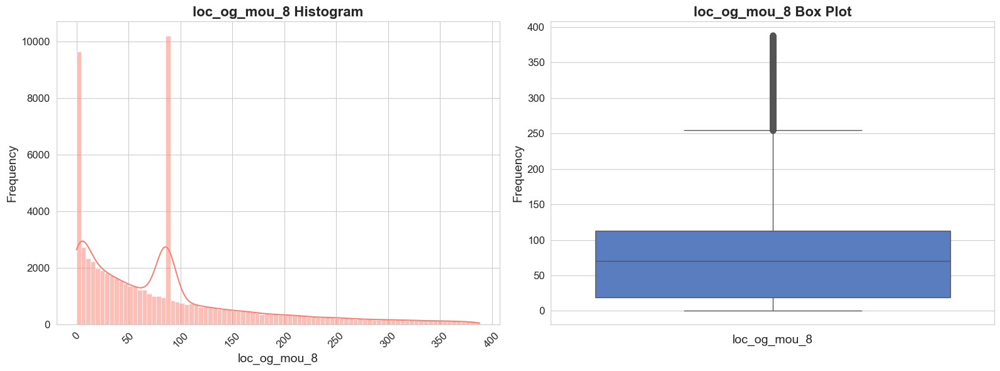

Initiating detailed analysis of std_og_t2t_mou_6...

Statistical summary for std_og_t2t_mou_6:
count    69999.000000
mean         6.790910
std         13.567209
min          0.000000
25%          0.000000
50%          0.000000
75%          6.790910
max         77.540000
Name: std_og_t2t_mou_6, dtype: float64

The mode of std_og_t2t_mou_6 is: 0.0



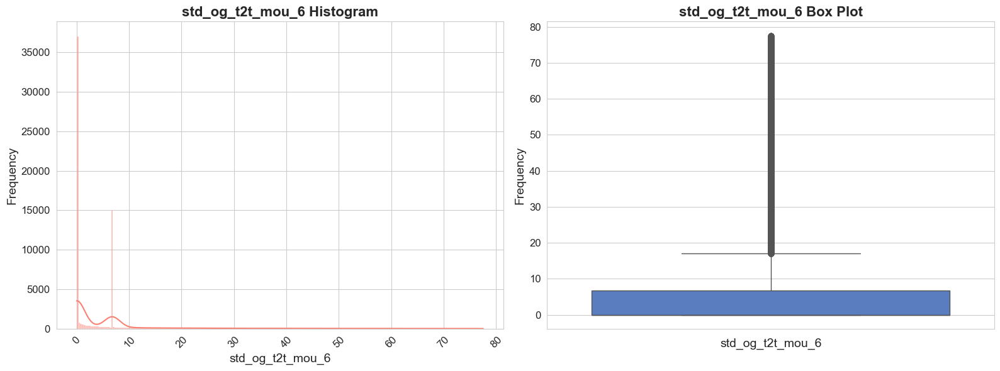

Initiating detailed analysis of std_og_t2t_mou_7...

Statistical summary for std_og_t2t_mou_7:
count    69999.000000
mean         6.850900
std         13.691683
min          0.000000
25%          0.000000
50%          0.000000
75%          6.850900
max         78.230000
Name: std_og_t2t_mou_7, dtype: float64

The mode of std_og_t2t_mou_7 is: 0.0



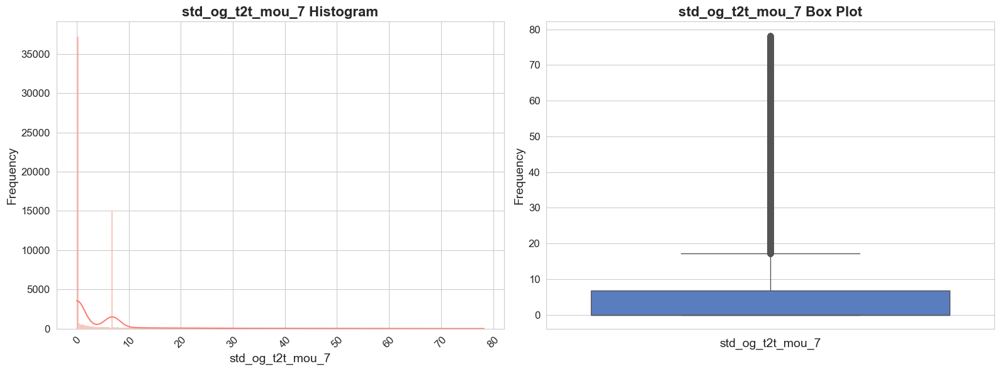

Initiating detailed analysis of std_og_t2t_mou_8...

Statistical summary for std_og_t2t_mou_8:
count    69999.000000
mean         6.532151
std         13.181845
min          0.000000
25%          0.000000
50%          0.000000
75%          6.532151
max         76.890000
Name: std_og_t2t_mou_8, dtype: float64

The mode of std_og_t2t_mou_8 is: 0.0



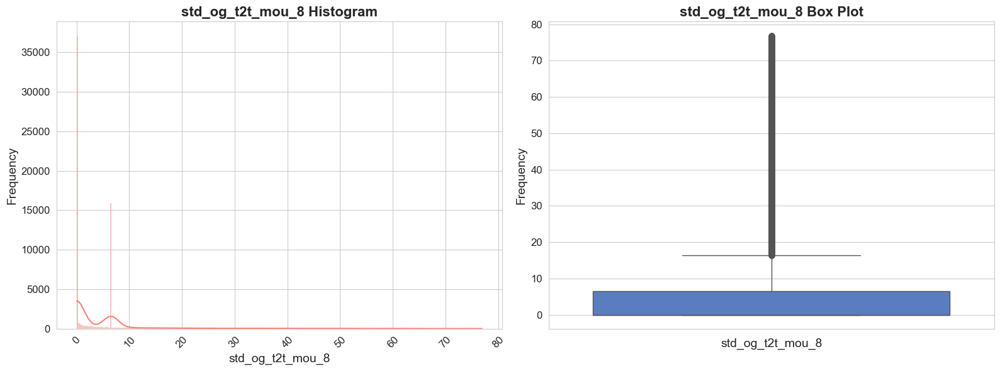

Initiating detailed analysis of std_og_t2m_mou_6...

Statistical summary for std_og_t2m_mou_6:
count    69999.000000
mean        16.462894
std         26.474840
min          0.000000
25%          0.000000
50%          5.330000
75%         16.462894
max        134.360000
Name: std_og_t2m_mou_6, dtype: float64

The mode of std_og_t2m_mou_6 is: 0.0



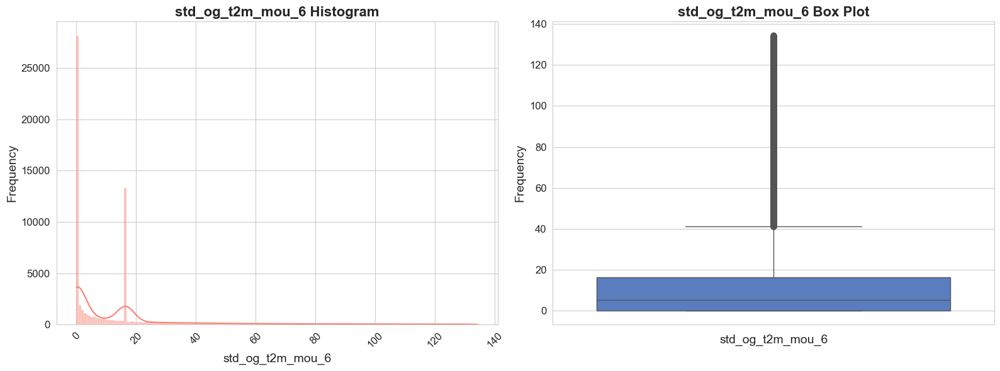

Initiating detailed analysis of std_og_t2m_mou_7...

Statistical summary for std_og_t2m_mou_7:
count    69999.000000
mean        16.418107
std         26.744942
min          0.000000
25%          0.000000
50%          4.960000
75%         16.418107
max        136.590000
Name: std_og_t2m_mou_7, dtype: float64

The mode of std_og_t2m_mou_7 is: 0.0



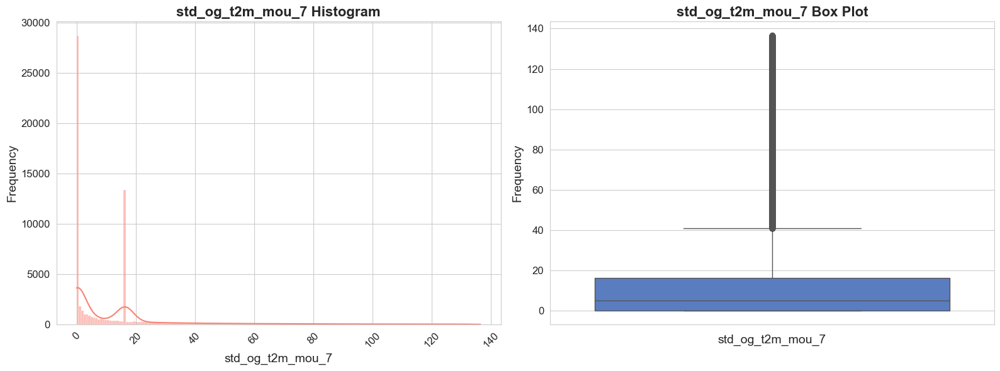

Initiating detailed analysis of std_og_t2m_mou_8...

Statistical summary for std_og_t2m_mou_8:
count    69999.000000
mean        15.543616
std         25.349023
min          0.000000
25%          0.000000
50%          5.130000
75%         15.543616
max        131.640000
Name: std_og_t2m_mou_8, dtype: float64

The mode of std_og_t2m_mou_8 is: 0.0



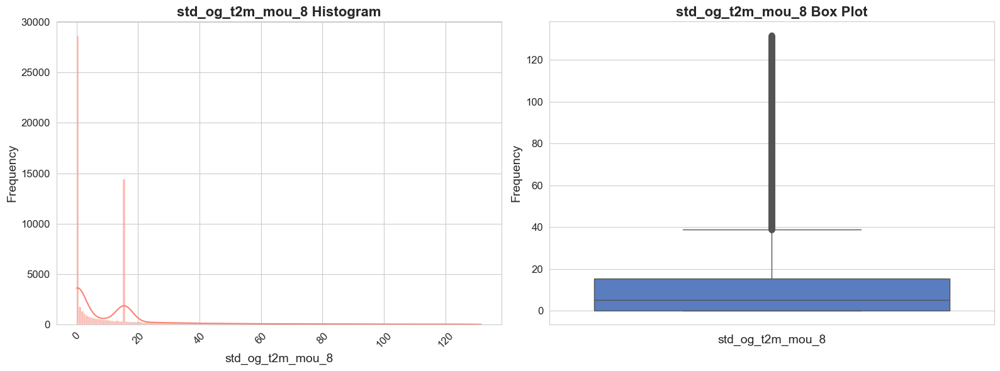

Initiating detailed analysis of std_og_t2f_mou_6...

Statistical summary for std_og_t2f_mou_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_og_t2f_mou_6, dtype: float64

The mode of std_og_t2f_mou_6 is: 0.0



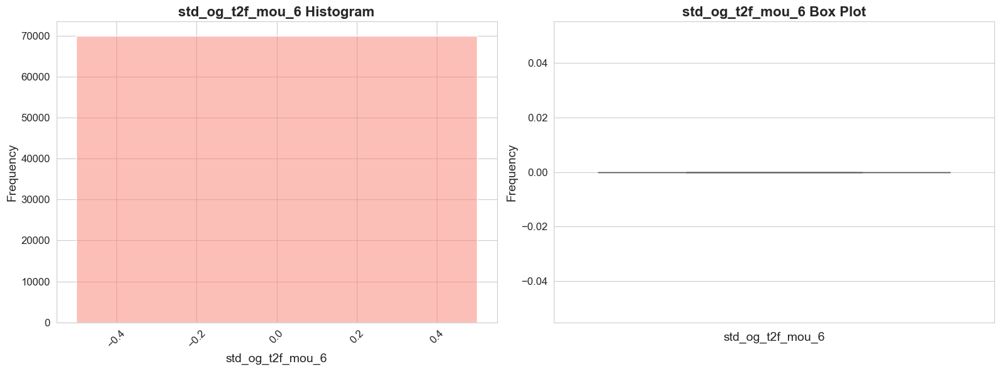

Initiating detailed analysis of std_og_t2f_mou_7...

Statistical summary for std_og_t2f_mou_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_og_t2f_mou_7, dtype: float64

The mode of std_og_t2f_mou_7 is: 0.0



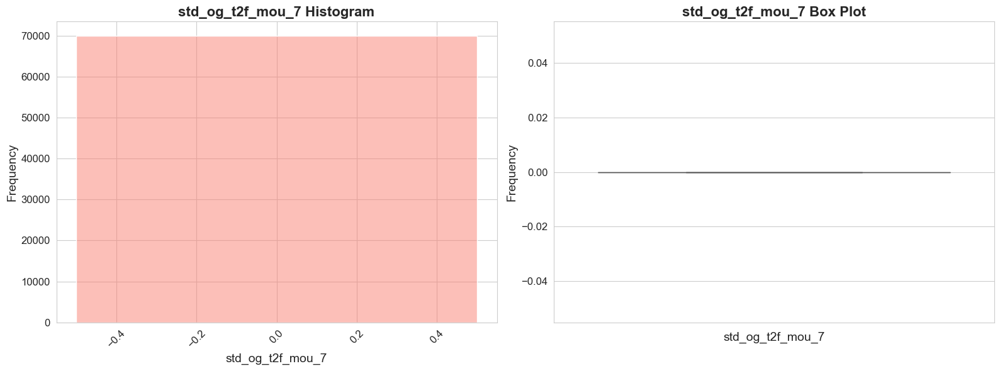

Initiating detailed analysis of std_og_t2f_mou_8...

Statistical summary for std_og_t2f_mou_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_og_t2f_mou_8, dtype: float64

The mode of std_og_t2f_mou_8 is: 0.0



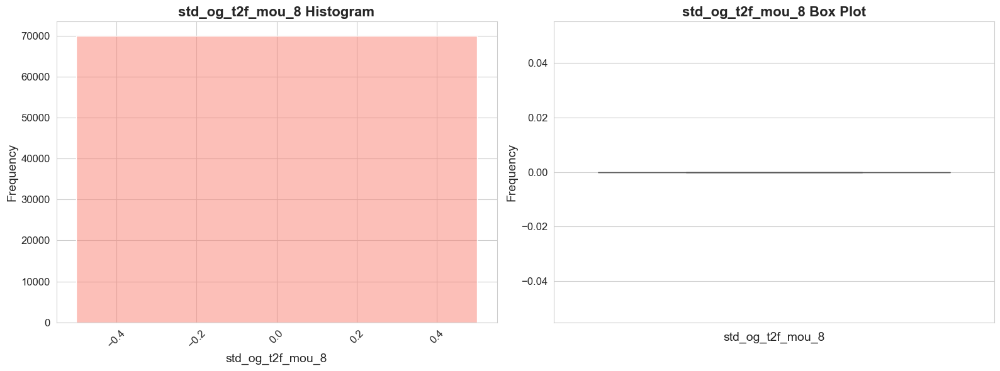

Initiating detailed analysis of std_og_mou_6...

Statistical summary for std_og_mou_6:
count    69999.000000
mean        47.511076
std         75.054688
min          0.000000
25%          0.000000
50%         14.990000
75%         47.511076
max        365.730000
Name: std_og_mou_6, dtype: float64

The mode of std_og_mou_6 is: 0.0



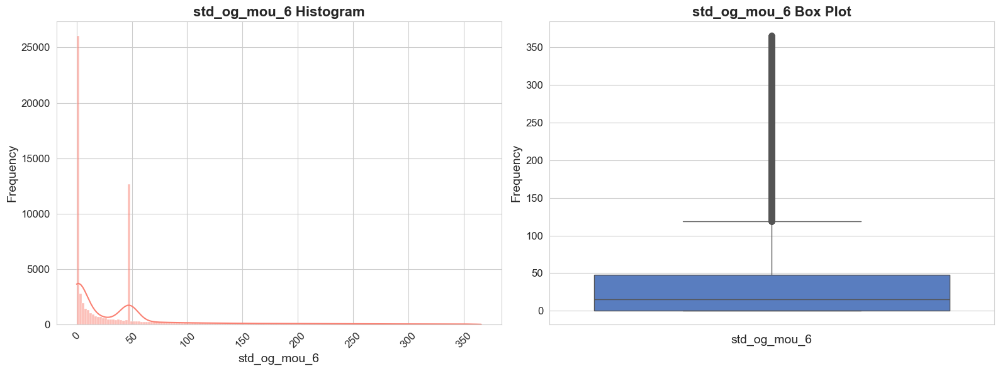

Initiating detailed analysis of std_og_mou_7...

Statistical summary for std_og_mou_7:
count    69999.000000
mean        48.462577
std         77.797673
min          0.000000
25%          0.000000
50%         14.210000
75%         48.462577
max        379.060000
Name: std_og_mou_7, dtype: float64

The mode of std_og_mou_7 is: 0.0



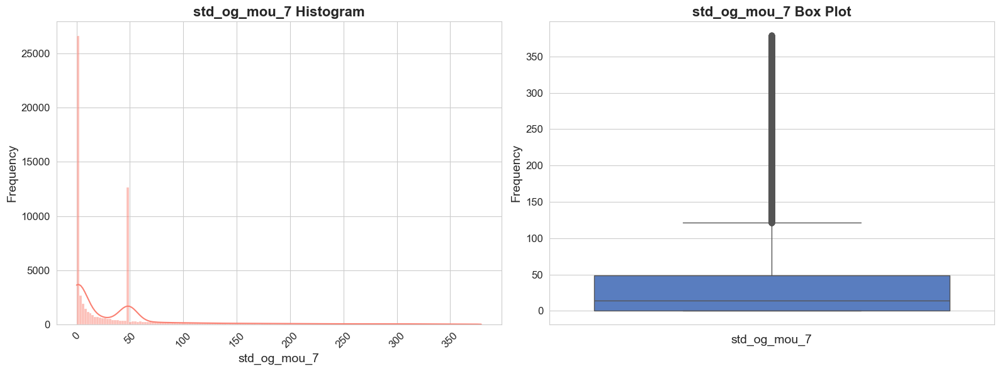

Initiating detailed analysis of std_og_mou_8...

Statistical summary for std_og_mou_8:
count    69999.000000
mean        46.885220
std         75.332834
min          0.000000
25%          0.000000
50%         14.660000
75%         46.885220
max        372.510000
Name: std_og_mou_8, dtype: float64

The mode of std_og_mou_8 is: 0.0



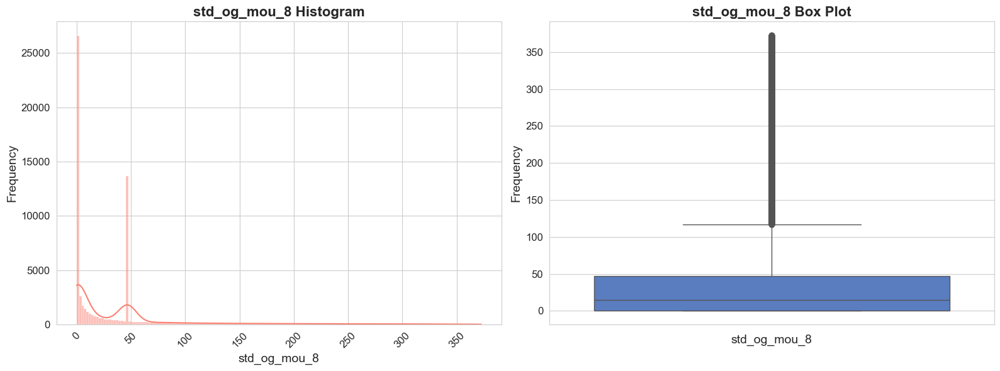

Initiating detailed analysis of isd_og_mou_6...

Statistical summary for isd_og_mou_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: isd_og_mou_6, dtype: float64

The mode of isd_og_mou_6 is: 0.0



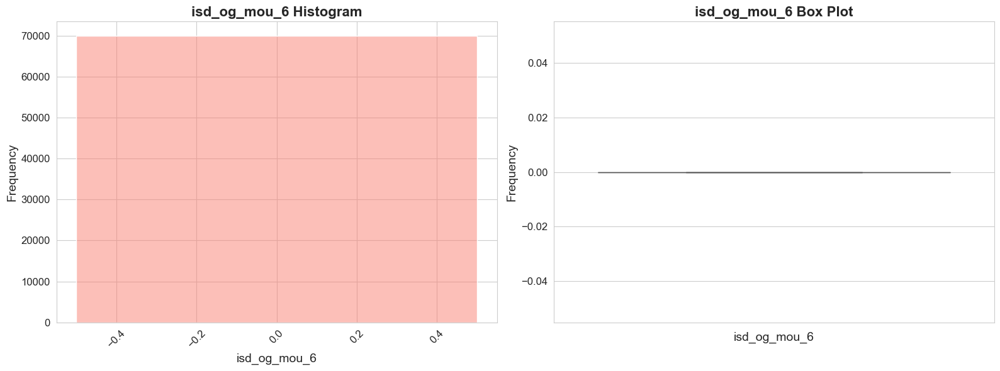

Initiating detailed analysis of isd_og_mou_7...

Statistical summary for isd_og_mou_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: isd_og_mou_7, dtype: float64

The mode of isd_og_mou_7 is: 0.0



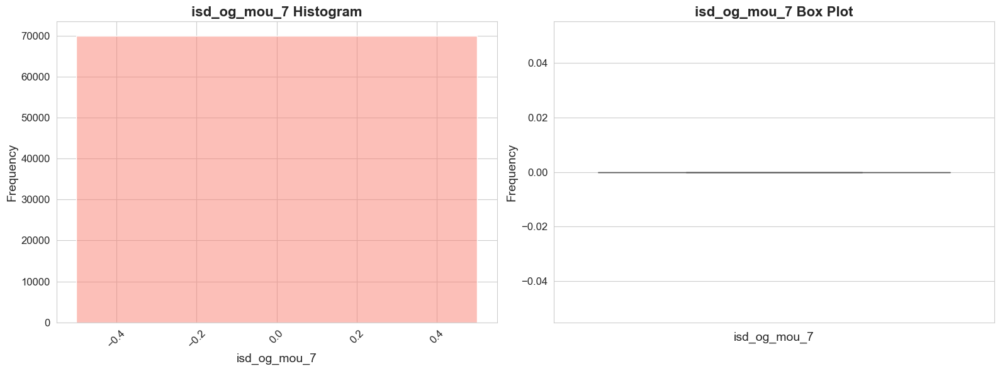

Initiating detailed analysis of isd_og_mou_8...

Statistical summary for isd_og_mou_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: isd_og_mou_8, dtype: float64

The mode of isd_og_mou_8 is: 0.0



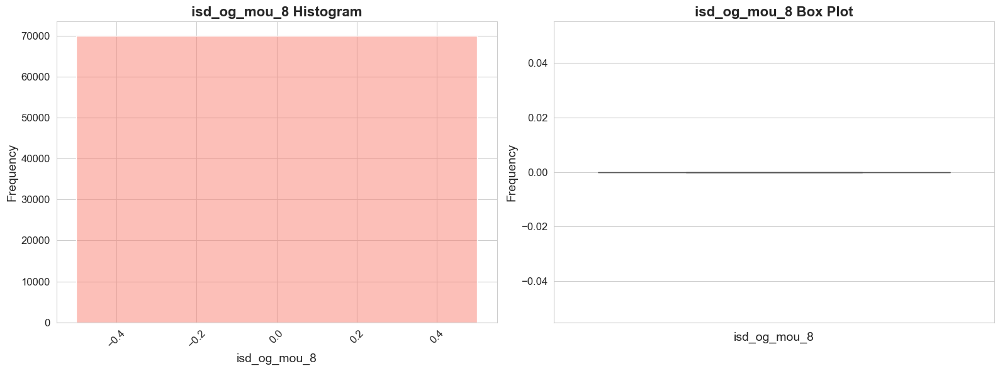

Initiating detailed analysis of spl_og_mou_6...

Statistical summary for spl_og_mou_6:
count    69999.000000
mean         0.631684
std          1.179826
min          0.000000
25%          0.000000
50%          0.000000
75%          0.631684
max          6.000000
Name: spl_og_mou_6, dtype: float64

The mode of spl_og_mou_6 is: 0.0



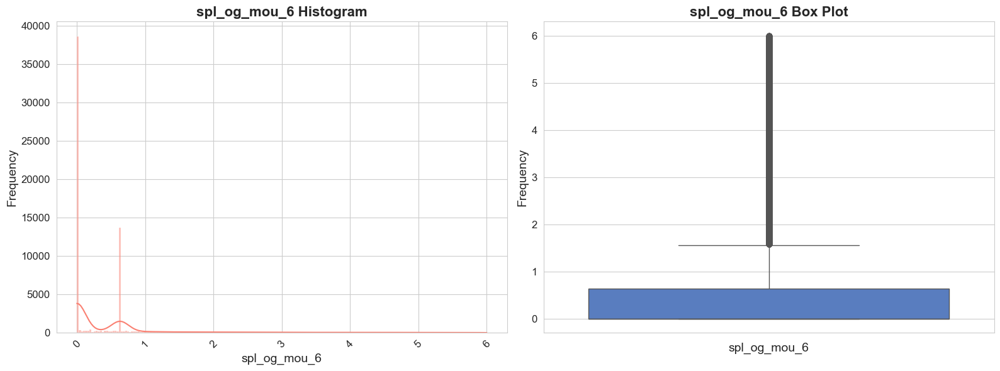

Initiating detailed analysis of spl_og_mou_7...

Statistical summary for spl_og_mou_7:
count    69999.000000
mean         1.127724
std          1.919122
min          0.000000
25%          0.000000
50%          0.000000
75%          1.127724
max          9.150000
Name: spl_og_mou_7, dtype: float64

The mode of spl_og_mou_7 is: 0.0



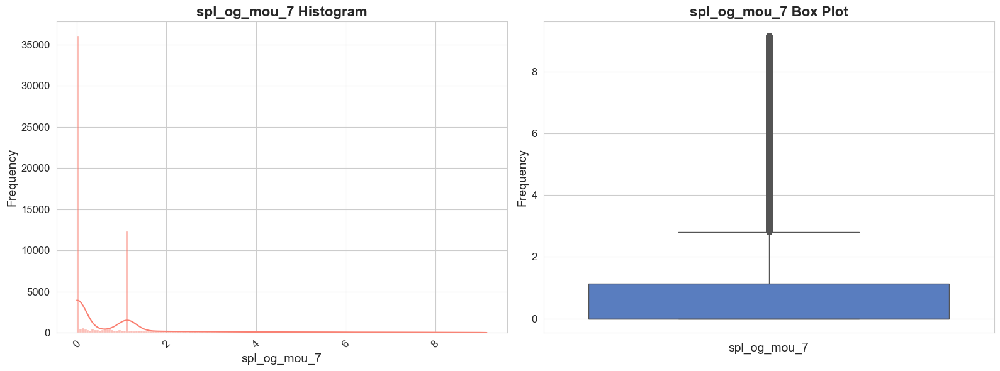

Initiating detailed analysis of spl_og_mou_8...

Statistical summary for spl_og_mou_8:
count    69999.000000
mean         1.284765
std          2.109639
min          0.000000
25%          0.000000
50%          0.130000
75%          1.284765
max         10.000000
Name: spl_og_mou_8, dtype: float64

The mode of spl_og_mou_8 is: 0.0



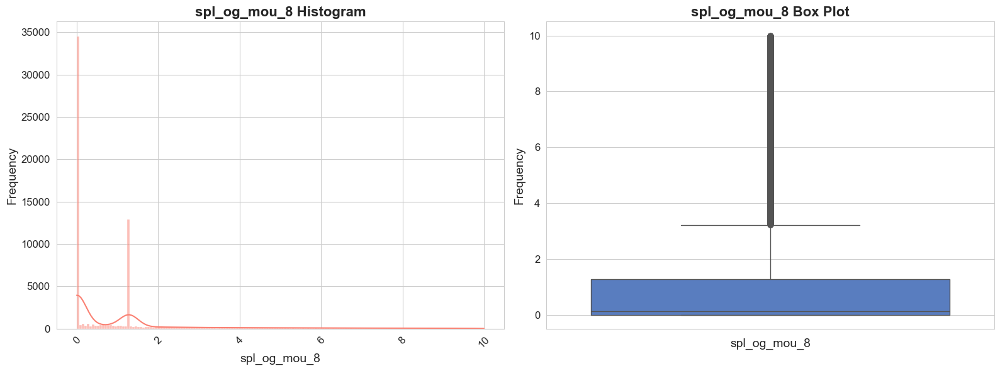

Initiating detailed analysis of og_others_6...

Statistical summary for og_others_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: og_others_6, dtype: float64

The mode of og_others_6 is: 0.0



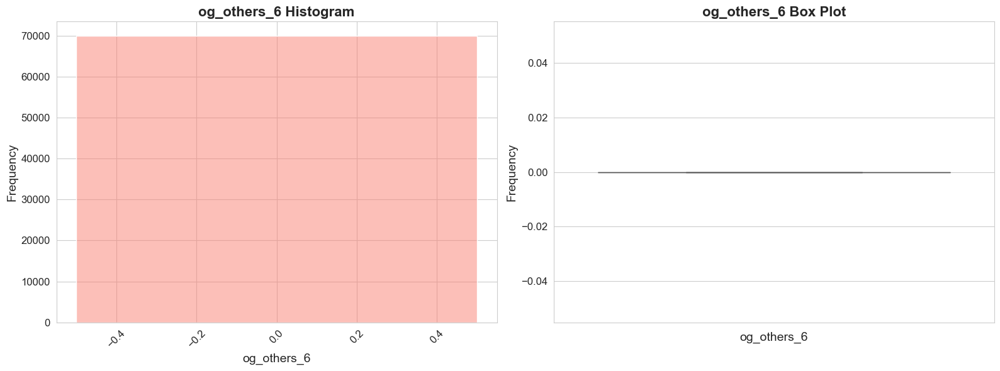

Initiating detailed analysis of og_others_7...

Statistical summary for og_others_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: og_others_7, dtype: float64

The mode of og_others_7 is: 0.0



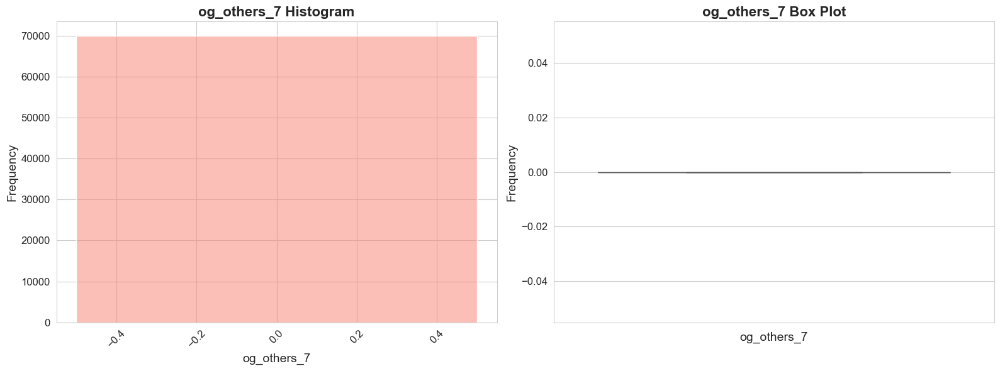

Initiating detailed analysis of og_others_8...

Statistical summary for og_others_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: og_others_8, dtype: float64

The mode of og_others_8 is: 0.0



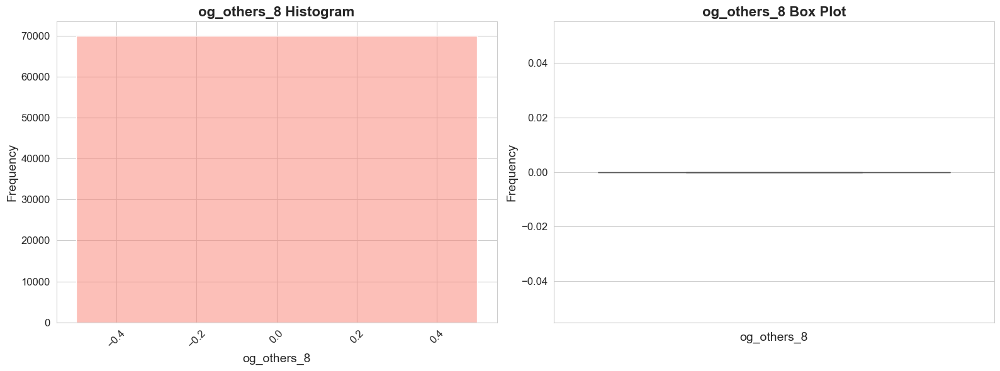

Initiating detailed analysis of total_og_mou_6...

Statistical summary for total_og_mou_6:
count    69999.000000
mean       195.736676
std        196.959547
min          0.000000
25%         44.780000
50%        145.280000
75%        268.035000
max        868.480000
Name: total_og_mou_6, dtype: float64

The mode of total_og_mou_6 is: 0.0



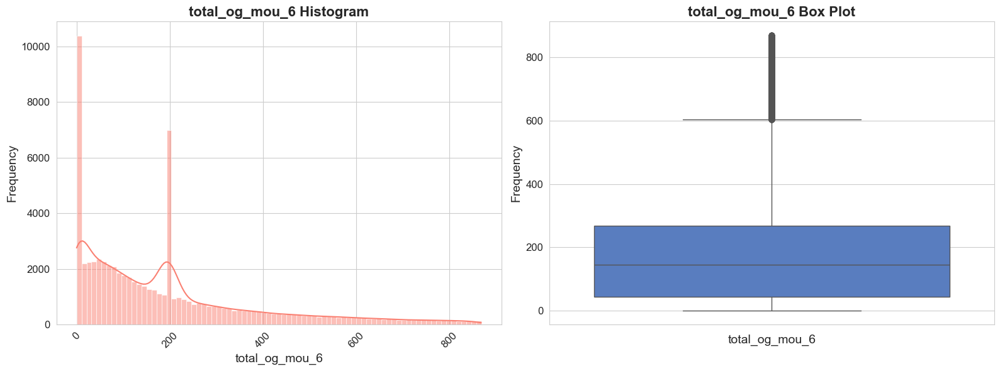

Initiating detailed analysis of total_og_mou_7...

Statistical summary for total_og_mou_7:
count    69999.000000
mean       196.099686
std        200.586983
min          0.000000
25%         42.910000
50%        141.230000
75%        267.450000
max        885.740000
Name: total_og_mou_7, dtype: float64

The mode of total_og_mou_7 is: 0.0



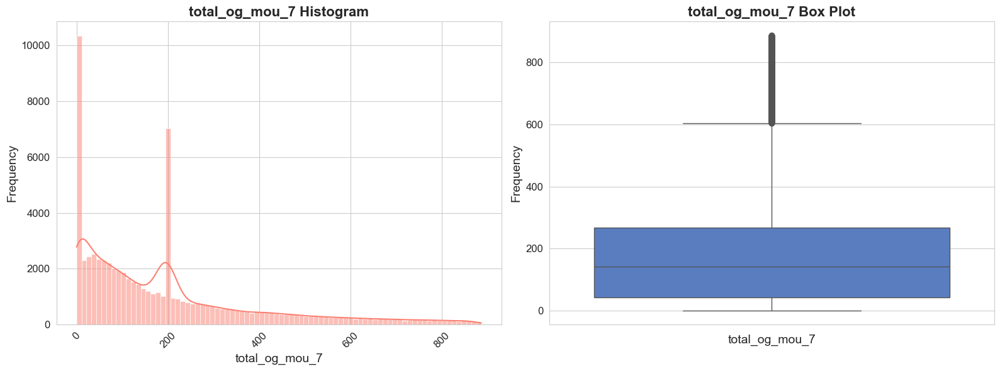

Initiating detailed analysis of total_og_mou_8...

Statistical summary for total_og_mou_8:
count    69999.000000
mean       191.396597
std        198.489067
min          0.000000
25%         38.710000
50%        138.360000
75%        260.685000
max        869.140000
Name: total_og_mou_8, dtype: float64

The mode of total_og_mou_8 is: 0.0



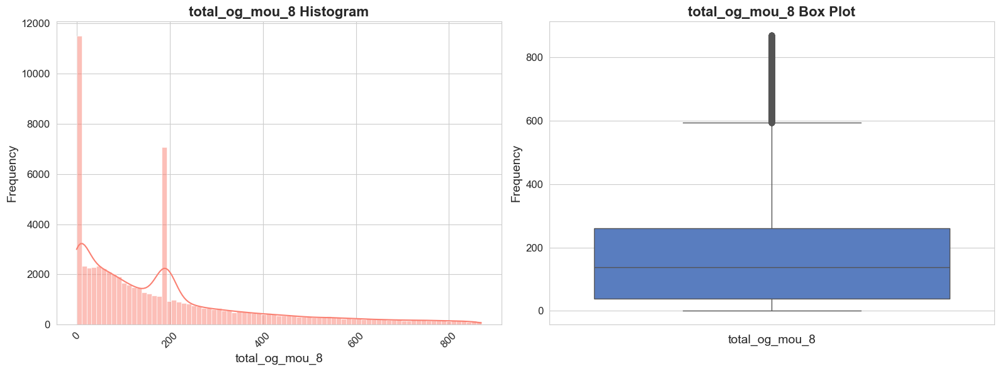

In [31]:
# Analysing for Minutes of Usage (MOU)
mou_group = data_groups['Minutes of Usage (MOU)']
for mou_group_keys in mou_group.keys():
    for mou in mou_group[mou_group_keys]:
        univariate_analysis = UnivariateAnalysis(df_train_clean, mou)
        univariate_analysis.analyze_without_bins()

Initiating detailed analysis of loc_ic_t2t_mou_6...

Statistical summary for loc_ic_t2t_mou_6:
count    69999.00000
mean        22.85708
std         24.69984
min          0.00000
25%          3.36000
50%         17.31000
75%         29.81000
max        112.89000
Name: loc_ic_t2t_mou_6, dtype: float64

The mode of loc_ic_t2t_mou_6 is: 22.857080489565565



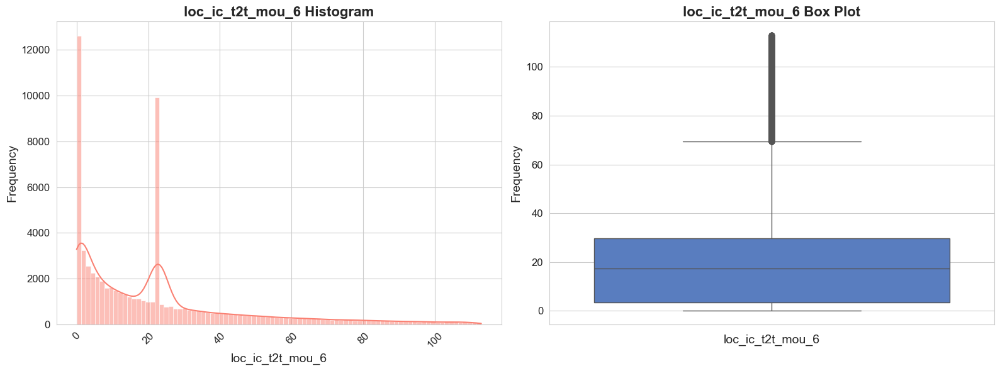

Initiating detailed analysis of loc_ic_t2t_mou_7...

Statistical summary for loc_ic_t2t_mou_7:
count    69999.000000
mean        22.390226
std         23.864563
min          0.000000
25%          3.580000
50%         17.360000
75%         29.110000
max        109.260000
Name: loc_ic_t2t_mou_7, dtype: float64

The mode of loc_ic_t2t_mou_7 is: 22.390226410134233



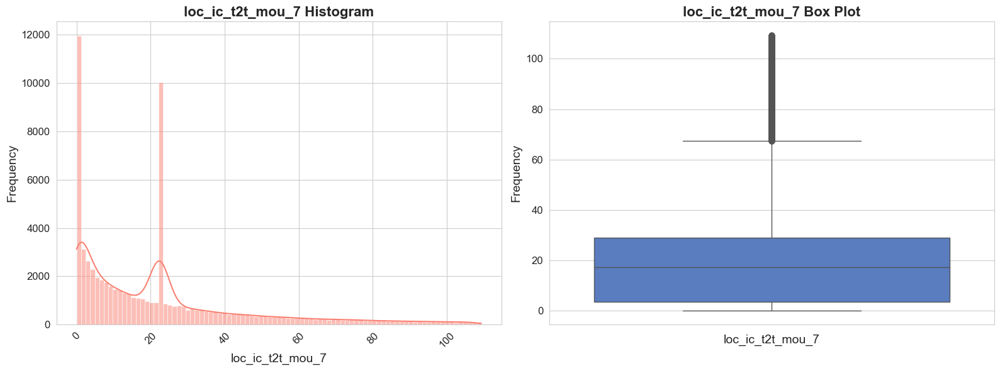

Initiating detailed analysis of loc_ic_t2t_mou_8...

Statistical summary for loc_ic_t2t_mou_8:
count    69999.000000
mean        22.798703
std         24.168636
min          0.000000
25%          3.740000
50%         18.110000
75%         29.330000
max        110.780000
Name: loc_ic_t2t_mou_8, dtype: float64

The mode of loc_ic_t2t_mou_8 is: 22.798702573229757



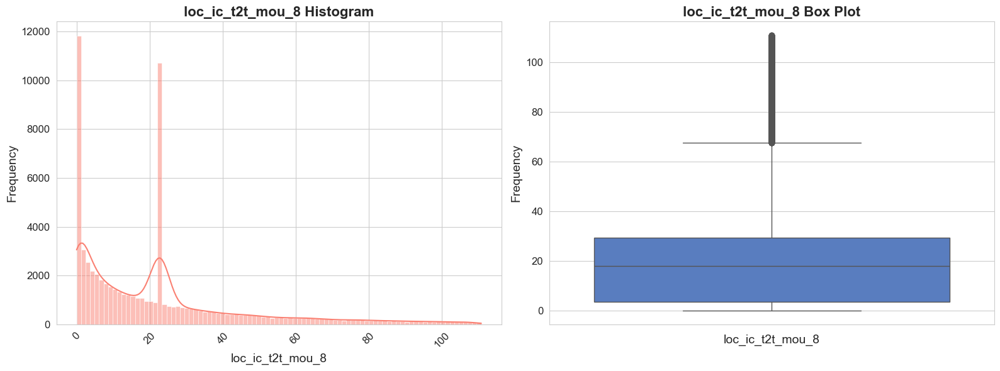

Initiating detailed analysis of loc_ic_t2m_mou_6...

Statistical summary for loc_ic_t2m_mou_6:
count    69999.000000
mean        72.469282
std         67.701929
min          0.000000
25%         18.610000
50%         60.840000
75%         99.060000
max        303.960000
Name: loc_ic_t2m_mou_6, dtype: float64

The mode of loc_ic_t2m_mou_6 is: 72.46928243416828



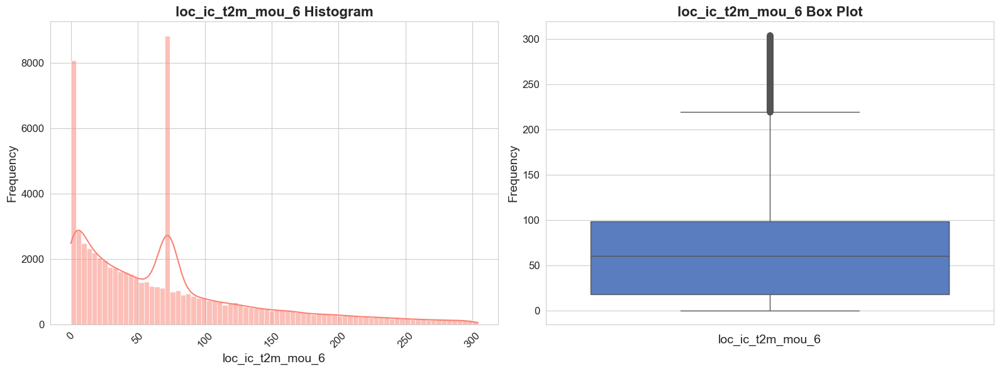

Initiating detailed analysis of loc_ic_t2m_mou_7...

Statistical summary for loc_ic_t2m_mou_7:
count    69999.000000
mean        72.617667
std         66.950253
min          0.000000
25%         19.790000
50%         60.860000
75%         99.035000
max        299.610000
Name: loc_ic_t2m_mou_7, dtype: float64

The mode of loc_ic_t2m_mou_7 is: 72.61766714743588



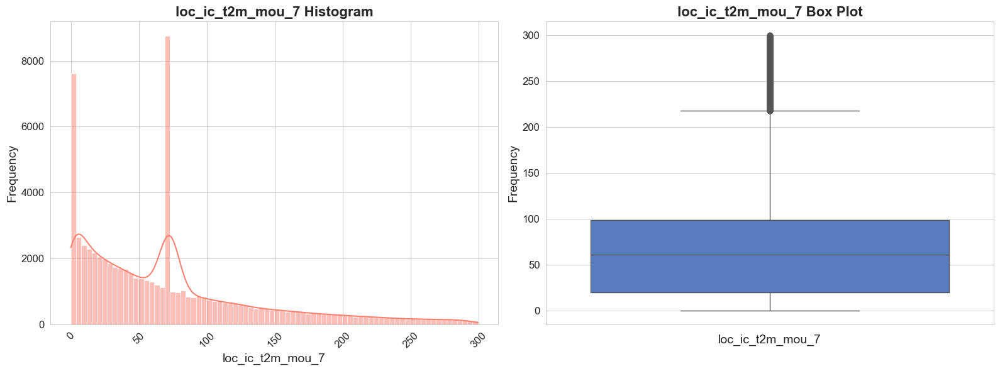

Initiating detailed analysis of loc_ic_t2m_mou_8...

Statistical summary for loc_ic_t2m_mou_8:
count    69999.000000
mean        74.385767
std         68.071378
min          0.000000
25%         20.680000
50%         63.910000
75%        100.460000
max        307.510000
Name: loc_ic_t2m_mou_8, dtype: float64

The mode of loc_ic_t2m_mou_8 is: 74.38576664392242



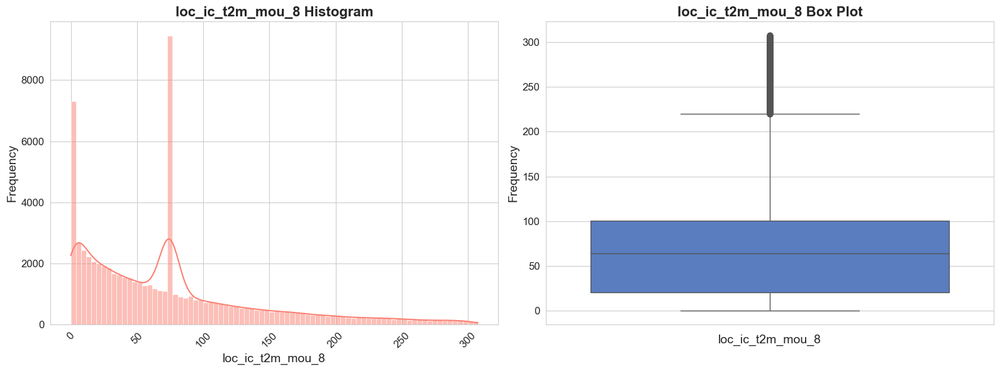

Initiating detailed analysis of loc_ic_t2f_mou_6...

Statistical summary for loc_ic_t2f_mou_6:
count    69999.000000
mean         2.746195
std          4.157009
min          0.000000
25%          0.000000
50%          1.130000
75%          2.746195
max         20.350000
Name: loc_ic_t2f_mou_6, dtype: float64

The mode of loc_ic_t2f_mou_6 is: 0.0



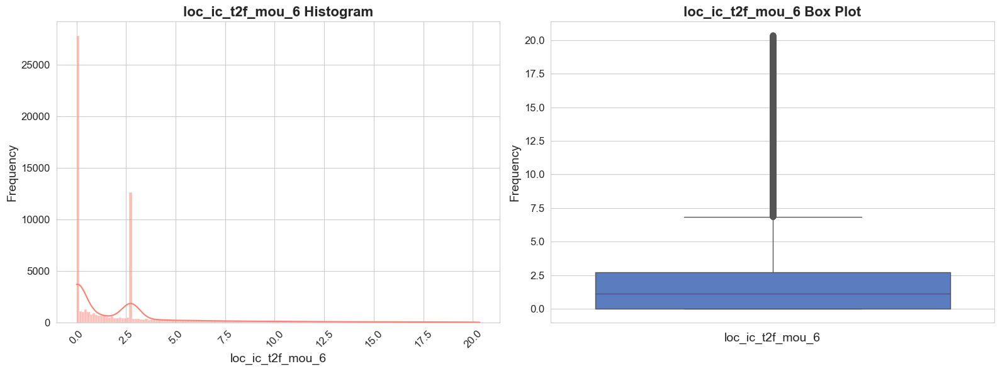

Initiating detailed analysis of loc_ic_t2f_mou_7...

Statistical summary for loc_ic_t2f_mou_7:
count    69999.000000
mean         2.799099
std          4.208332
min          0.000000
25%          0.000000
50%          1.160000
75%          2.799099
max         20.560000
Name: loc_ic_t2f_mou_7, dtype: float64

The mode of loc_ic_t2f_mou_7 is: 0.0



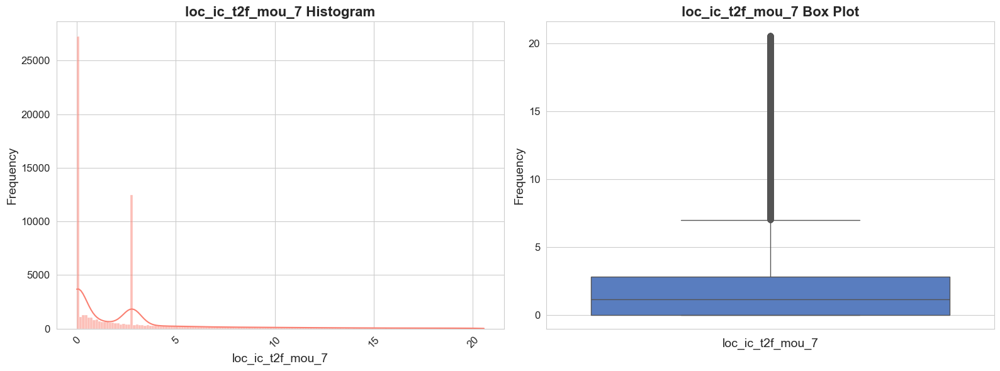

Initiating detailed analysis of loc_ic_t2f_mou_8...

Statistical summary for loc_ic_t2f_mou_8:
count    69999.000000
mean         2.786585
std          4.125688
min          0.000000
25%          0.000000
50%          1.250000
75%          2.786585
max         20.210000
Name: loc_ic_t2f_mou_8, dtype: float64

The mode of loc_ic_t2f_mou_8 is: 0.0



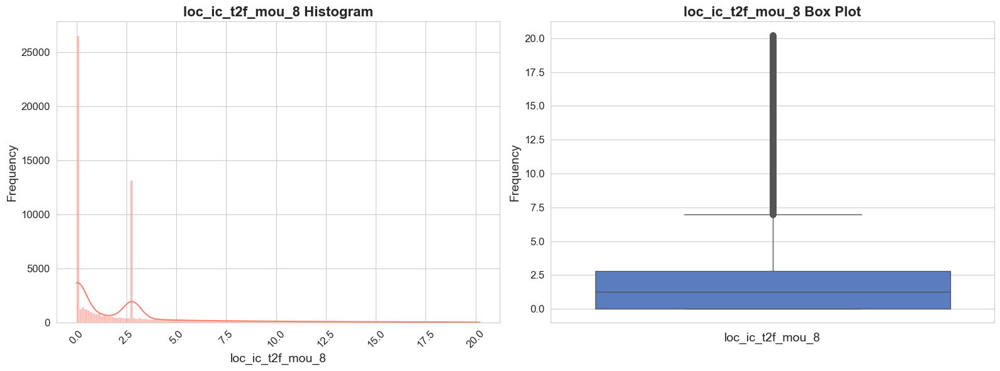

Initiating detailed analysis of loc_ic_mou_6...

Statistical summary for loc_ic_mou_6:
count    69999.000000
mean       116.070176
std        105.364519
min          0.000000
25%         32.685000
50%         98.940000
75%        158.185000
max        474.830000
Name: loc_ic_mou_6, dtype: float64

The mode of loc_ic_mou_6 is: 116.07017586289744



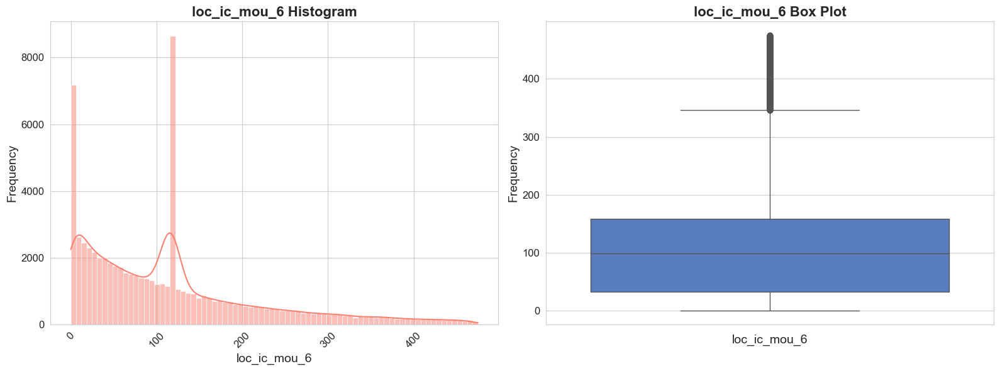

Initiating detailed analysis of loc_ic_mou_7...

Statistical summary for loc_ic_mou_7:
count    69999.000000
mean       115.269302
std        102.981950
min          0.000000
25%         34.660000
50%         98.630000
75%        156.360000
max        464.760000
Name: loc_ic_mou_7, dtype: float64

The mode of loc_ic_mou_7 is: 115.26930230695291



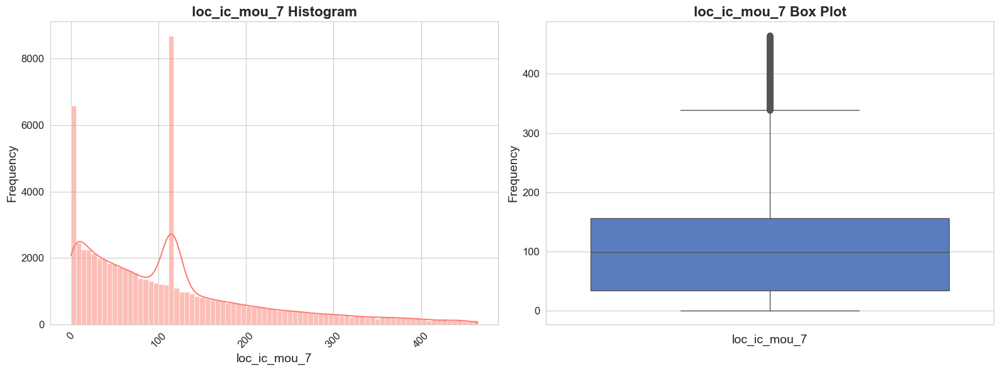

Initiating detailed analysis of loc_ic_mou_8...

Statistical summary for loc_ic_mou_8:
count    69999.000000
mean       116.751752
std        103.341864
min          0.000000
25%         35.470000
50%        102.590000
75%        157.435000
max        470.890000
Name: loc_ic_mou_8, dtype: float64

The mode of loc_ic_mou_8 is: 116.75175183548828



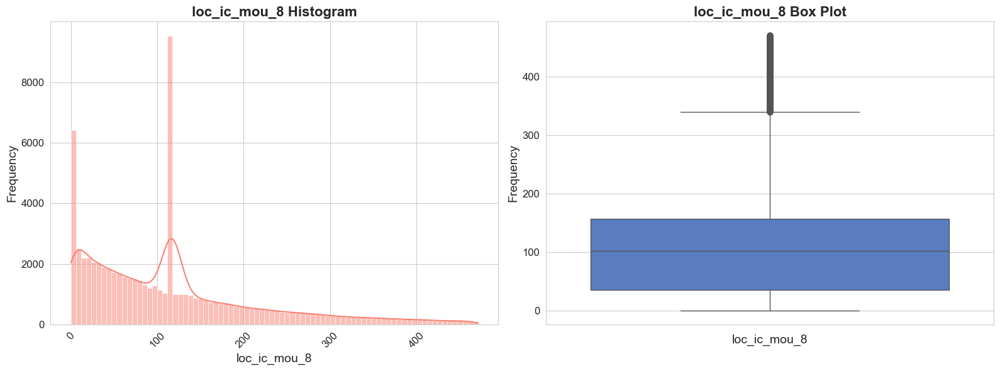

Initiating detailed analysis of std_ic_t2t_mou_6...

Statistical summary for std_ic_t2t_mou_6:
count    69999.000000
mean         1.003911
std          1.925620
min          0.000000
25%          0.000000
50%          0.000000
75%          1.003911
max         10.140000
Name: std_ic_t2t_mou_6, dtype: float64

The mode of std_ic_t2t_mou_6 is: 0.0



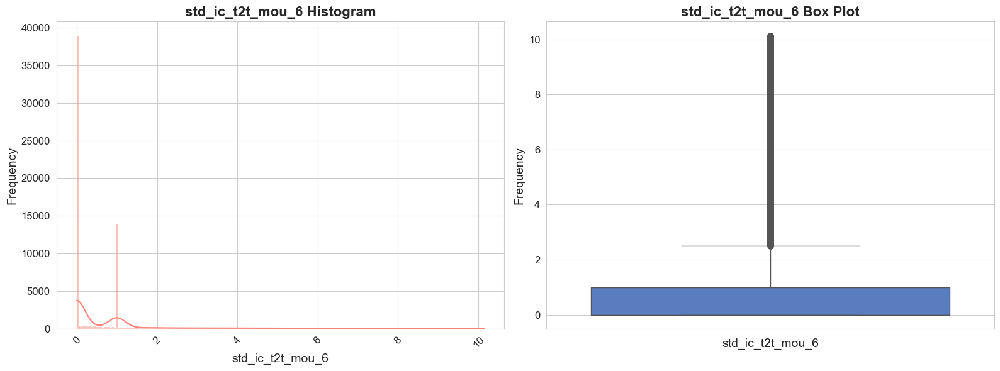

Initiating detailed analysis of std_ic_t2t_mou_7...

Statistical summary for std_ic_t2t_mou_7:
count    69999.000000
mean         1.049050
std          1.995417
min          0.000000
25%          0.000000
50%          0.000000
75%          1.049050
max         10.450000
Name: std_ic_t2t_mou_7, dtype: float64

The mode of std_ic_t2t_mou_7 is: 0.0



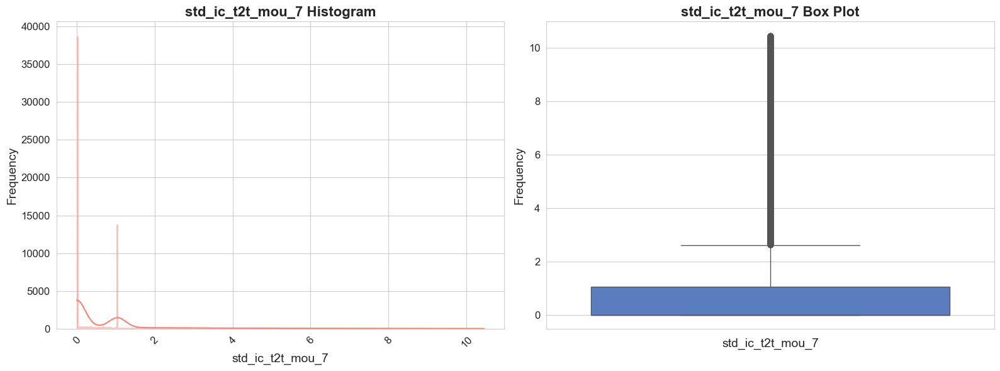

Initiating detailed analysis of std_ic_t2t_mou_8...

Statistical summary for std_ic_t2t_mou_8:
count    69999.000000
mean         1.005291
std          1.922292
min          0.000000
25%          0.000000
50%          0.000000
75%          1.005291
max         10.130000
Name: std_ic_t2t_mou_8, dtype: float64

The mode of std_ic_t2t_mou_8 is: 0.0



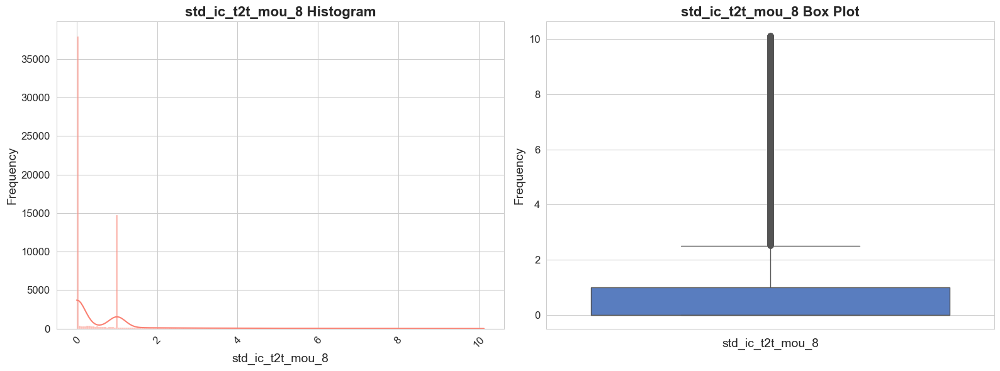

Initiating detailed analysis of std_ic_t2m_mou_6...

Statistical summary for std_ic_t2m_mou_6:
count    69999.000000
mean         5.557749
std          7.930745
min          0.000000
25%          0.000000
50%          2.540000
75%          5.790000
max         37.390000
Name: std_ic_t2m_mou_6, dtype: float64

The mode of std_ic_t2m_mou_6 is: 0.0



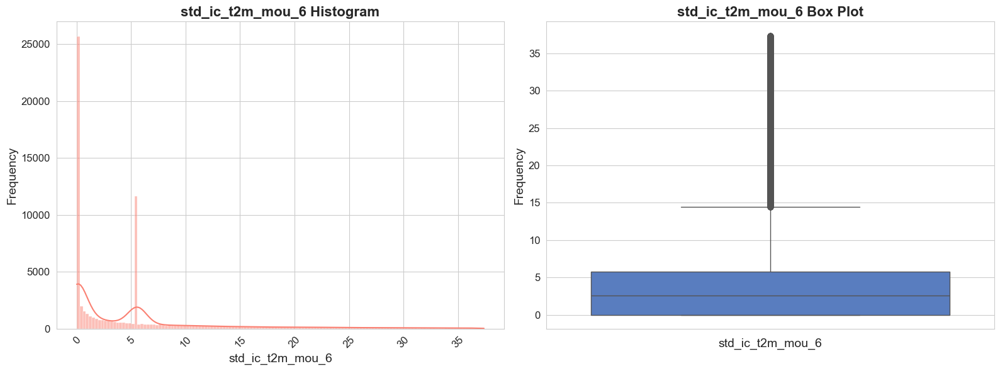

Initiating detailed analysis of std_ic_t2m_mou_7...

Statistical summary for std_ic_t2m_mou_7:
count    69999.000000
mean         5.854115
std          8.397458
min          0.000000
25%          0.000000
50%          2.580000
75%          6.090000
max         39.560000
Name: std_ic_t2m_mou_7, dtype: float64

The mode of std_ic_t2m_mou_7 is: 0.0



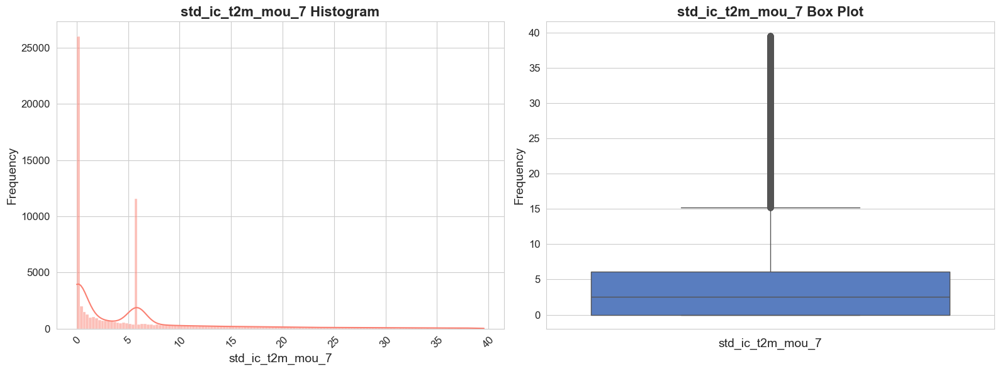

Initiating detailed analysis of std_ic_t2m_mou_8...

Statistical summary for std_ic_t2m_mou_8:
count    69999.000000
mean         5.657240
std          8.088094
min          0.000000
25%          0.000000
50%          2.700000
75%          5.657240
max         38.260000
Name: std_ic_t2m_mou_8, dtype: float64

The mode of std_ic_t2m_mou_8 is: 0.0



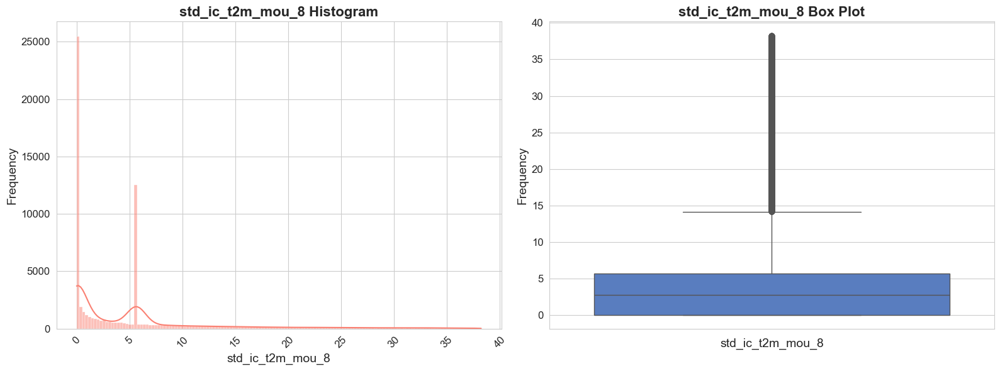

Initiating detailed analysis of std_ic_t2f_mou_6...

Statistical summary for std_ic_t2f_mou_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_ic_t2f_mou_6, dtype: float64

The mode of std_ic_t2f_mou_6 is: 0.0



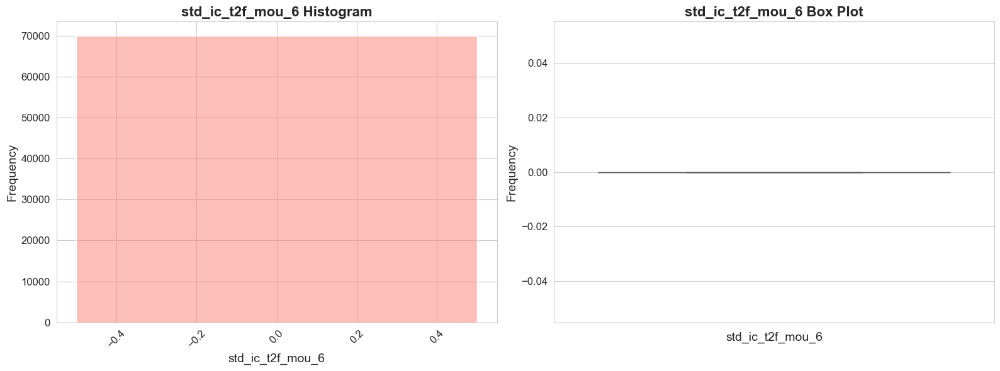

Initiating detailed analysis of std_ic_t2f_mou_7...

Statistical summary for std_ic_t2f_mou_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_ic_t2f_mou_7, dtype: float64

The mode of std_ic_t2f_mou_7 is: 0.0



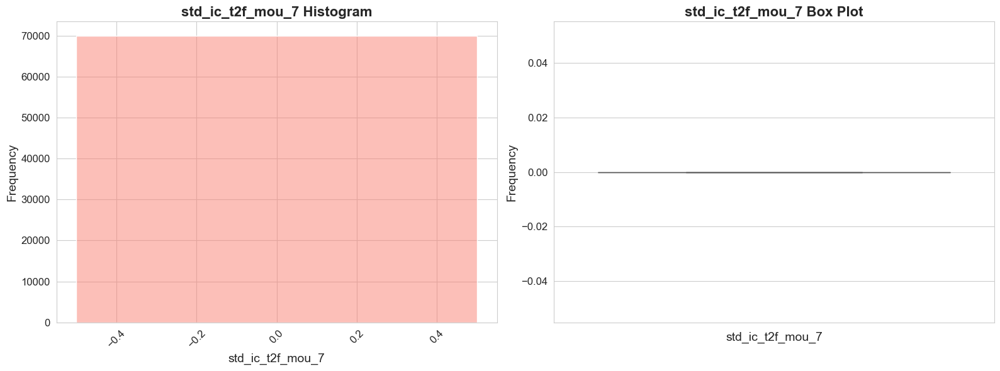

Initiating detailed analysis of std_ic_t2f_mou_8...

Statistical summary for std_ic_t2f_mou_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_ic_t2f_mou_8, dtype: float64

The mode of std_ic_t2f_mou_8 is: 0.0



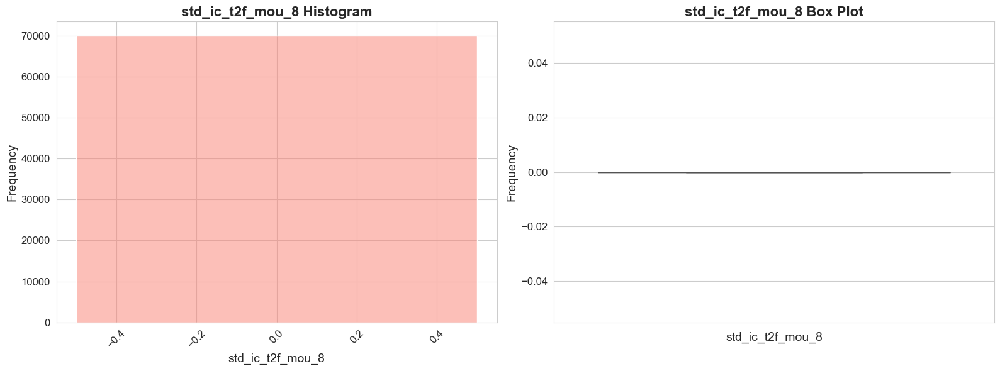

Initiating detailed analysis of std_ic_mou_6...

Statistical summary for std_ic_mou_6:
count    69999.000000
mean        11.172986
std         14.364176
min          0.000000
25%          0.110000
50%          6.850000
75%         13.220000
max         66.940000
Name: std_ic_mou_6, dtype: float64

The mode of std_ic_mou_6 is: 0.0



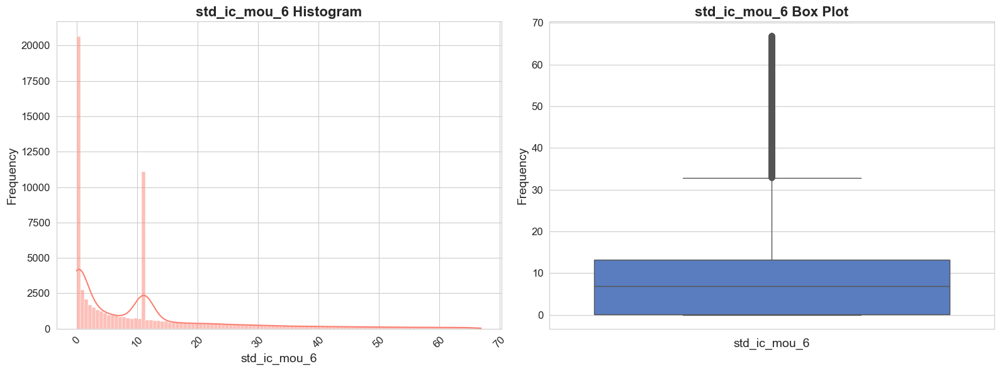

Initiating detailed analysis of std_ic_mou_7...

Statistical summary for std_ic_mou_7:
count    69999.000000
mean        11.761369
std         15.223483
min          0.000000
25%          0.080000
50%          6.940000
75%         14.010000
max         70.390000
Name: std_ic_mou_7, dtype: float64

The mode of std_ic_mou_7 is: 0.0



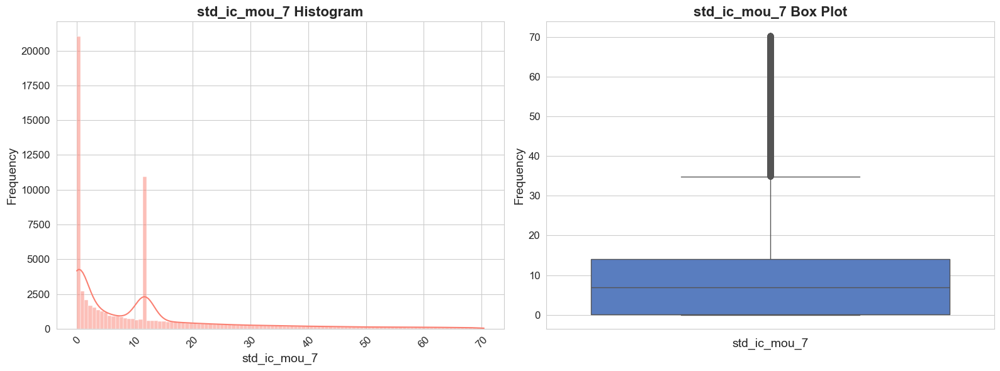

Initiating detailed analysis of std_ic_mou_8...

Statistical summary for std_ic_mou_8:
count    69999.000000
mean        11.489223
std         14.813182
min          0.000000
25%          0.190000
50%          7.080000
75%         13.080000
max         68.990000
Name: std_ic_mou_8, dtype: float64

The mode of std_ic_mou_8 is: 0.0



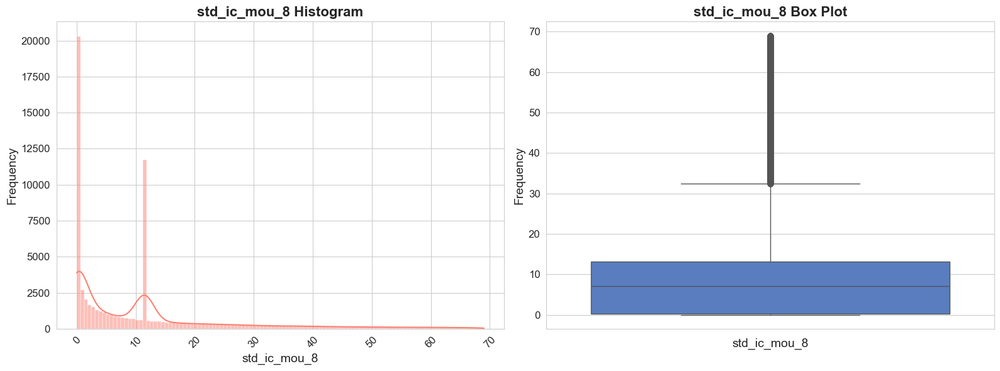

Initiating detailed analysis of isd_ic_mou_6...

Statistical summary for isd_ic_mou_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: isd_ic_mou_6, dtype: float64

The mode of isd_ic_mou_6 is: 0.0



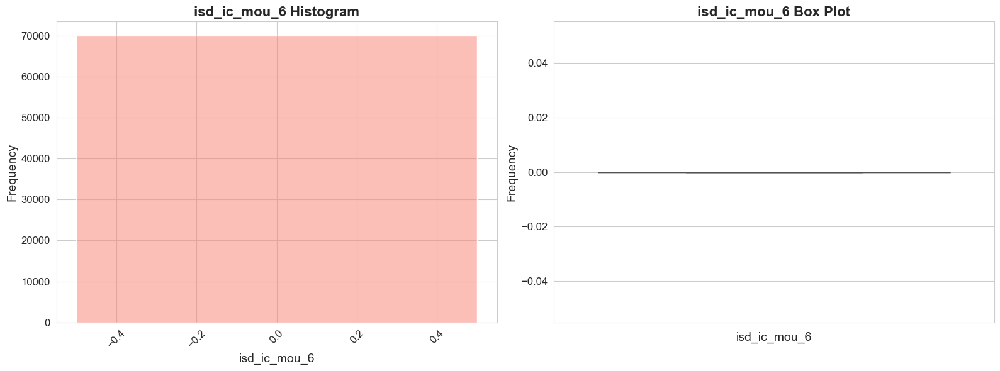

Initiating detailed analysis of isd_ic_mou_7...

Statistical summary for isd_ic_mou_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: isd_ic_mou_7, dtype: float64

The mode of isd_ic_mou_7 is: 0.0



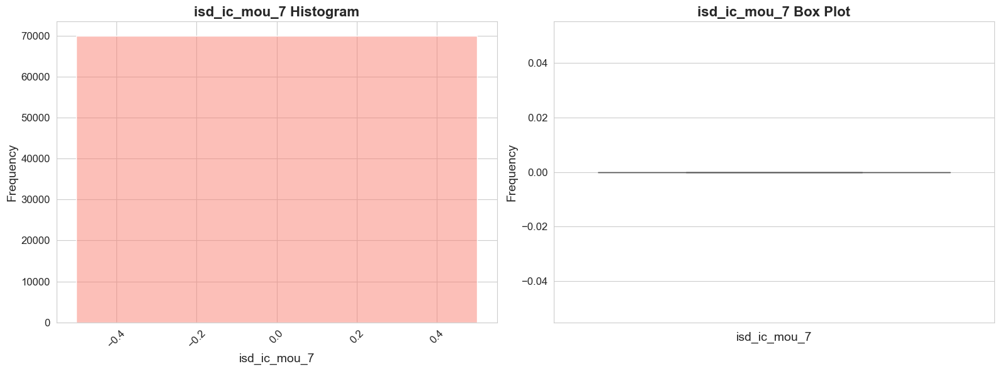

Initiating detailed analysis of isd_ic_mou_8...

Statistical summary for isd_ic_mou_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: isd_ic_mou_8, dtype: float64

The mode of isd_ic_mou_8 is: 0.0



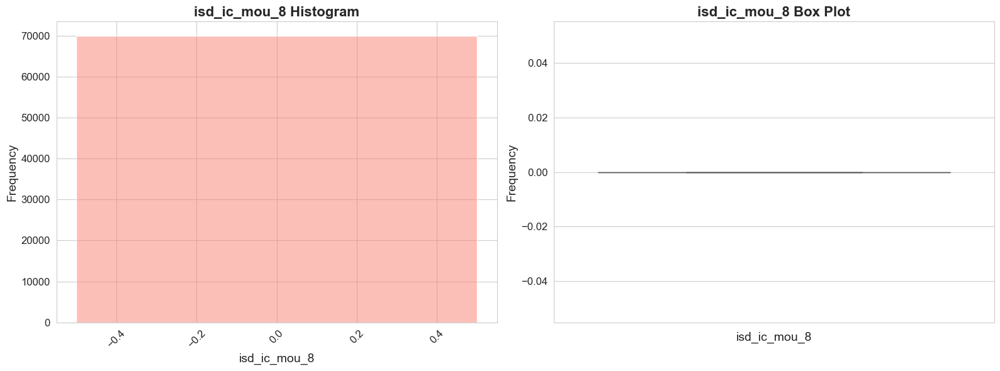

Initiating detailed analysis of spl_ic_mou_6...

Statistical summary for spl_ic_mou_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: spl_ic_mou_6, dtype: float64

The mode of spl_ic_mou_6 is: 0.0



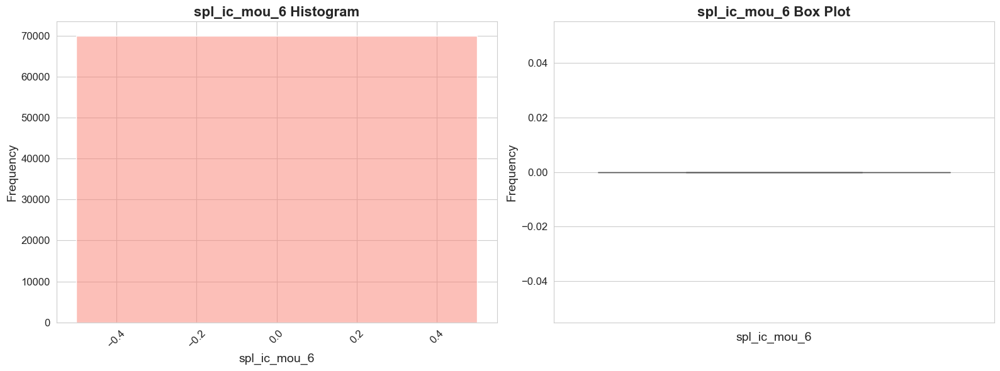

Initiating detailed analysis of spl_ic_mou_7...

Statistical summary for spl_ic_mou_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: spl_ic_mou_7, dtype: float64

The mode of spl_ic_mou_7 is: 0.0



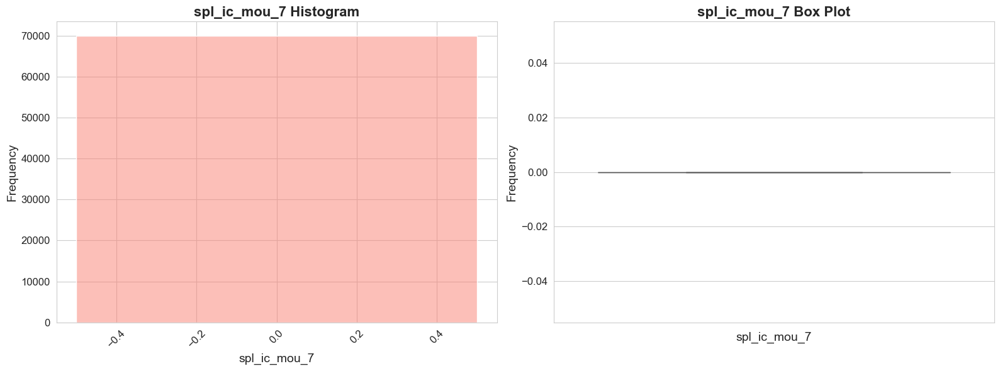

Initiating detailed analysis of spl_ic_mou_8...

Statistical summary for spl_ic_mou_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: spl_ic_mou_8, dtype: float64

The mode of spl_ic_mou_8 is: 0.0



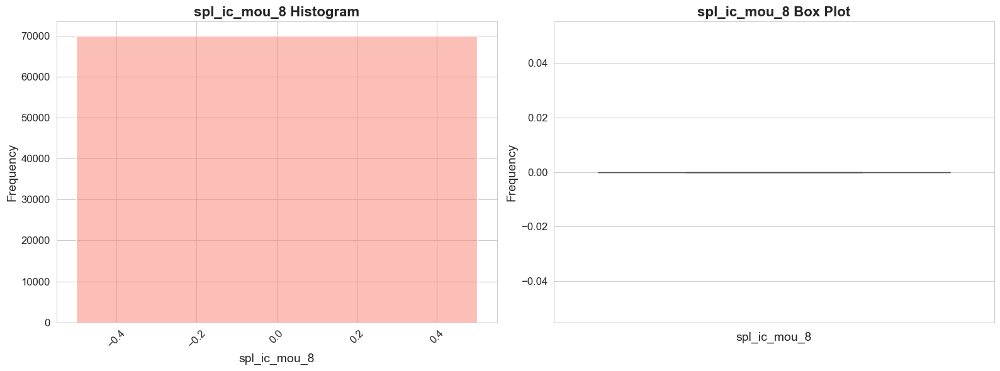

Initiating detailed analysis of ic_others_6...

Statistical summary for ic_others_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: ic_others_6, dtype: float64

The mode of ic_others_6 is: 0.0



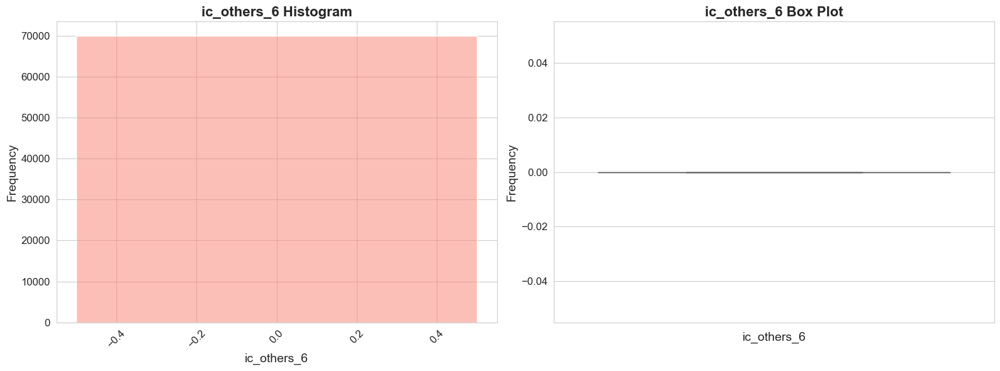

Initiating detailed analysis of ic_others_7...

Statistical summary for ic_others_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: ic_others_7, dtype: float64

The mode of ic_others_7 is: 0.0



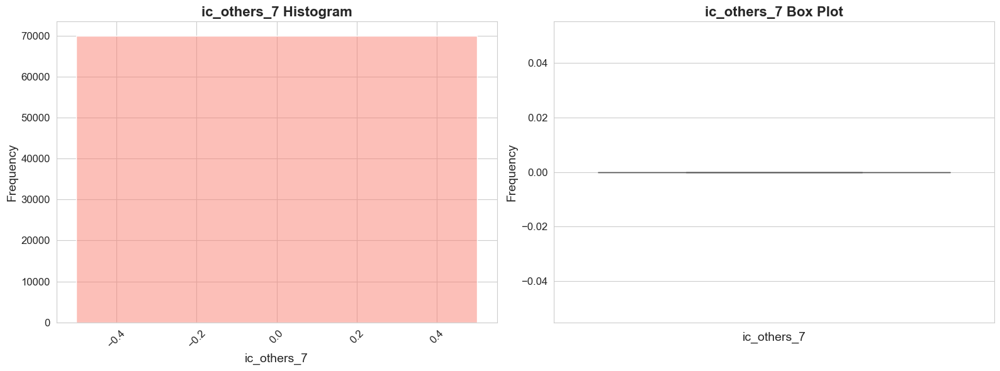

Initiating detailed analysis of ic_others_8...

Statistical summary for ic_others_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: ic_others_8, dtype: float64

The mode of ic_others_8 is: 0.0



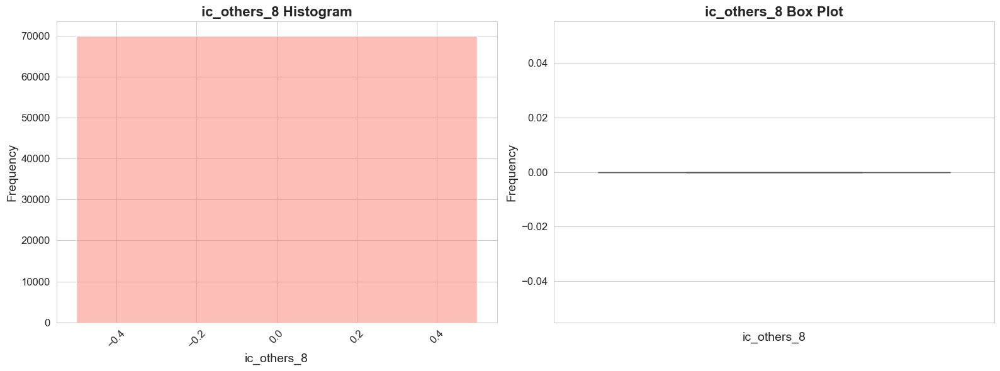

Initiating detailed analysis of total_ic_mou_6...

Statistical summary for total_ic_mou_6:
count    69999.000000
mean       141.225283
std        129.359134
min          0.000000
25%         38.640000
50%        114.780000
75%        200.060000
max        569.560000
Name: total_ic_mou_6, dtype: float64

The mode of total_ic_mou_6 is: 0.0



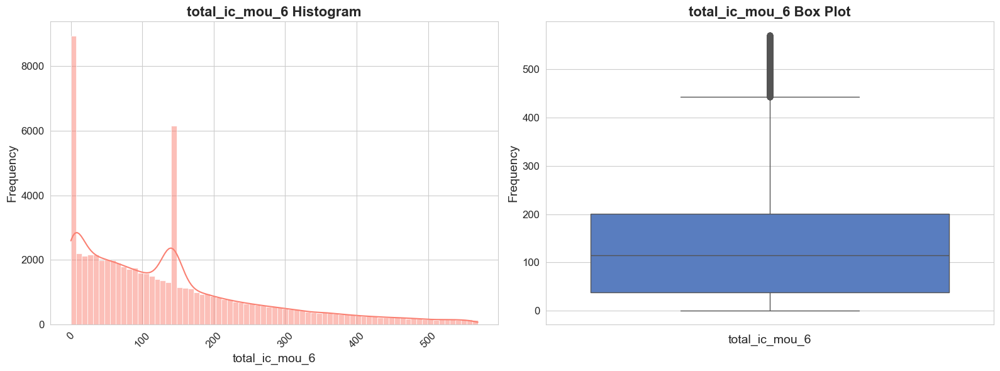

Initiating detailed analysis of total_ic_mou_7...

Statistical summary for total_ic_mou_7:
count    69999.000000
mean       141.344231
std        127.240383
min          0.000000
25%         41.340000
50%        116.330000
75%        199.030000
max        561.630000
Name: total_ic_mou_7, dtype: float64

The mode of total_ic_mou_7 is: 0.0



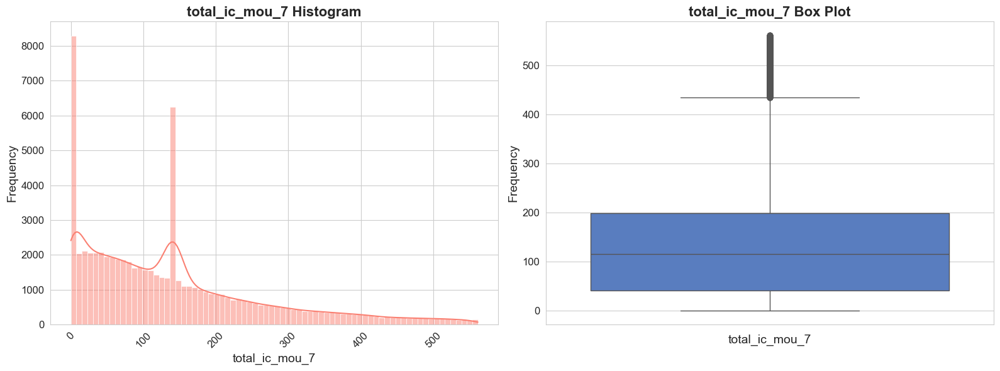

Initiating detailed analysis of total_ic_mou_8...

Statistical summary for total_ic_mou_8:
count    69999.000000
mean       140.211289
std        128.252257
min          0.000000
25%         38.290000
50%        114.610000
75%        199.210000
max        566.840000
Name: total_ic_mou_8, dtype: float64

The mode of total_ic_mou_8 is: 0.0



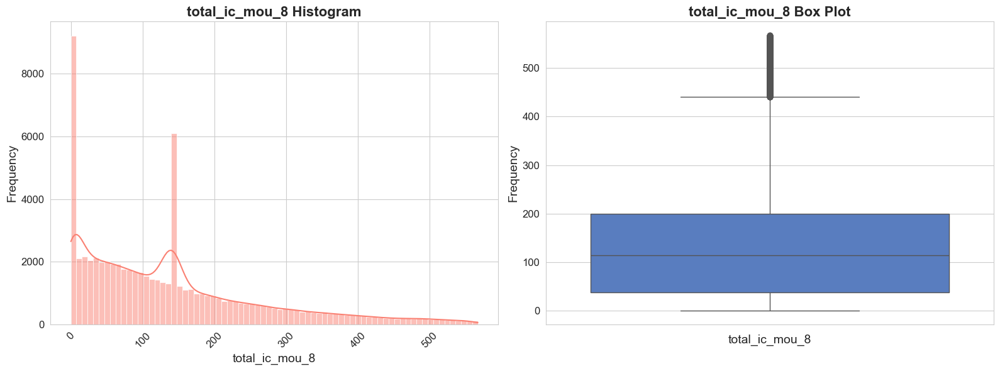

In [32]:
# Analysing for Incoming Calls MOU
ig_mou_group = data_groups['Incoming Calls MOU']
for ig_mou_keys in ig_mou_group.keys():
    for ig_mou in ig_mou_group[ig_mou_keys]:
        univariate_analysis = UnivariateAnalysis(df_train_clean, ig_mou)
        univariate_analysis.analyze_without_bins()

Initiating detailed analysis of total_rech_num_6...

Statistical summary for total_rech_num_6:
count    69999.000000
mean         6.202106
std          3.889584
min          0.000000
25%          3.000000
50%          6.000000
75%          8.000000
max         18.000000
Name: total_rech_num_6, dtype: float64

The mode of total_rech_num_6 is: 4.0



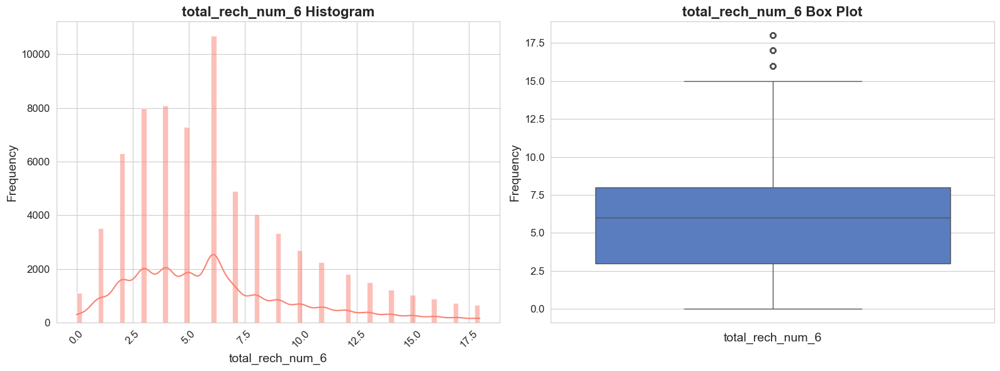

Initiating detailed analysis of total_rech_num_7...

Statistical summary for total_rech_num_7:
count    69999.000000
mean         6.516402
std          4.191975
min          0.000000
25%          3.000000
50%          6.000000
75%          8.000000
max         20.000000
Name: total_rech_num_7, dtype: float64

The mode of total_rech_num_7 is: 4.0



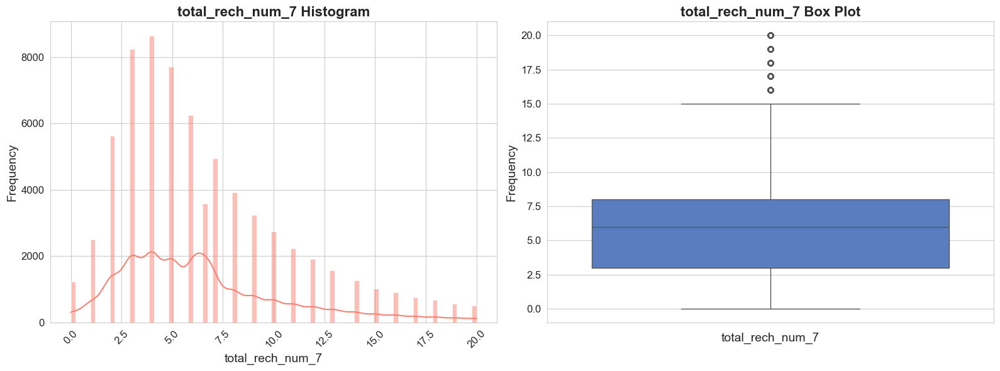

Initiating detailed analysis of total_rech_num_8...

Statistical summary for total_rech_num_8:
count    69999.000000
mean         5.812832
std          4.022367
min          0.000000
25%          3.000000
50%          5.000000
75%          8.000000
max         18.000000
Name: total_rech_num_8, dtype: float64

The mode of total_rech_num_8 is: 3.0



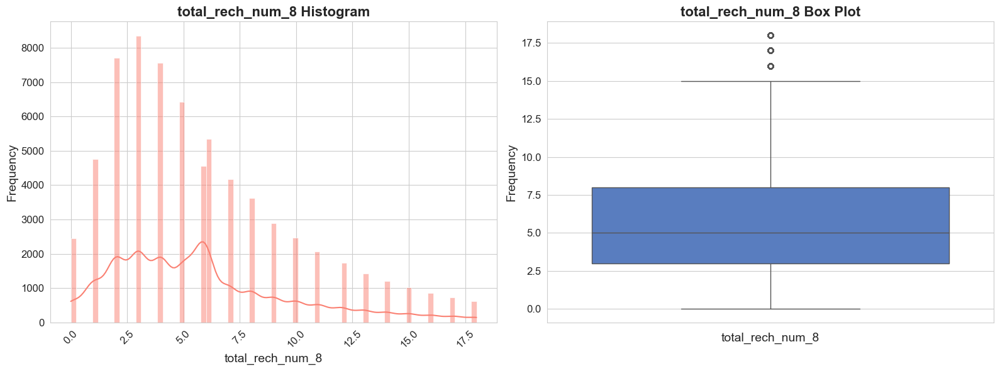

Initiating detailed analysis of total_rech_amt_6...

Statistical summary for total_rech_amt_6:
count    69999.000000
mean       261.654798
std        212.702591
min          0.000000
25%        110.000000
50%        229.000000
75%        369.000000
max        930.000000
Name: total_rech_amt_6, dtype: float64

The mode of total_rech_amt_6 is: 0.0



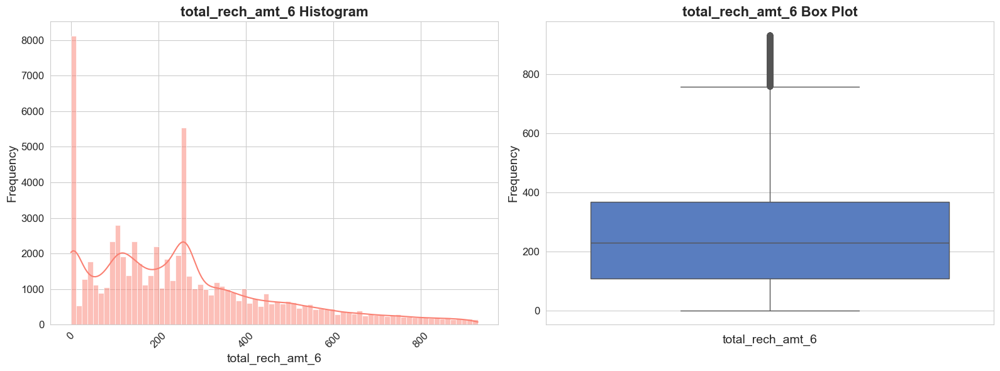

Initiating detailed analysis of total_rech_amt_7...

Statistical summary for total_rech_amt_7:
count    69999.000000
mean       255.169937
std        212.210952
min          0.000000
25%        100.000000
50%        220.000000
75%        363.000000
max        925.000000
Name: total_rech_amt_7, dtype: float64

The mode of total_rech_amt_7 is: 0.0



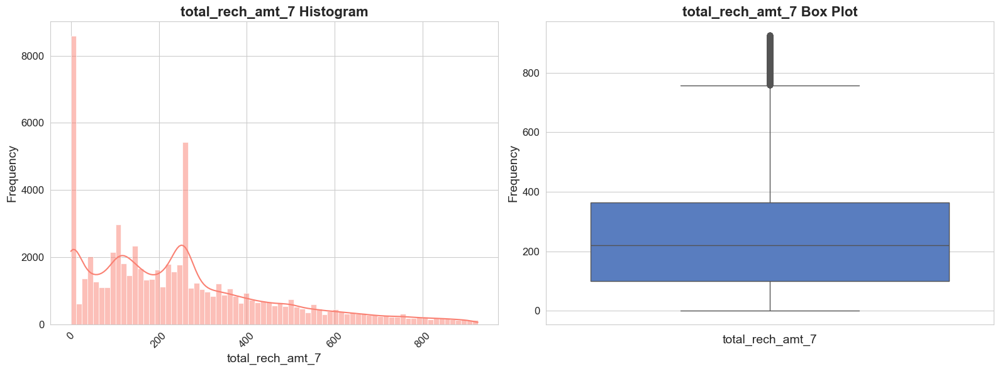

Initiating detailed analysis of total_rech_amt_8...

Statistical summary for total_rech_amt_8:
count    69999.000000
mean       259.413981
std        219.504201
min          0.000000
25%         90.000000
50%        225.000000
75%        377.000000
max        955.000000
Name: total_rech_amt_8, dtype: float64

The mode of total_rech_amt_8 is: 0.0



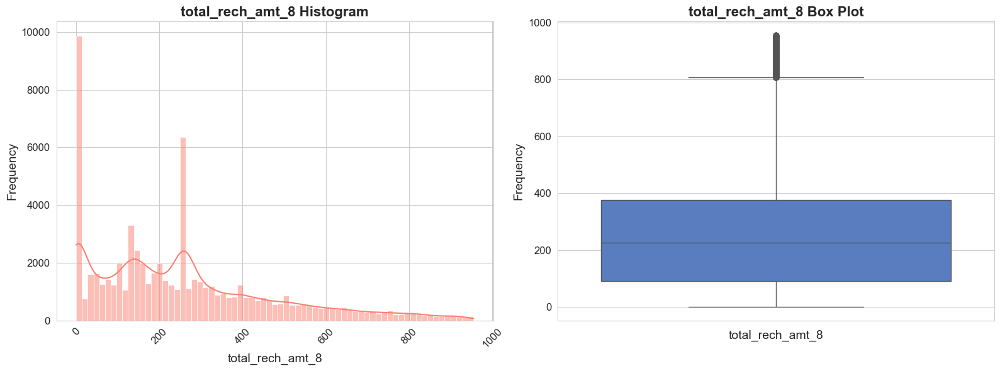

Initiating detailed analysis of max_rech_amt_6...

Statistical summary for max_rech_amt_6:
count    69999.000000
mean        87.076610
std         63.957992
min          0.000000
25%         30.000000
50%         90.000000
75%        120.000000
max        252.000000
Name: max_rech_amt_6, dtype: float64

The mode of max_rech_amt_6 is: 110.0



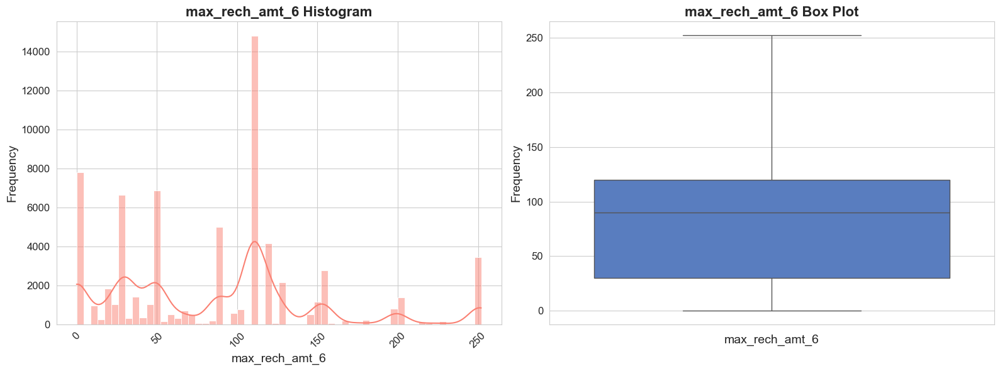

Initiating detailed analysis of max_rech_amt_7...

Statistical summary for max_rech_amt_7:
count    69999.000000
mean        87.004525
std         66.021947
min          0.000000
25%         30.000000
50%         87.004525
75%        120.000000
max        274.000000
Name: max_rech_amt_7, dtype: float64

The mode of max_rech_amt_7 is: 110.0



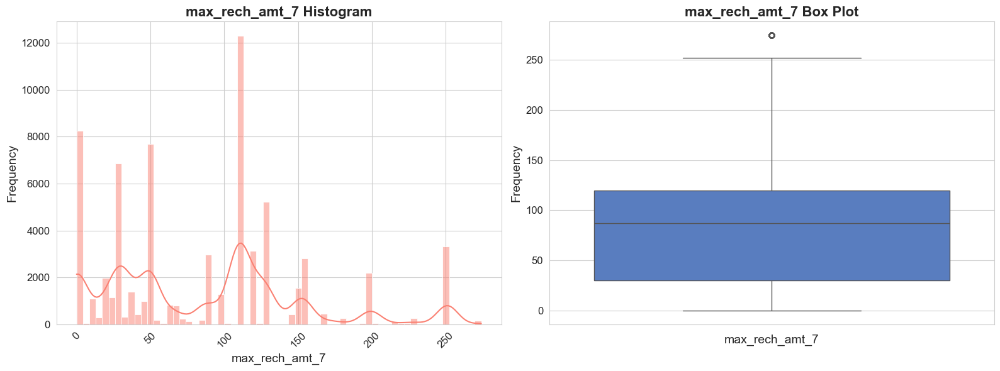

Initiating detailed analysis of max_rech_amt_8...

Statistical summary for max_rech_amt_8:
count    69999.000000
mean        91.161575
std         71.537328
min          0.000000
25%         30.000000
50%         91.161575
75%        130.000000
max        300.000000
Name: max_rech_amt_8, dtype: float64

The mode of max_rech_amt_8 is: 130.0



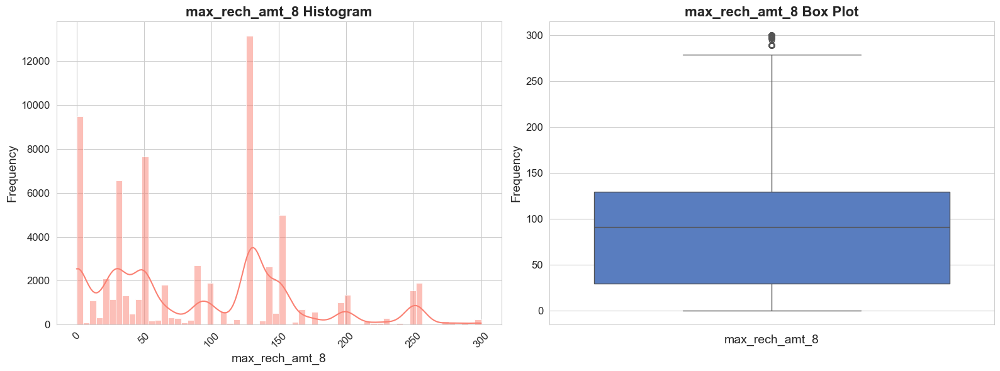

Initiating detailed analysis of last_day_rch_amt_6...

Statistical summary for last_day_rch_amt_6:
count    69999.000000
mean        54.646645
std         60.087903
min          0.000000
25%          0.000000
50%         30.000000
75%        110.000000
max        274.000000
Name: last_day_rch_amt_6, dtype: float64

The mode of last_day_rch_amt_6 is: 0.0



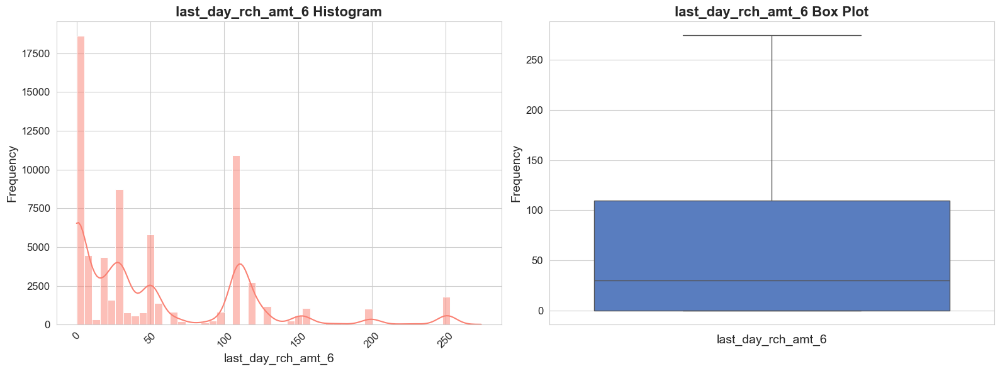

Initiating detailed analysis of last_day_rch_amt_7...

Statistical summary for last_day_rch_amt_7:
count    69999.000000
mean        50.776442
std         60.552901
min          0.000000
25%          0.000000
50%         30.000000
75%        110.000000
max        274.000000
Name: last_day_rch_amt_7, dtype: float64

The mode of last_day_rch_amt_7 is: 0.0



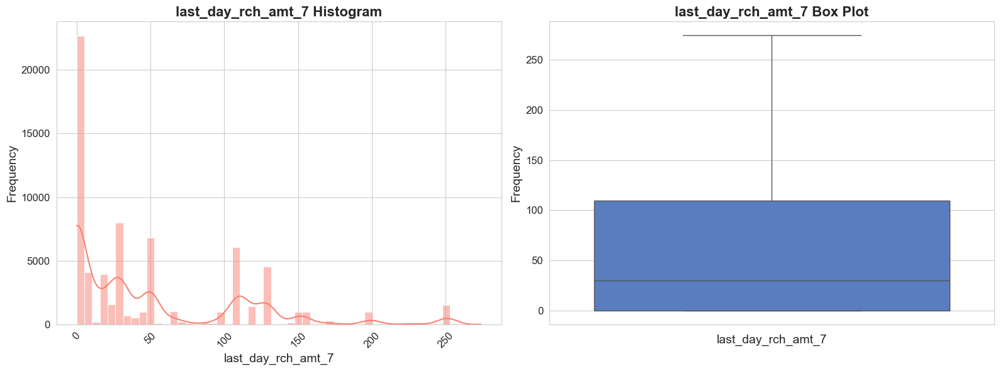

Initiating detailed analysis of last_day_rch_amt_8...

Statistical summary for last_day_rch_amt_8:
count    69999.000000
mean        53.892703
std         66.149312
min          0.000000
25%          0.000000
50%         30.000000
75%        100.000000
max        325.000000
Name: last_day_rch_amt_8, dtype: float64

The mode of last_day_rch_amt_8 is: 0.0



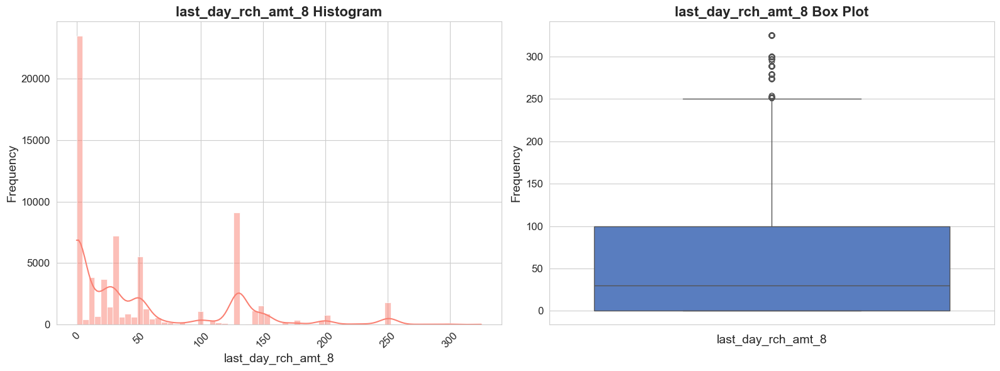

Initiating detailed analysis of total_rech_data_6...

Statistical summary for total_rech_data_6:
count    69999.000000
mean         0.252702
std          0.528579
min          0.000000
25%          0.000000
50%          0.000000
75%          0.252702
max          2.000000
Name: total_rech_data_6, dtype: float64

The mode of total_rech_data_6 is: 0.0



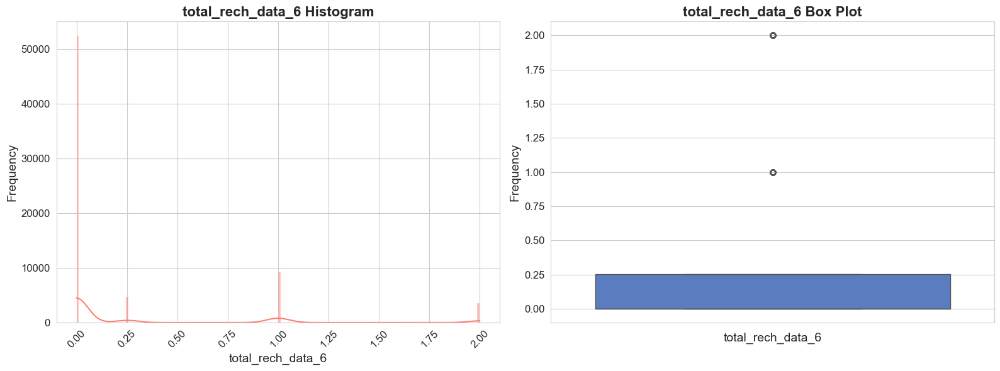

Initiating detailed analysis of total_rech_data_7...

Statistical summary for total_rech_data_7:
count    69999.000000
mean         0.250232
std          0.526699
min          0.000000
25%          0.000000
50%          0.000000
75%          0.250232
max          2.000000
Name: total_rech_data_7, dtype: float64

The mode of total_rech_data_7 is: 0.0



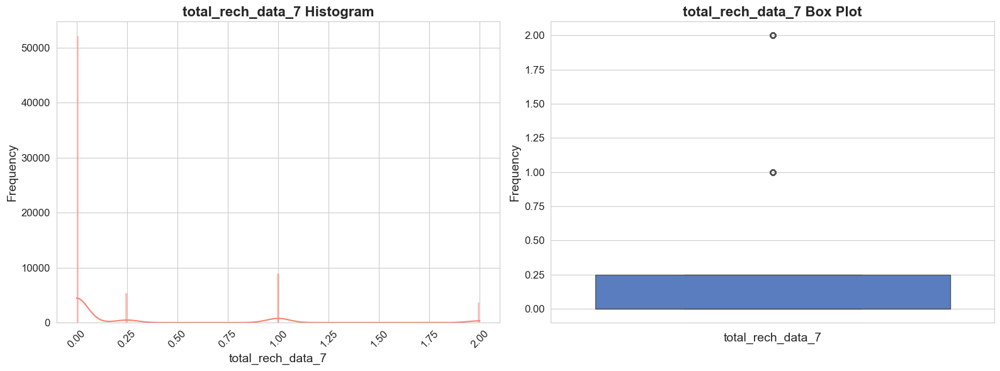

Initiating detailed analysis of total_rech_data_8...

Statistical summary for total_rech_data_8:
count    69999.000000
mean         0.257032
std          0.529170
min          0.000000
25%          0.000000
50%          0.000000
75%          0.257032
max          2.000000
Name: total_rech_data_8, dtype: float64

The mode of total_rech_data_8 is: 0.0



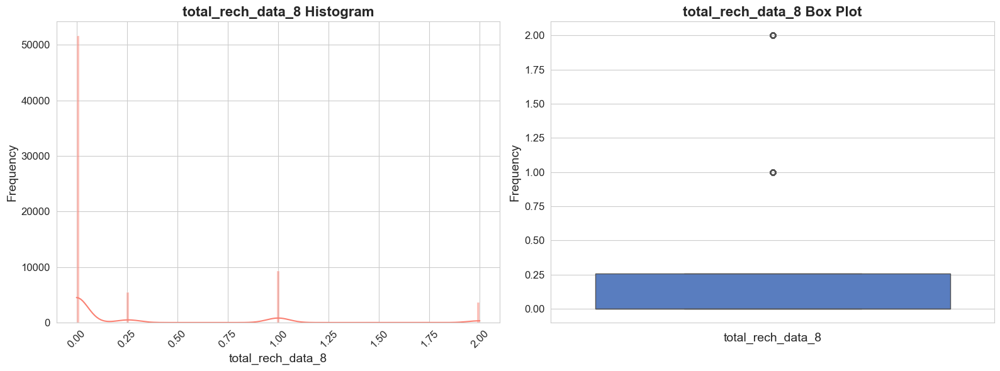

Initiating detailed analysis of max_rech_data_6...

Statistical summary for max_rech_data_6:
count    69999.000000
mean         0.421865
std          2.228555
min          0.000000
25%          0.000000
50%          0.000000
75%          0.421865
max         17.000000
Name: max_rech_data_6, dtype: float64

The mode of max_rech_data_6 is: 0.0



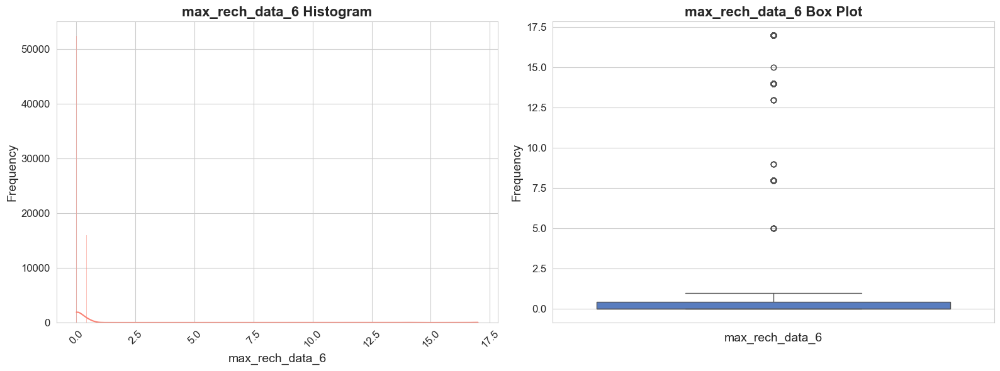

Initiating detailed analysis of max_rech_data_7...

Statistical summary for max_rech_data_7:
count    69999.000000
mean         2.184787
std          6.174468
min          0.000000
25%          0.000000
50%          0.000000
75%          2.184787
max         33.000000
Name: max_rech_data_7, dtype: float64

The mode of max_rech_data_7 is: 0.0



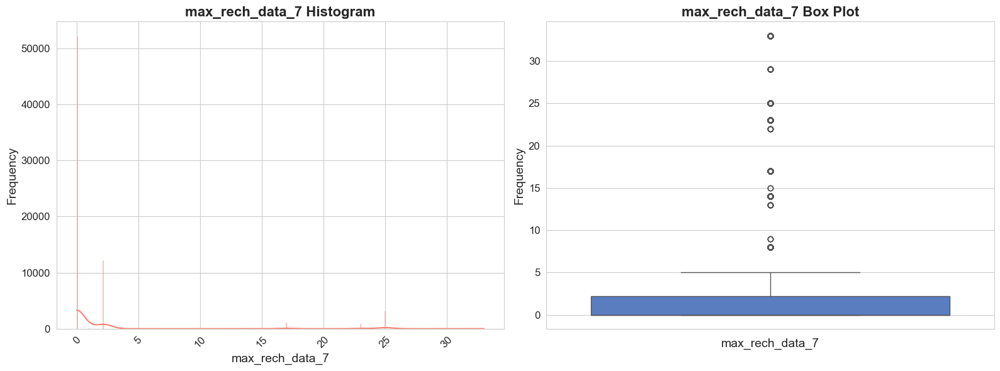

Initiating detailed analysis of max_rech_data_8...

Statistical summary for max_rech_data_8:
count    69999.000000
mean         2.623535
std          6.966308
min          0.000000
25%          0.000000
50%          0.000000
75%          2.623535
max         41.000000
Name: max_rech_data_8, dtype: float64

The mode of max_rech_data_8 is: 0.0



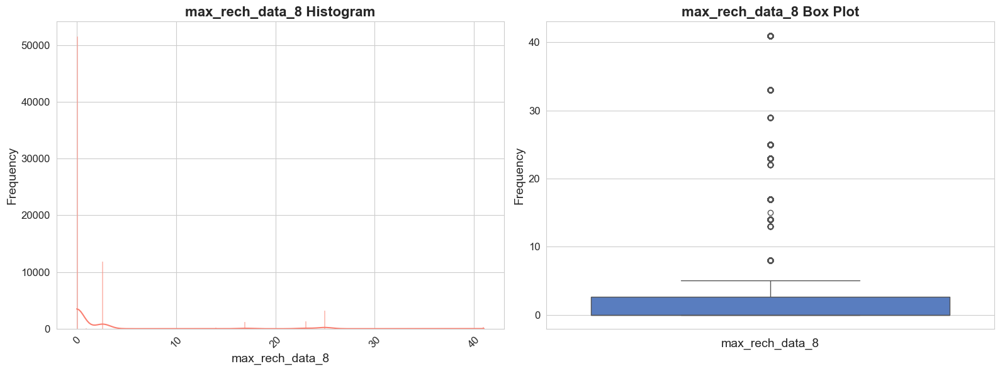

Initiating detailed analysis of count_rech_2g_6...

Statistical summary for count_rech_2g_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: count_rech_2g_6, dtype: float64

The mode of count_rech_2g_6 is: 0.0



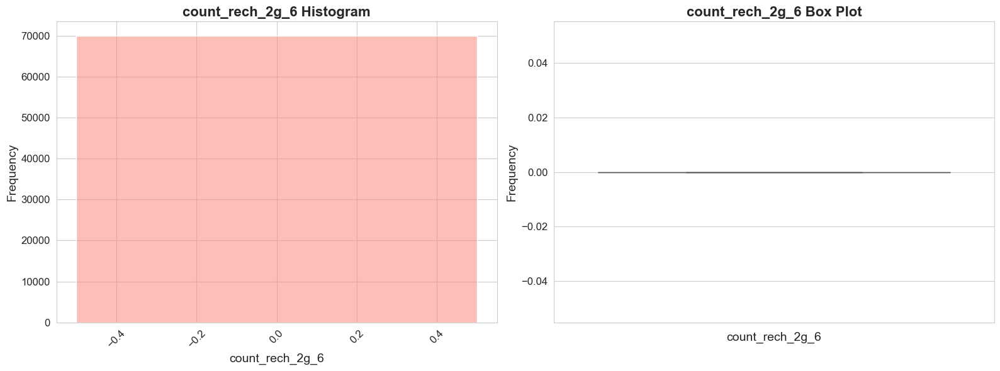

Initiating detailed analysis of count_rech_2g_7...

Statistical summary for count_rech_2g_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: count_rech_2g_7, dtype: float64

The mode of count_rech_2g_7 is: 0.0



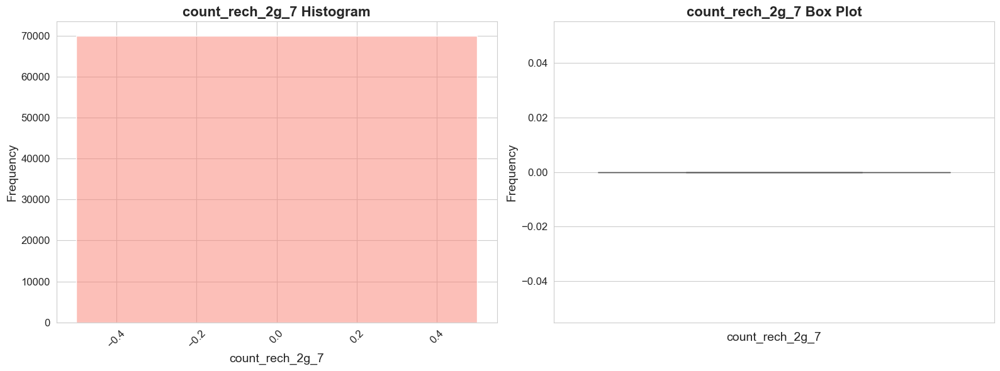

Initiating detailed analysis of count_rech_2g_8...

Statistical summary for count_rech_2g_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: count_rech_2g_8, dtype: float64

The mode of count_rech_2g_8 is: 0.0



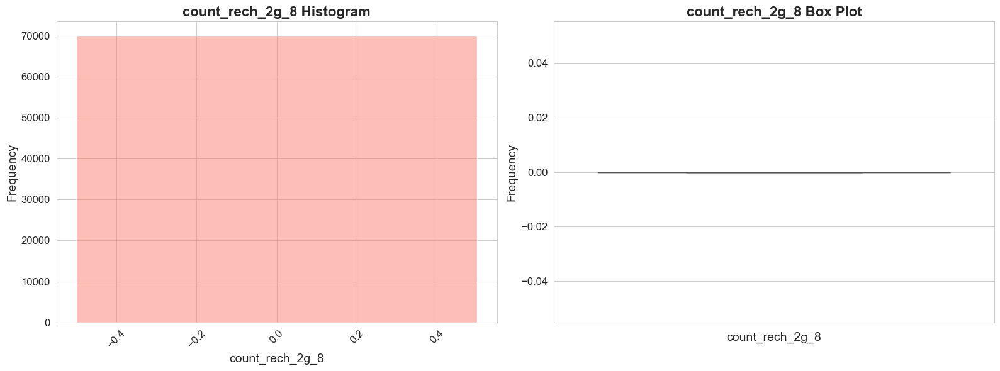

Initiating detailed analysis of count_rech_3g_6...

Statistical summary for count_rech_3g_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: count_rech_3g_6, dtype: float64

The mode of count_rech_3g_6 is: 0.0



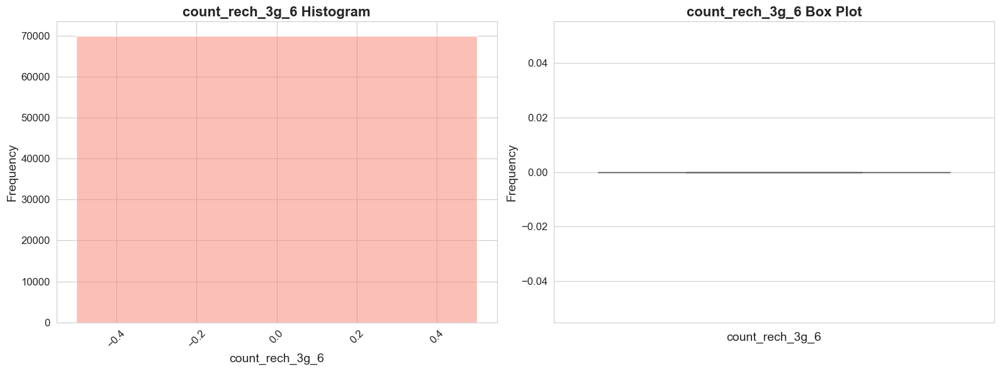

Initiating detailed analysis of count_rech_3g_7...

Statistical summary for count_rech_3g_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: count_rech_3g_7, dtype: float64

The mode of count_rech_3g_7 is: 0.0



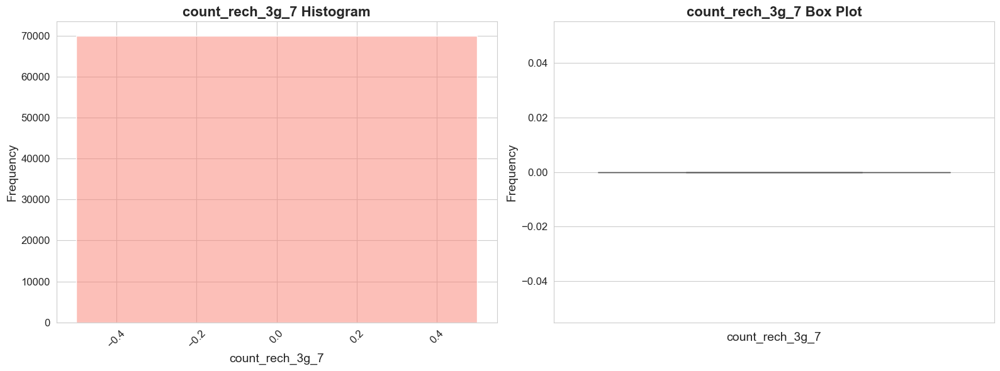

Initiating detailed analysis of count_rech_3g_8...

Statistical summary for count_rech_3g_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: count_rech_3g_8, dtype: float64

The mode of count_rech_3g_8 is: 0.0



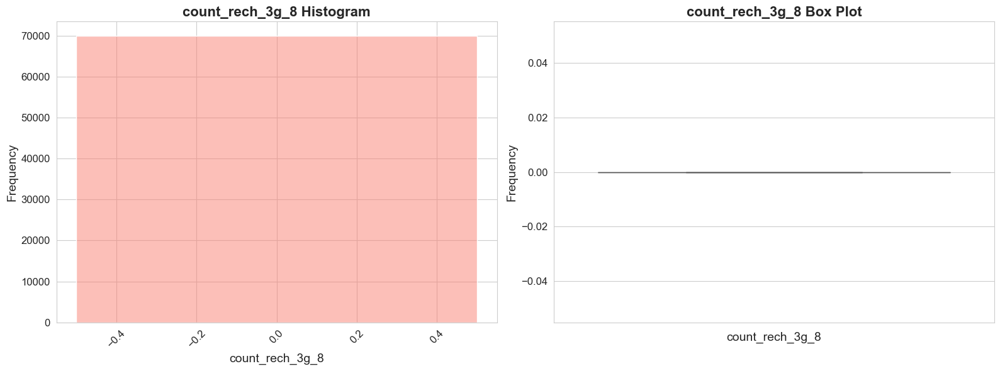

In [33]:
# Analysing for Recharge Data
rech_group = data_groups['Recharge Data']
for rech_group_keys in rech_group.keys():
    for rech in rech_group[rech_group_keys]:
        univariate_analysis = UnivariateAnalysis(df_train_clean, rech)
        univariate_analysis.analyze_without_bins()

Initiating detailed analysis of vol_2g_mb_6...

Statistical summary for vol_2g_mb_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: vol_2g_mb_6, dtype: float64

The mode of vol_2g_mb_6 is: 0.0



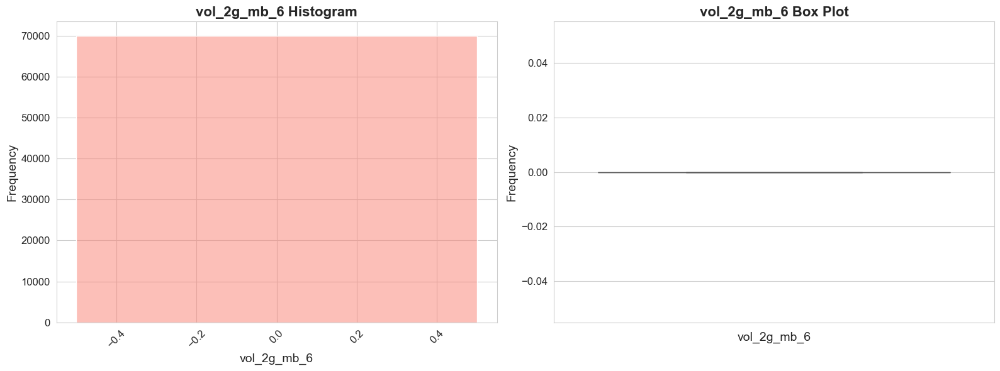

Initiating detailed analysis of vol_2g_mb_7...

Statistical summary for vol_2g_mb_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: vol_2g_mb_7, dtype: float64

The mode of vol_2g_mb_7 is: 0.0



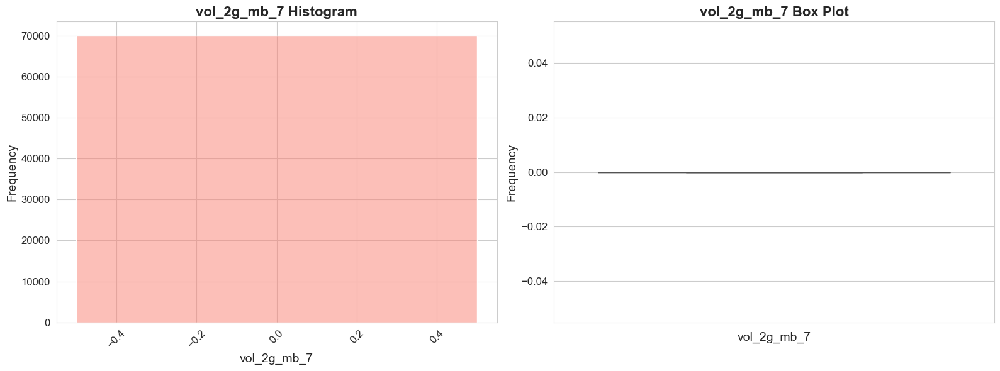

Initiating detailed analysis of vol_2g_mb_8...

Statistical summary for vol_2g_mb_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: vol_2g_mb_8, dtype: float64

The mode of vol_2g_mb_8 is: 0.0



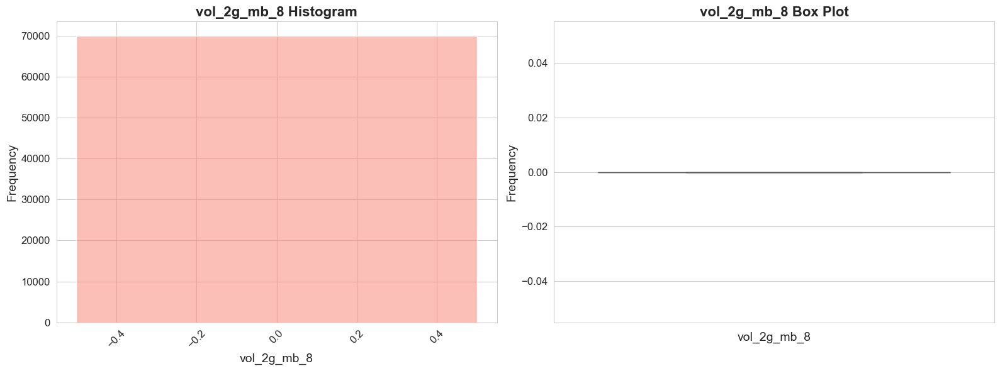

Initiating detailed analysis of vol_3g_mb_6...

Statistical summary for vol_3g_mb_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: vol_3g_mb_6, dtype: float64

The mode of vol_3g_mb_6 is: 0.0



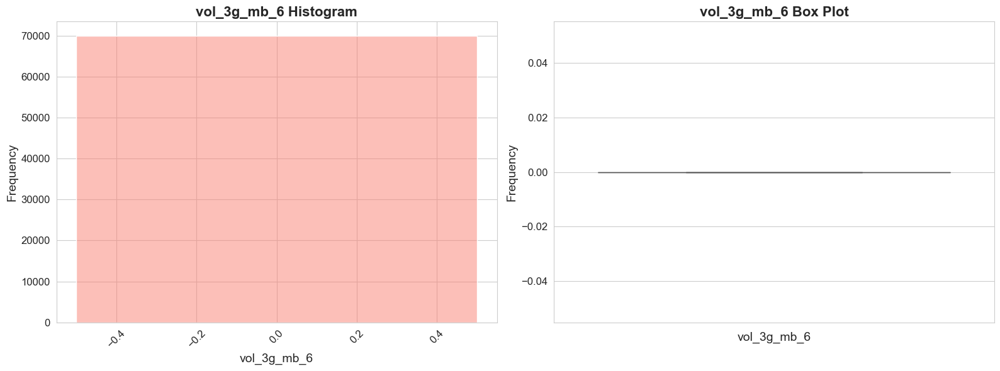

Initiating detailed analysis of vol_3g_mb_7...

Statistical summary for vol_3g_mb_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: vol_3g_mb_7, dtype: float64

The mode of vol_3g_mb_7 is: 0.0



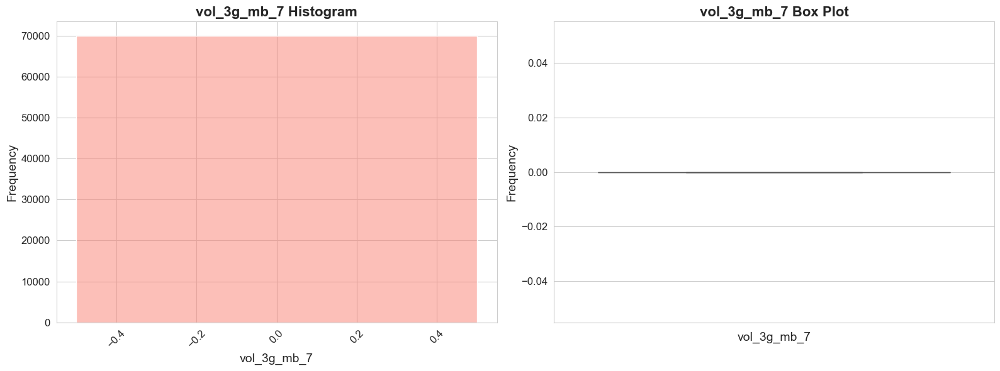

Initiating detailed analysis of vol_3g_mb_8...

Statistical summary for vol_3g_mb_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: vol_3g_mb_8, dtype: float64

The mode of vol_3g_mb_8 is: 0.0



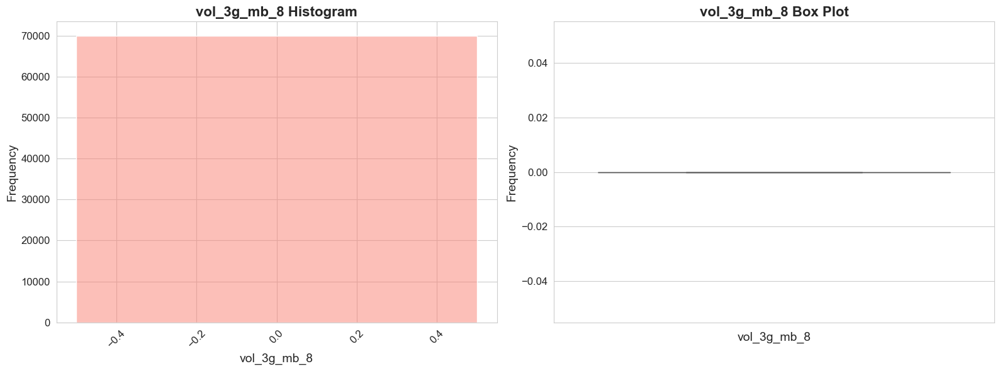

Initiating detailed analysis of av_rech_amt_data_6...

Statistical summary for av_rech_amt_data_6:
count    69999.000000
mean         0.241269
std          1.672479
min          0.000000
25%          0.000000
50%          0.000000
75%          0.241269
max         20.000000
Name: av_rech_amt_data_6, dtype: float64

The mode of av_rech_amt_data_6 is: 0.0



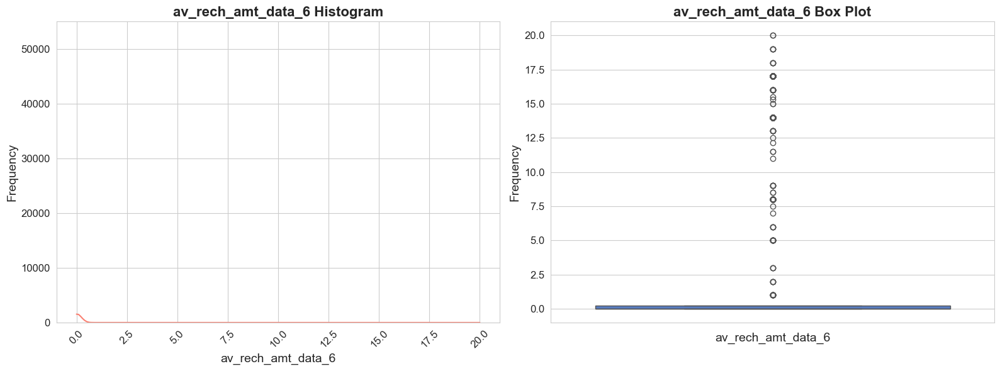

Initiating detailed analysis of av_rech_amt_data_7...

Statistical summary for av_rech_amt_data_7:
count    69999.000000
mean         0.962509
std          4.411379
min          0.000000
25%          0.000000
50%          0.000000
75%          0.962509
max         42.000000
Name: av_rech_amt_data_7, dtype: float64

The mode of av_rech_amt_data_7 is: 0.0



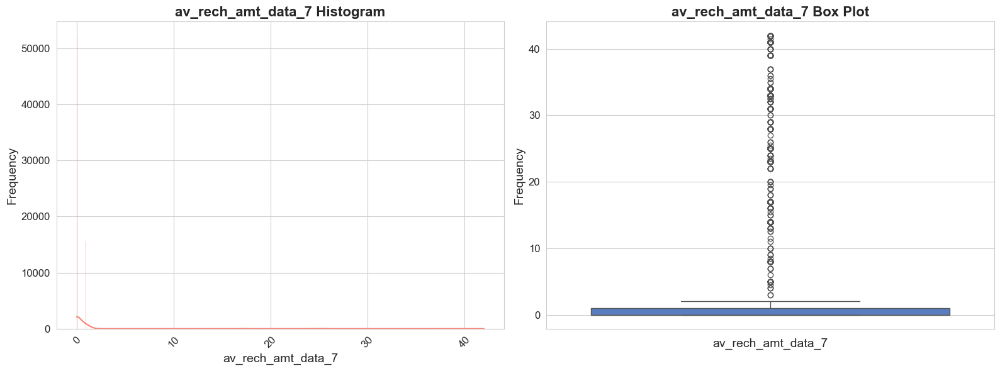

Initiating detailed analysis of av_rech_amt_data_8...

Statistical summary for av_rech_amt_data_8:
count    69999.000000
mean         2.194467
std          7.846828
min          0.000000
25%          0.000000
50%          0.000000
75%          2.194467
max         57.500000
Name: av_rech_amt_data_8, dtype: float64

The mode of av_rech_amt_data_8 is: 0.0



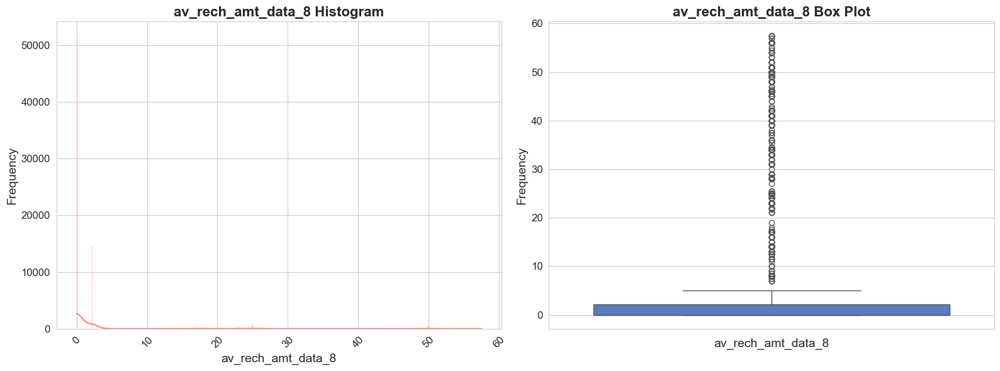

In [34]:
# Analysing for Volume and Usage
vol_group = data_groups['Volume and Usage']
for vol_group_keys in vol_group.keys():
    for vol in vol_group[vol_group_keys]:
        univariate_analysis = UnivariateAnalysis(df_train_clean, vol)
        univariate_analysis.analyze_without_bins()

Initiating detailed analysis of night_pck_user_6...

Statistical summary for night_pck_user_6:
count     69999.0
unique        2.0
top           0.0
freq      69555.0
Name: night_pck_user_6, dtype: float64

The mode of night_pck_user_6 is: 0.0



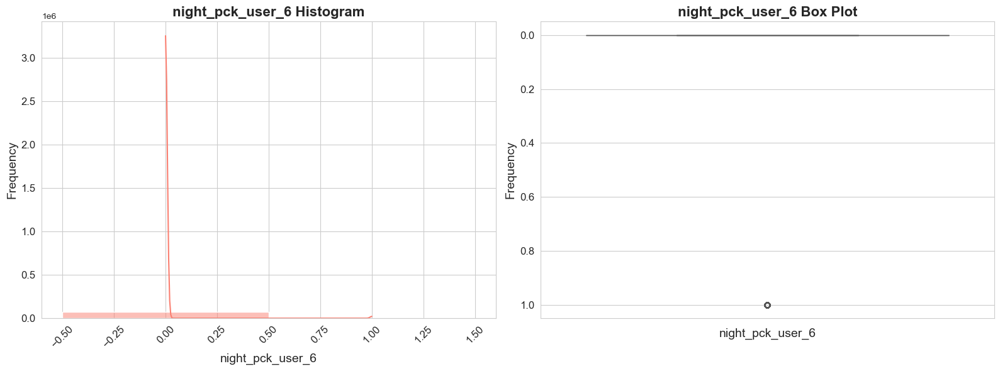

Initiating detailed analysis of night_pck_user_7...

Statistical summary for night_pck_user_7:
count     69999.0
unique        2.0
top           0.0
freq      69569.0
Name: night_pck_user_7, dtype: float64

The mode of night_pck_user_7 is: 0.0



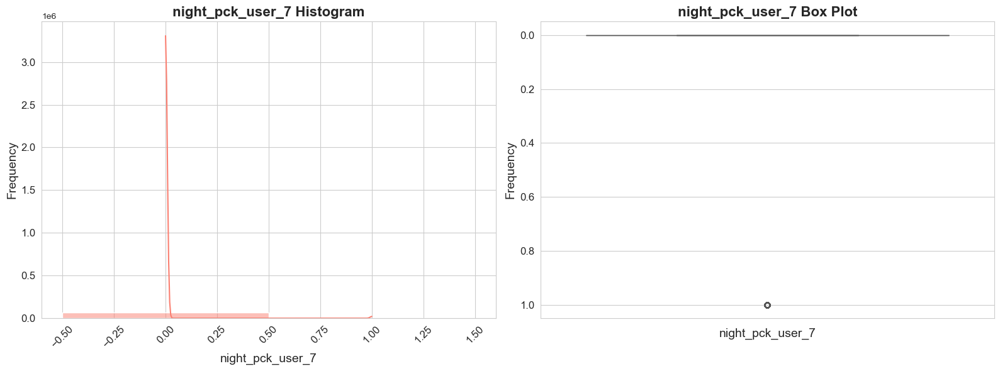

Initiating detailed analysis of night_pck_user_8...

Statistical summary for night_pck_user_8:
count     69999.0
unique        2.0
top           0.0
freq      69612.0
Name: night_pck_user_8, dtype: float64

The mode of night_pck_user_8 is: 0.0



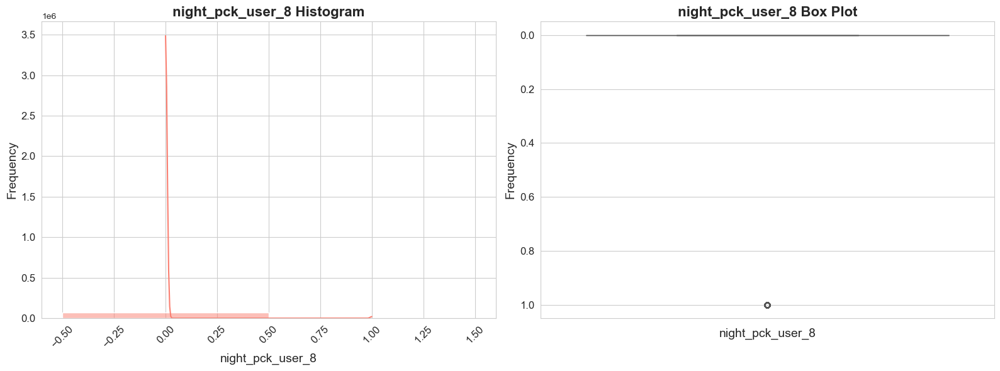

Initiating detailed analysis of monthly_2g_6...

Statistical summary for monthly_2g_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: monthly_2g_6, dtype: float64

The mode of monthly_2g_6 is: 0.0



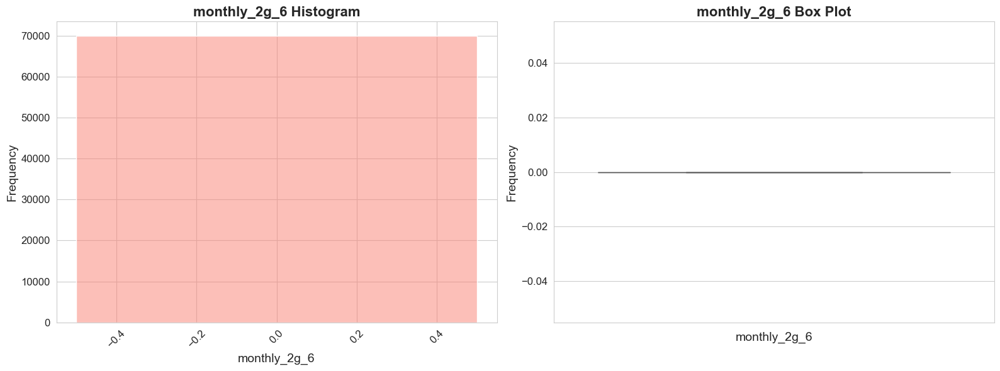

Initiating detailed analysis of monthly_2g_7...

Statistical summary for monthly_2g_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: monthly_2g_7, dtype: float64

The mode of monthly_2g_7 is: 0.0



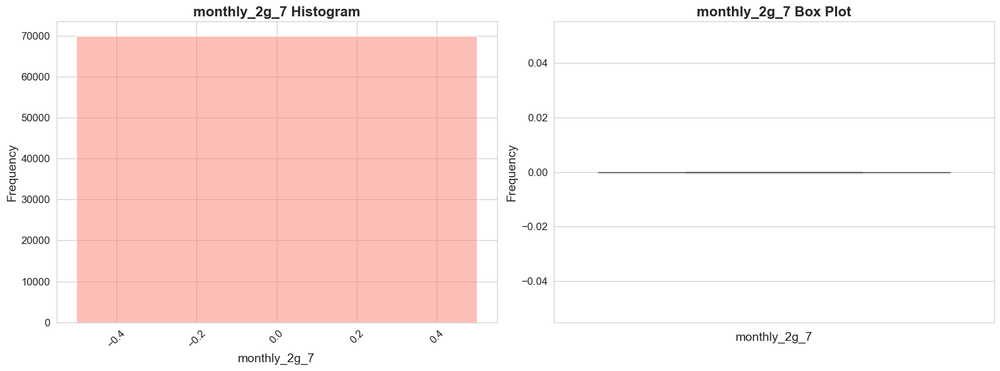

Initiating detailed analysis of monthly_2g_8...

Statistical summary for monthly_2g_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: monthly_2g_8, dtype: float64

The mode of monthly_2g_8 is: 0.0



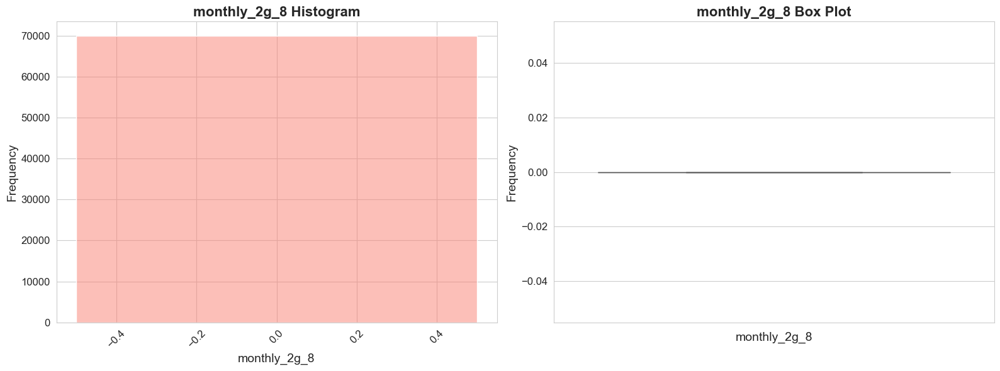

Initiating detailed analysis of sachet_2g_6...

Statistical summary for sachet_2g_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: sachet_2g_6, dtype: float64

The mode of sachet_2g_6 is: 0.0



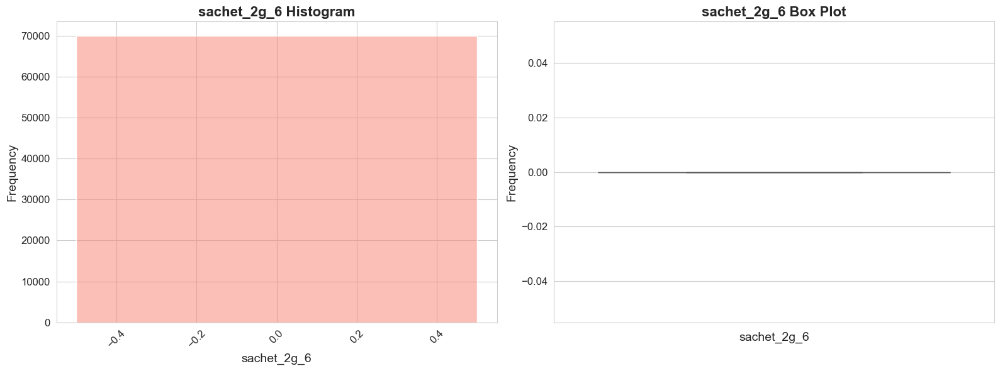

Initiating detailed analysis of sachet_2g_7...

Statistical summary for sachet_2g_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: sachet_2g_7, dtype: float64

The mode of sachet_2g_7 is: 0.0



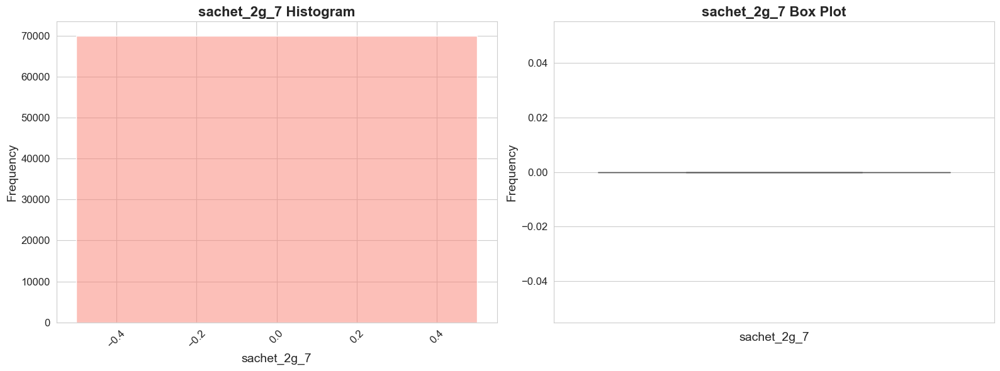

Initiating detailed analysis of sachet_2g_8...

Statistical summary for sachet_2g_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: sachet_2g_8, dtype: float64

The mode of sachet_2g_8 is: 0.0



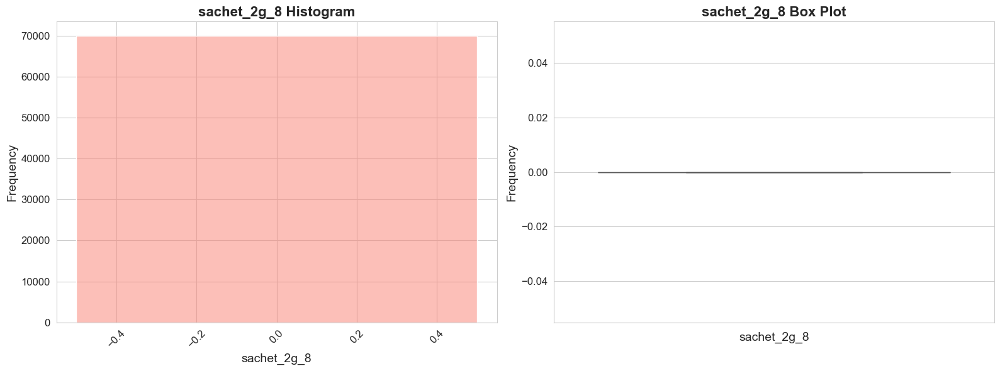

Initiating detailed analysis of monthly_3g_6...

Statistical summary for monthly_3g_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: monthly_3g_6, dtype: float64

The mode of monthly_3g_6 is: 0.0



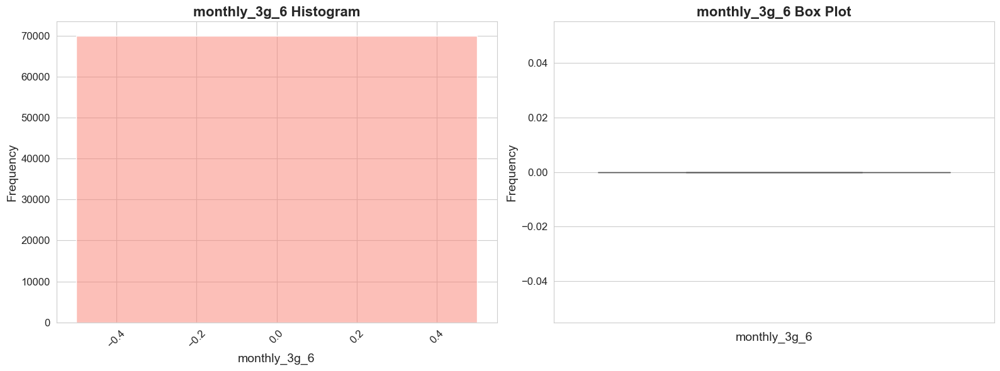

Initiating detailed analysis of monthly_3g_7...

Statistical summary for monthly_3g_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: monthly_3g_7, dtype: float64

The mode of monthly_3g_7 is: 0.0



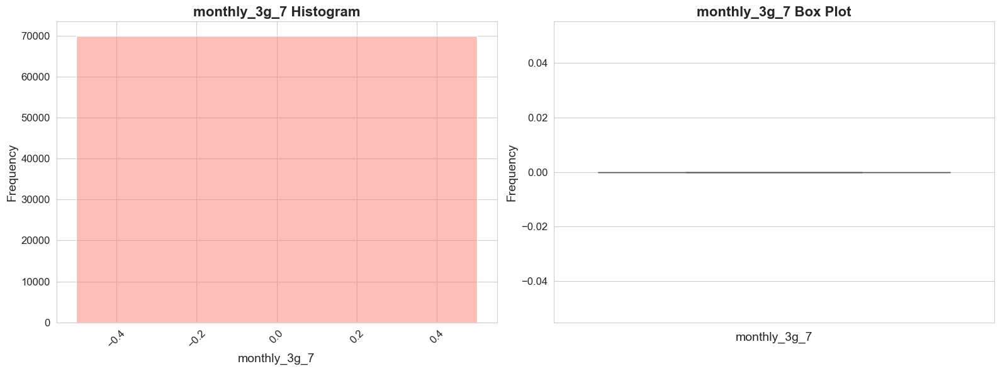

Initiating detailed analysis of monthly_3g_8...

Statistical summary for monthly_3g_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: monthly_3g_8, dtype: float64

The mode of monthly_3g_8 is: 0.0



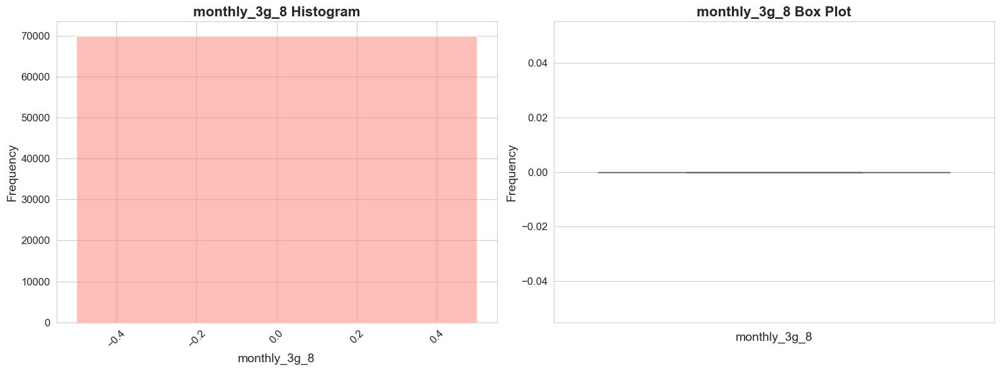

Initiating detailed analysis of sachet_3g_6...

Statistical summary for sachet_3g_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: sachet_3g_6, dtype: float64

The mode of sachet_3g_6 is: 0.0



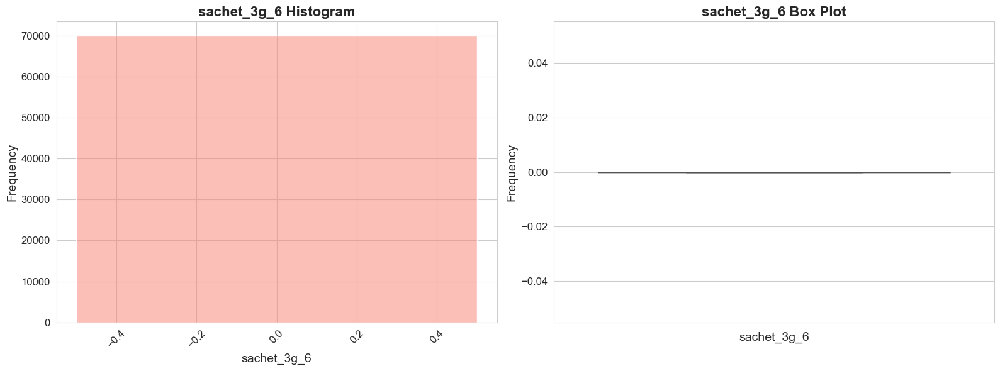

Initiating detailed analysis of sachet_3g_7...

Statistical summary for sachet_3g_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: sachet_3g_7, dtype: float64

The mode of sachet_3g_7 is: 0.0



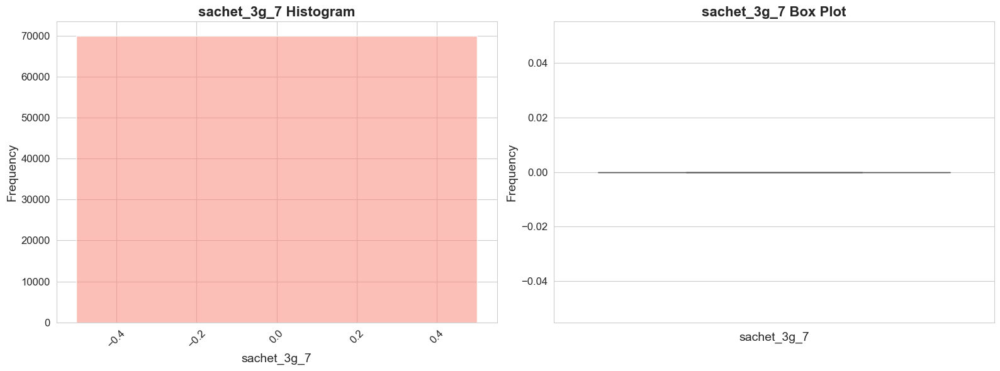

Initiating detailed analysis of sachet_3g_8...

Statistical summary for sachet_3g_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: sachet_3g_8, dtype: float64

The mode of sachet_3g_8 is: 0.0



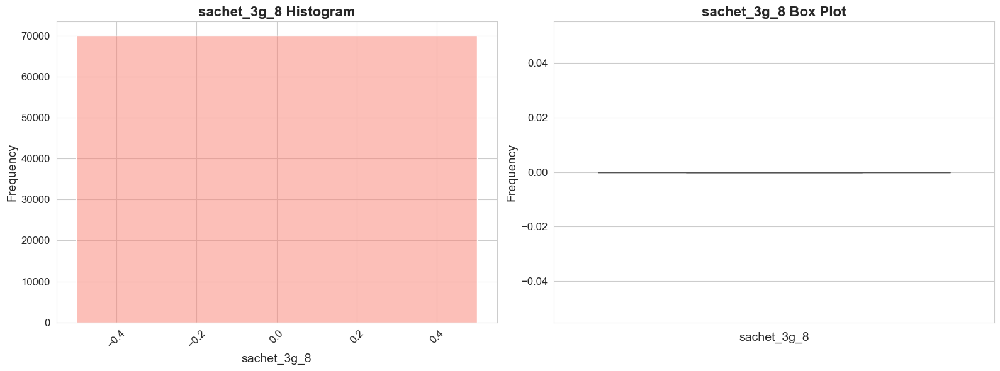

Initiating detailed analysis of fb_user_6...

Statistical summary for fb_user_6:
count     69999.0
unique        2.0
top           0.0
freq      53901.0
Name: fb_user_6, dtype: float64

The mode of fb_user_6 is: 0.0



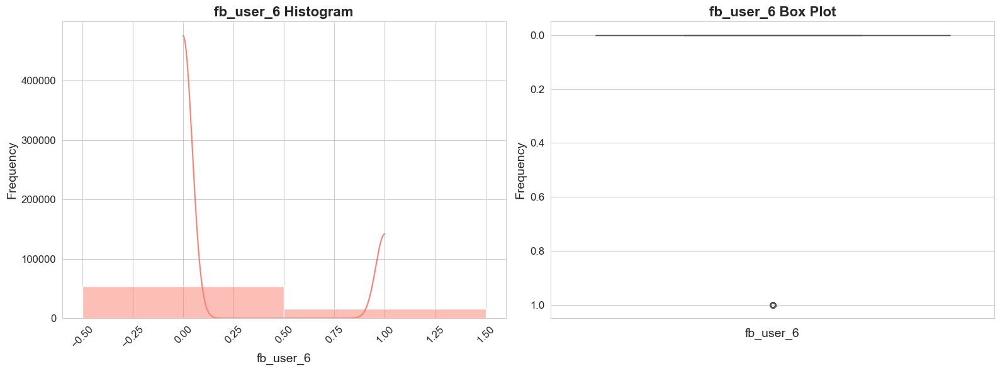

Initiating detailed analysis of fb_user_7...

Statistical summary for fb_user_7:
count     69999.0
unique        2.0
top           0.0
freq      53750.0
Name: fb_user_7, dtype: float64

The mode of fb_user_7 is: 0.0



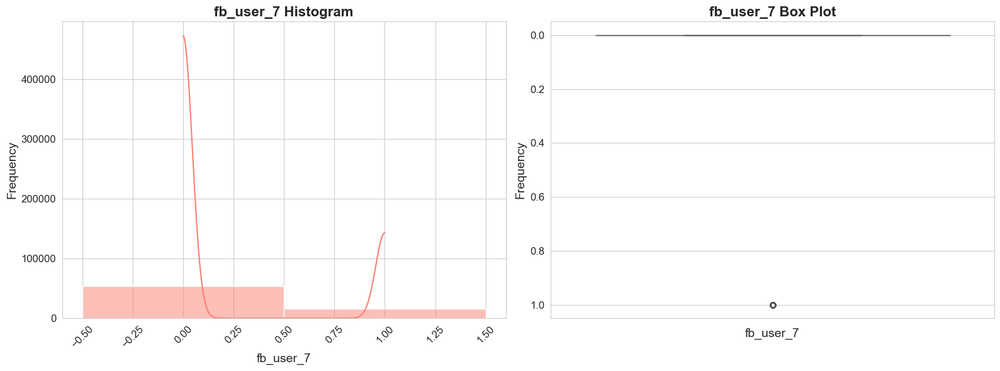

Initiating detailed analysis of fb_user_8...

Statistical summary for fb_user_8:
count     69999.0
unique        2.0
top           0.0
freq      53602.0
Name: fb_user_8, dtype: float64

The mode of fb_user_8 is: 0.0



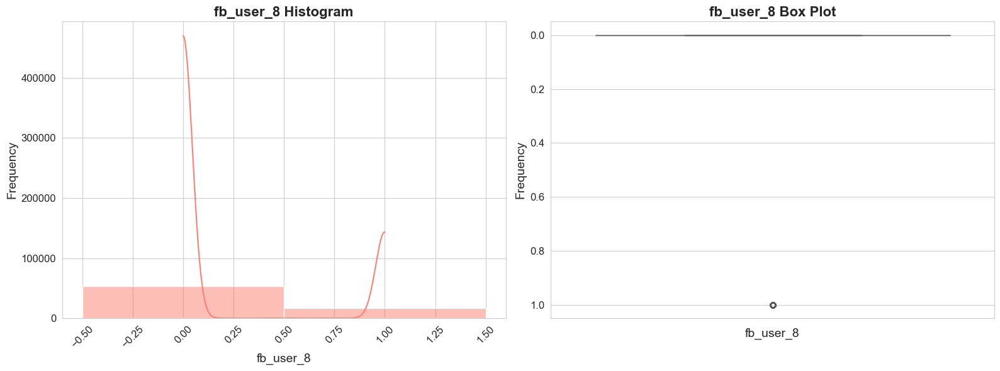

In [35]:
# Analysing for Service Schemes
serv_group = data_groups['Service Schemes']
for serv_group_keys in serv_group.keys():
    for serv in serv_group[serv_group_keys]:
        univariate_analysis = UnivariateAnalysis(df_train_clean, serv)
        univariate_analysis.analyze_without_bins()

Initiating detailed analysis of date_of_last_rech_data_6_No_recharge_6...

Statistical summary for date_of_last_rech_data_6_No_recharge_6:
count    69999.000000
mean         0.749025
std          0.433577
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: date_of_last_rech_data_6_No_recharge_6, dtype: float64

The mode of date_of_last_rech_data_6_No_recharge_6 is: 1



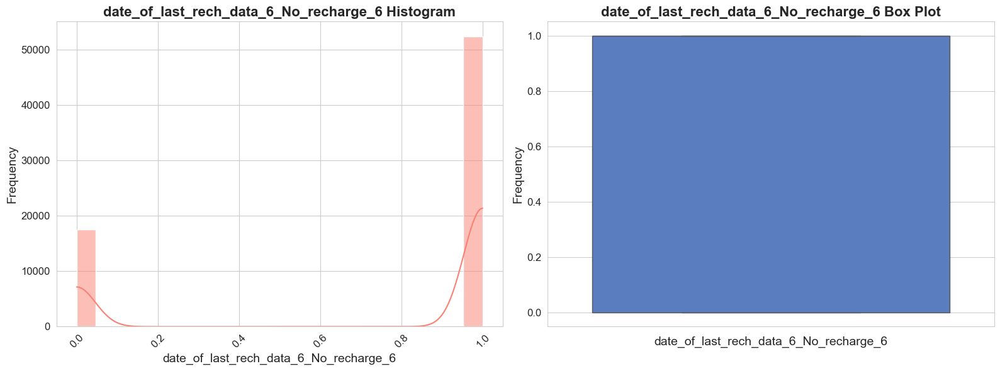

Initiating detailed analysis of date_of_last_rech_data_7_No_recharge_7...

Statistical summary for date_of_last_rech_data_7_No_recharge_7:
count    69999.000000
mean         0.744782
std          0.435987
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: date_of_last_rech_data_7_No_recharge_7, dtype: float64

The mode of date_of_last_rech_data_7_No_recharge_7 is: 1



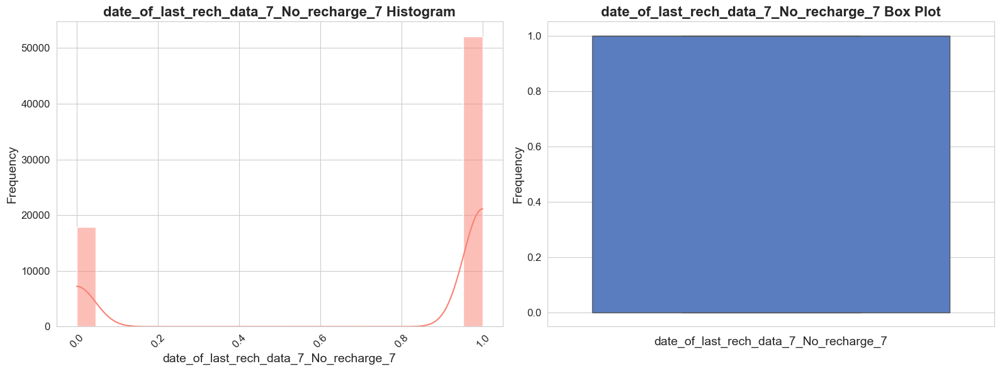

Initiating detailed analysis of date_of_last_rech_data_8_No_recharge_8...

Statistical summary for date_of_last_rech_data_8_No_recharge_8:
count    69999.000000
mean         0.736896
std          0.440321
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: date_of_last_rech_data_8_No_recharge_8, dtype: float64

The mode of date_of_last_rech_data_8_No_recharge_8 is: 1



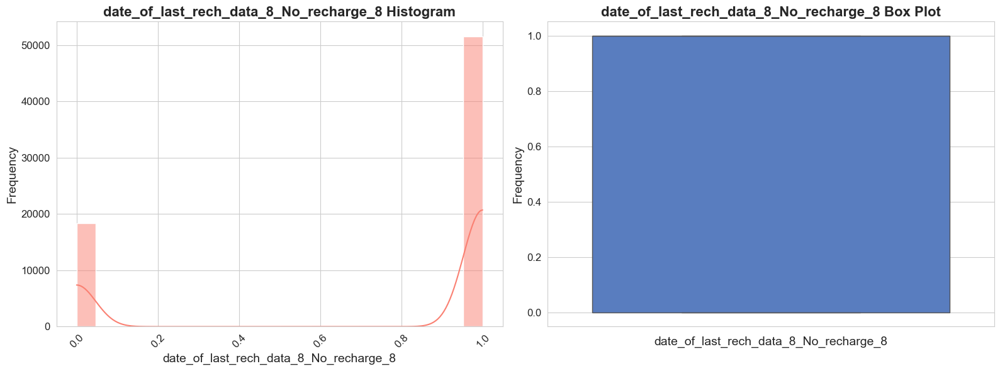

Initiating detailed analysis of date_of_last_rech_6_No_recharge_6...

Statistical summary for date_of_last_rech_6_No_recharge_6:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: date_of_last_rech_6_No_recharge_6, dtype: float64

The mode of date_of_last_rech_6_No_recharge_6 is: 0.0



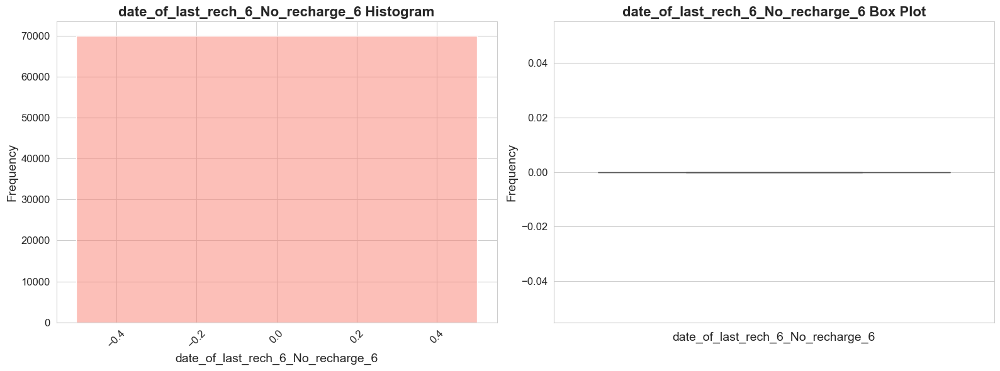

Initiating detailed analysis of date_of_last_rech_7_No_recharge_7...

Statistical summary for date_of_last_rech_7_No_recharge_7:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: date_of_last_rech_7_No_recharge_7, dtype: float64

The mode of date_of_last_rech_7_No_recharge_7 is: 0.0



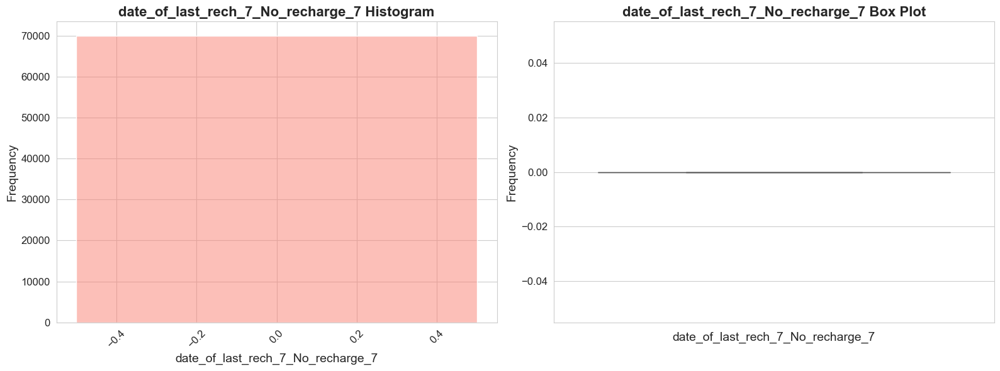

Initiating detailed analysis of date_of_last_rech_8_No_recharge_8...

Statistical summary for date_of_last_rech_8_No_recharge_8:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: date_of_last_rech_8_No_recharge_8, dtype: float64

The mode of date_of_last_rech_8_No_recharge_8 is: 0.0



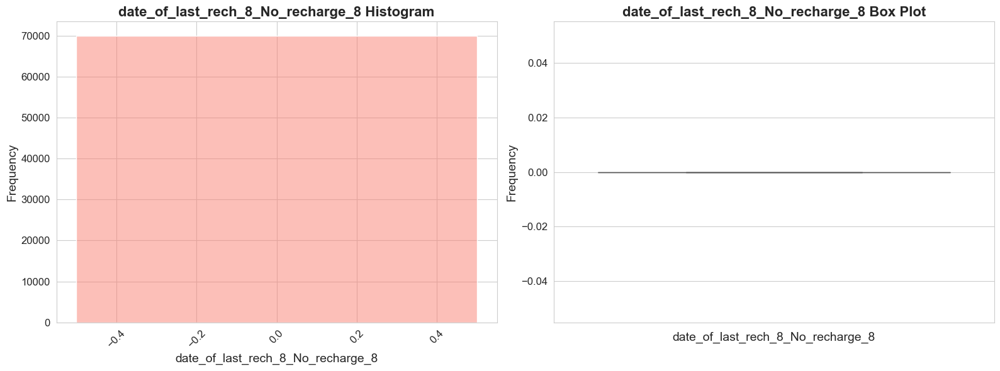

In [36]:
# Analysing for Date of Last Recharge (Weekday and No Recharge)
last_rech_group = data_groups['Date of Last Recharge (No Recharge)']
for last_rech_group_keys in last_rech_group.keys():
    for last_rech in last_rech_group[last_rech_group_keys]:
        univariate_analysis = UnivariateAnalysis(df_train_clean, last_rech)
        univariate_analysis.analyze_without_bins()

Initiating detailed analysis of aon...

Statistical summary for aon:
count    69999.000000
mean      1218.103935
std        948.540461
min        180.000000
25%        468.000000
50%        868.000000
75%       1807.000000
max       3821.000000
Name: aon, dtype: float64

The mode of aon is: 3651.0



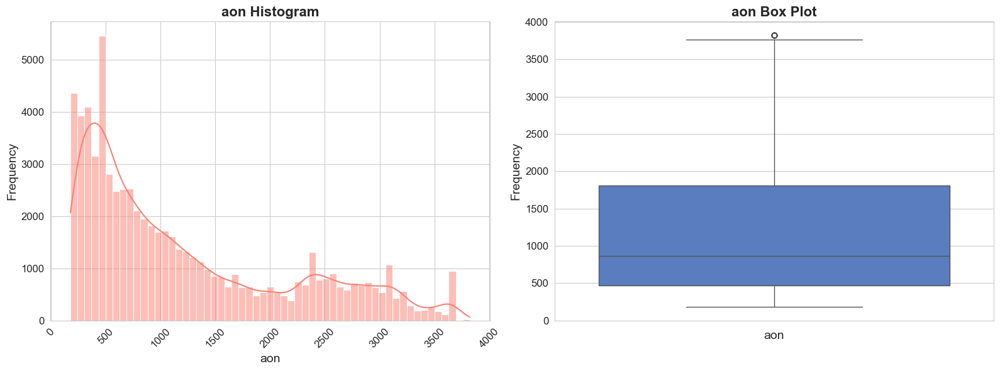

Initiating detailed analysis of aug_vbc_3g...

Statistical summary for aug_vbc_3g:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: aug_vbc_3g, dtype: float64

The mode of aug_vbc_3g is: 0.0



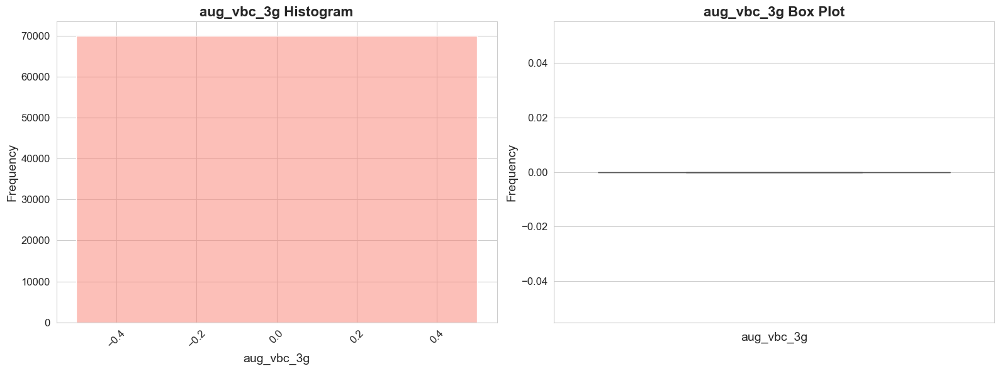

Initiating detailed analysis of jul_vbc_3g...

Statistical summary for jul_vbc_3g:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: jul_vbc_3g, dtype: float64

The mode of jul_vbc_3g is: 0.0



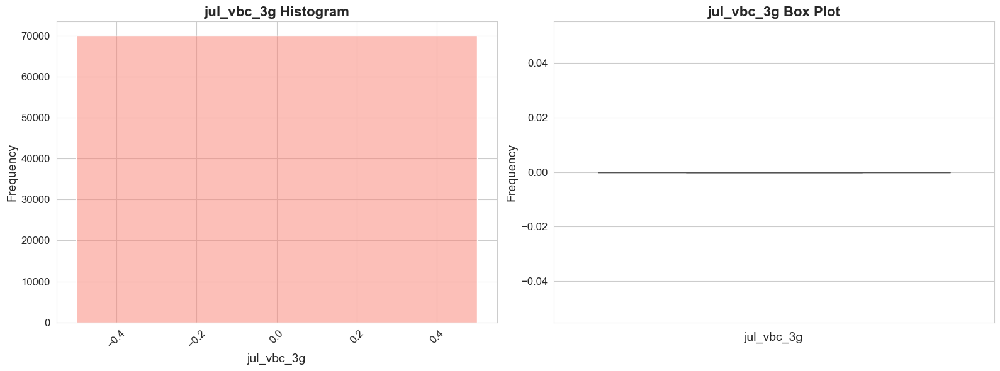

Initiating detailed analysis of jun_vbc_3g...

Statistical summary for jun_vbc_3g:
count    69999.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: jun_vbc_3g, dtype: float64

The mode of jun_vbc_3g is: 0.0



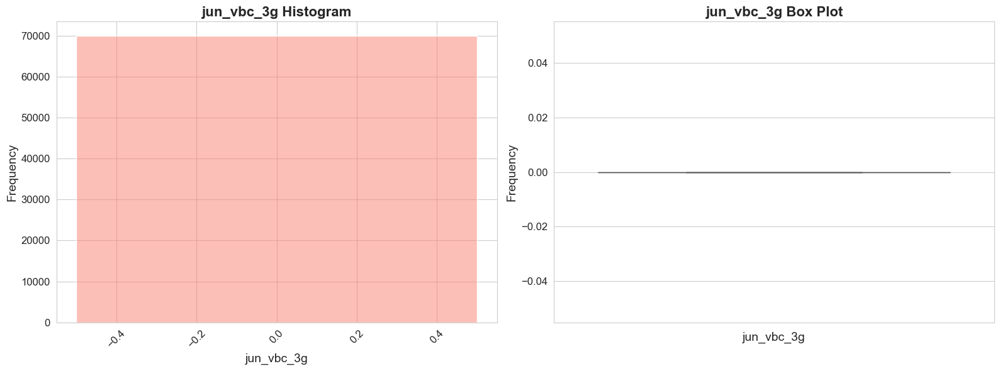

In [37]:
# Analysing for Miscellaneous
misc_group = data_groups['Miscellaneous']
for misc in misc_group:
    univariate_analysis = UnivariateAnalysis(df_train_clean, misc)
    univariate_analysis.analyze_without_bins()

Initiating detailed analysis of churn_probability...

Statistical summary for churn_probability:
count     69999
unique        2
top           0
freq      62867
Name: churn_probability, dtype: int64

The mode of churn_probability is: 0



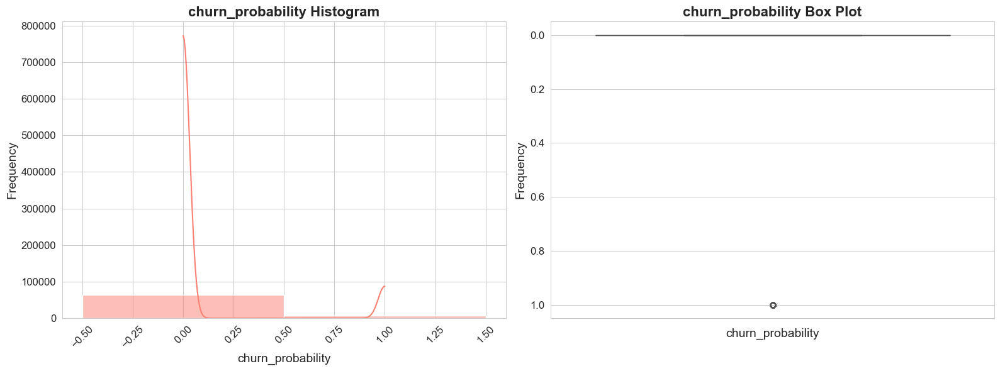

In [38]:
# Analysing for Churn Probability
churn_group = data_groups['Churn Probability']
for churn in churn_group:
    univariate_analysis = UnivariateAnalysis(df_train_clean, churn)
    univariate_analysis.analyze_without_bins()


### Bivariate Analysis

In [39]:
# A class for performing bivariate analysis on a DataFrame.

class BivariateAnalysis:
    def __init__(self, dataframe):
        self.dataframe = dataframe

    # Generates a scatter plot for two specified columns in a DataFrame.
    def scatter_plot(self, x_column, y_column, marker_size=2, alpha=0.2, color='orange'):

        sns.set(style="whitegrid")
        plt.figure(figsize=(7, 5))
        sns.scatterplot(data=self.dataframe, x=x_column, y=y_column, s=marker_size, alpha=alpha, color=color)

        # Set plot title and labels
        plt.title(f'Scatter Plot: {x_column} vs {y_column}', fontsize=13)
        plt.xlabel(x_column, fontsize=12)
        plt.ylabel(y_column, fontsize=12)

        plt.tight_layout()
        plt.show()

    # Generates a boxplot for a categorical column against a numerical column for bivariate analysis.
    def boxplot(self, categorical_column, numerical_column, palette='pastel'):

        sns.set(style="whitegrid")
        plt.figure(figsize=(7, 5))
        sns.boxplot(data=self.dataframe, x=categorical_column, y=numerical_column, palette=palette)

        # Set plot title and labels
        plt.title(f'Boxplot: {categorical_column} vs {numerical_column}', fontsize=13)
        plt.xlabel(categorical_column, fontsize=12)
        plt.ylabel(numerical_column, fontsize=12)

        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

In [40]:
bivariate_analysis = BivariateAnalysis(df_train_clean)

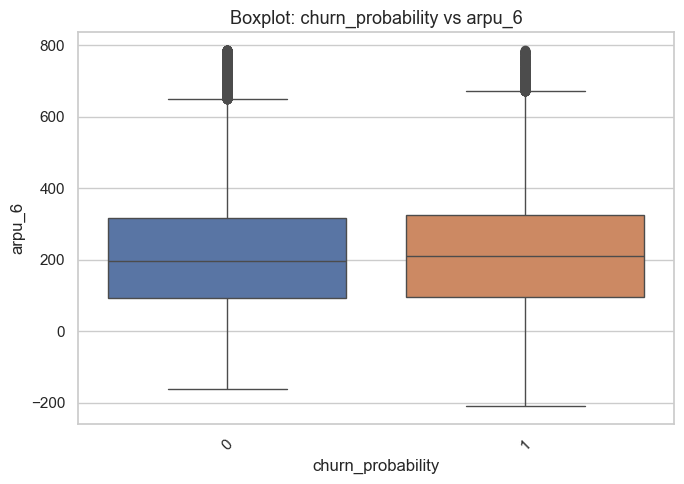

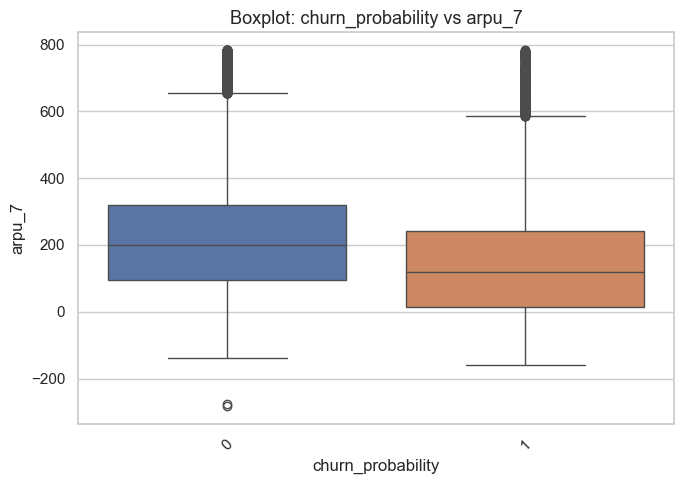

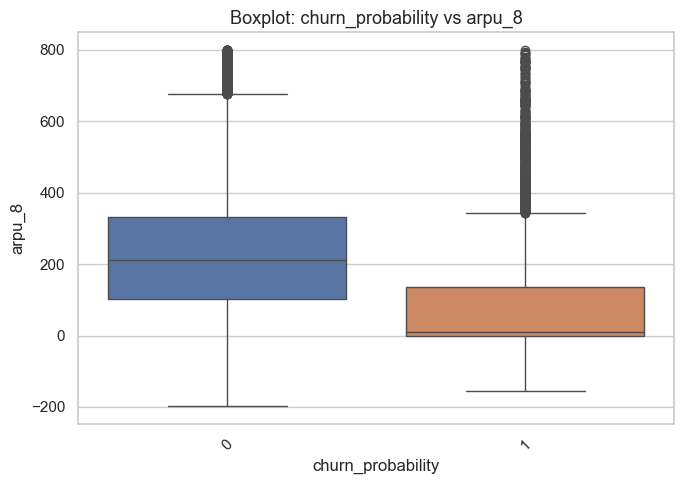

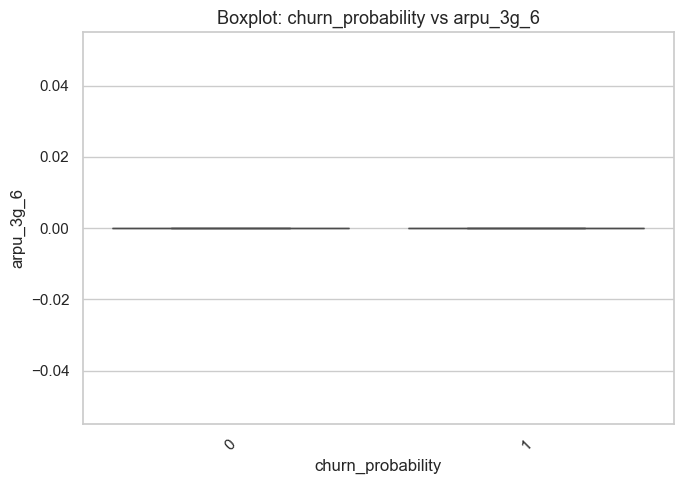

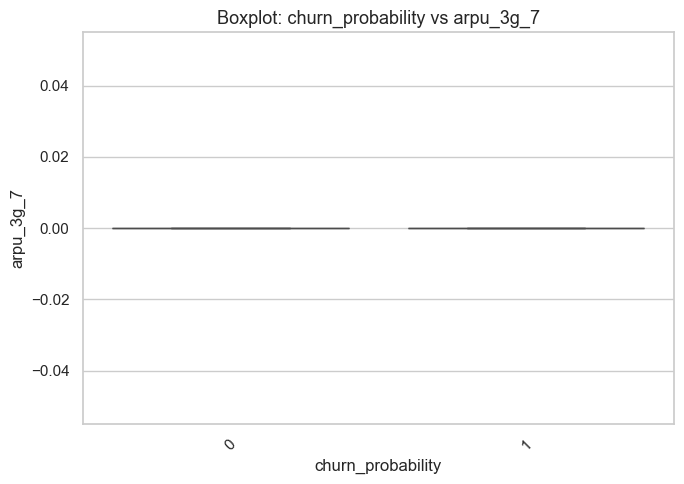

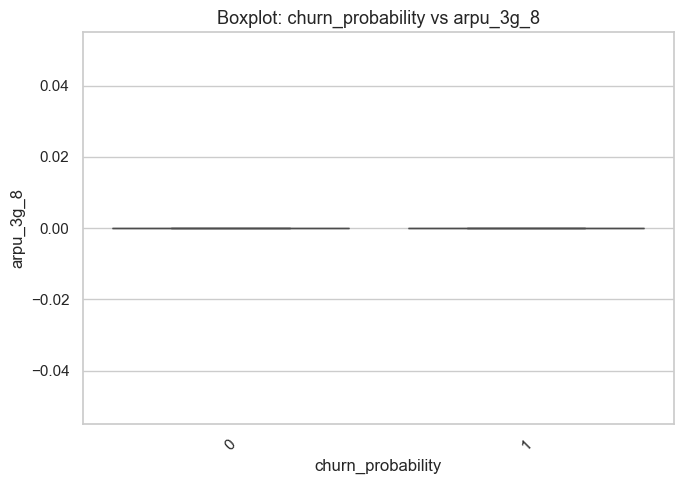

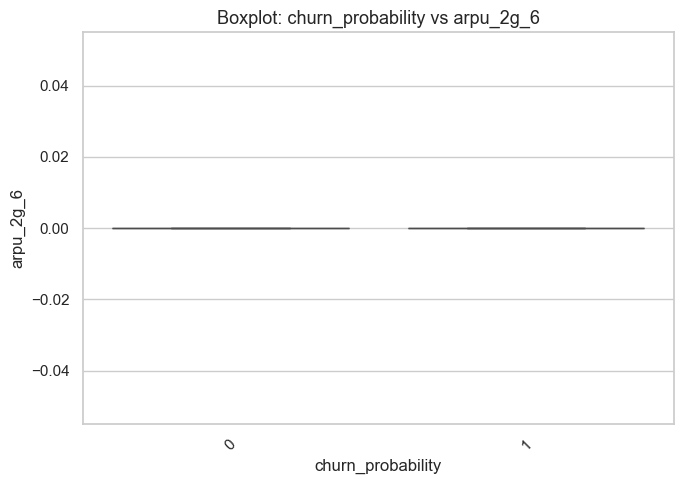

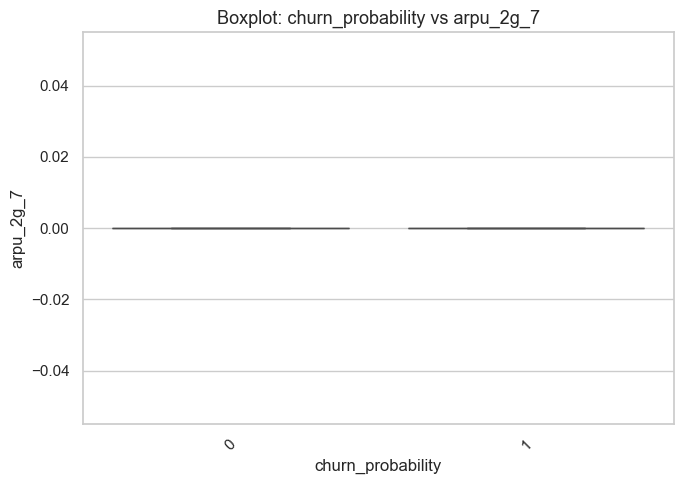

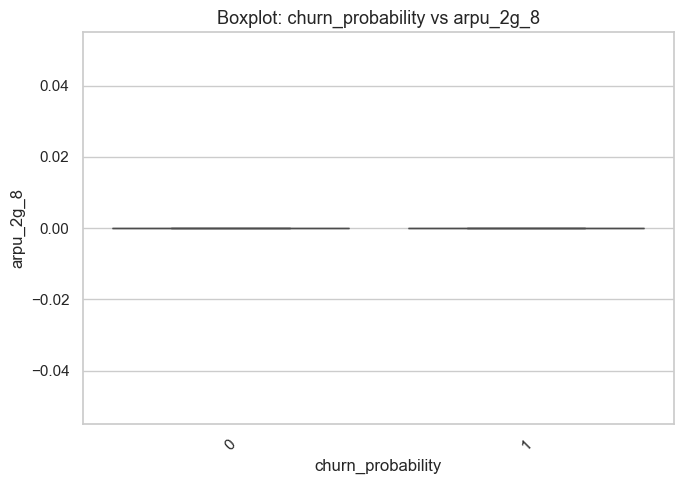

In [41]:
# Analysing for ARPU (Average Revenue Per User)
arpu_group = data_groups['ARPU (Average Revenue Per User)']
for arpu in arpu_group:
    bivariate_analysis.boxplot('churn_probability', arpu, palette='deep')

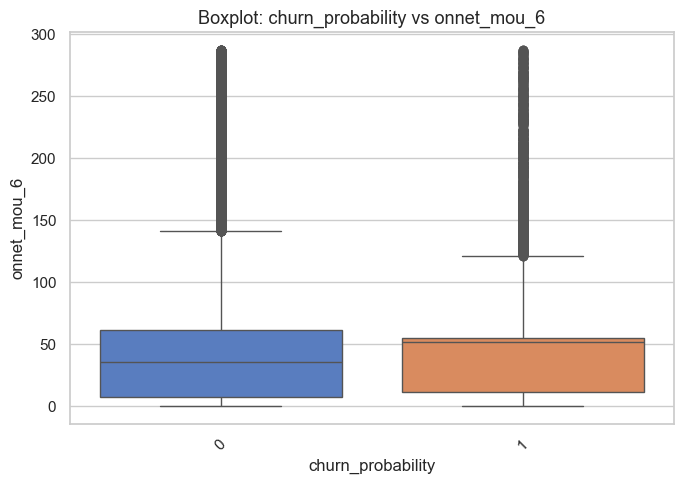

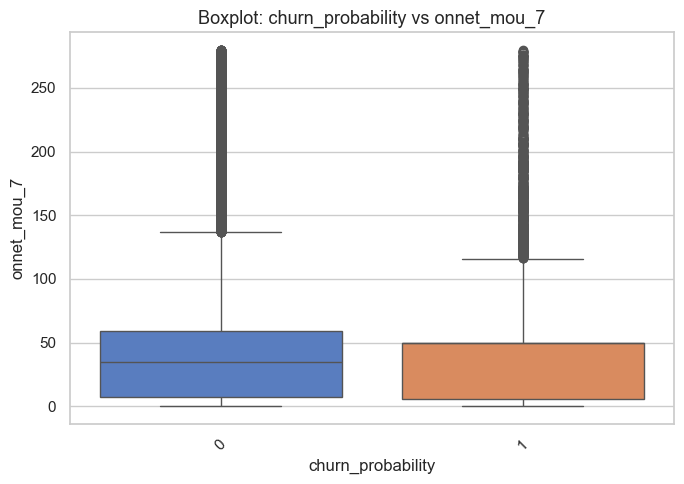

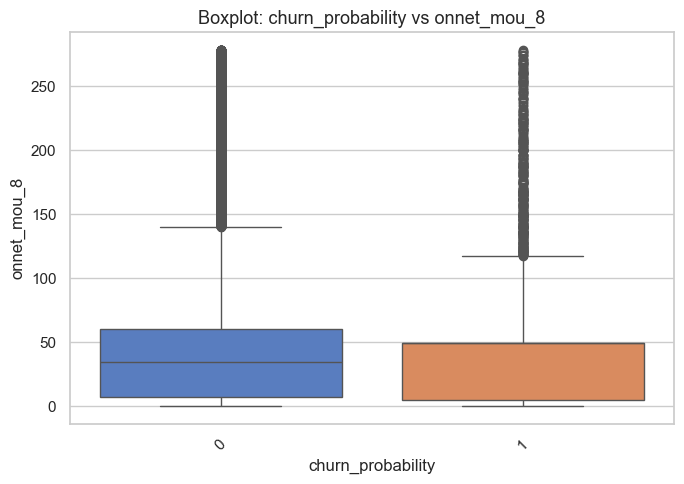

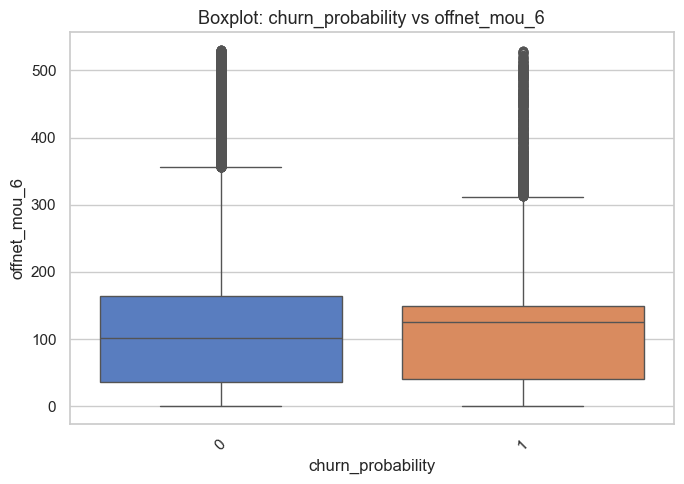

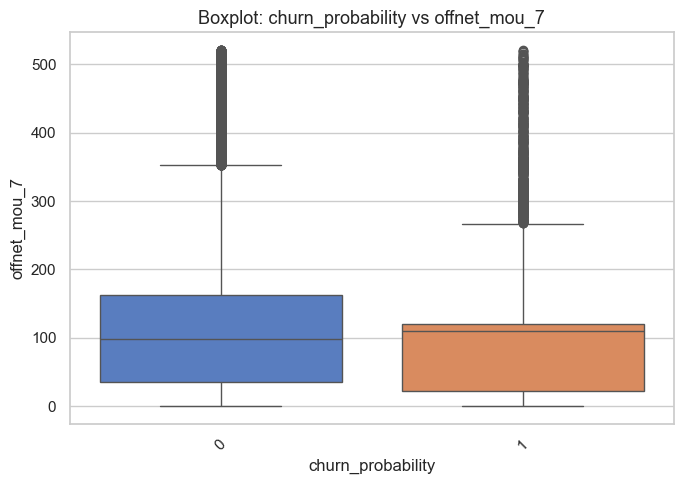

...

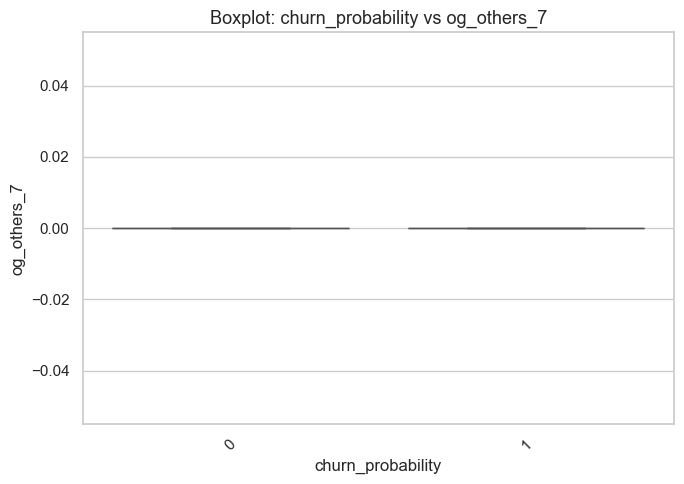

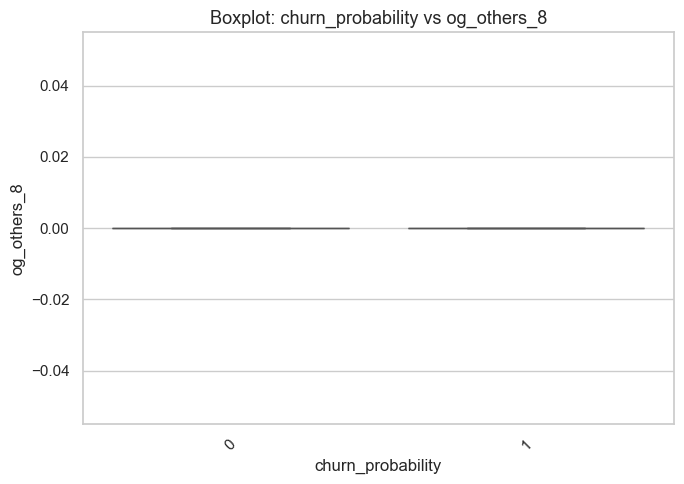

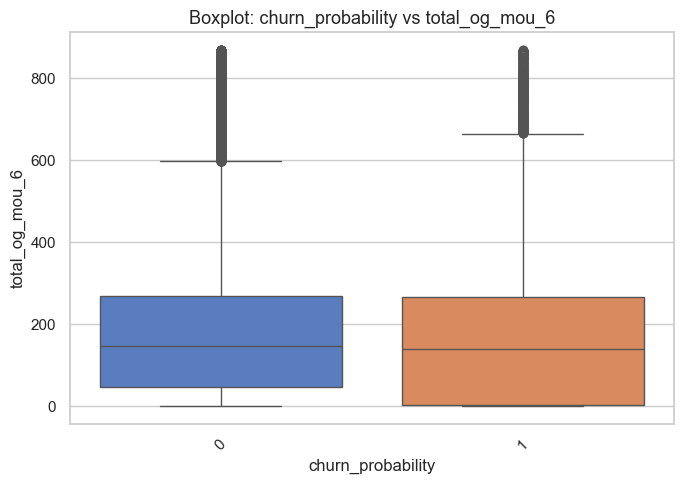

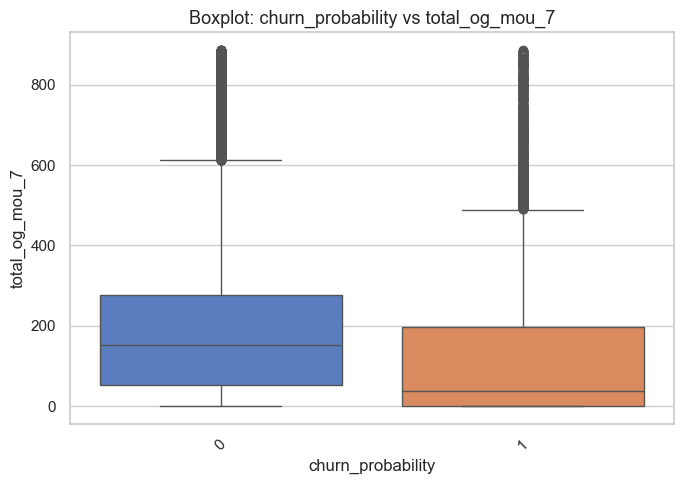

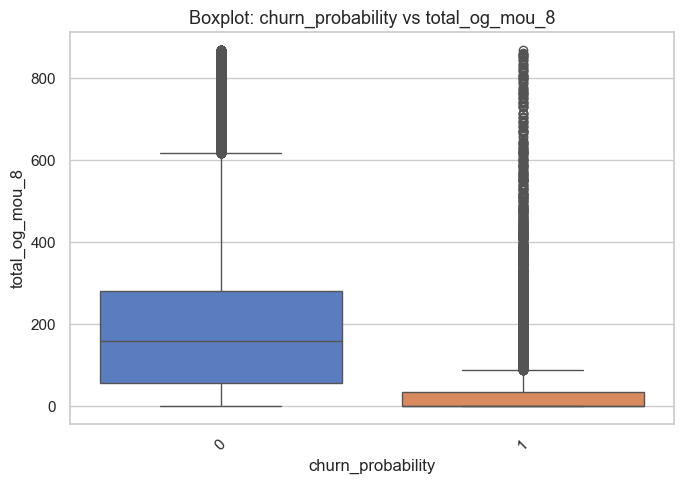

In [42]:
# Analysing for Minutes of Usage (MOU)
mou_group = data_groups['Minutes of Usage (MOU)']
for mou_group_keys in mou_group.keys():
    for mou in mou_group[mou_group_keys]:
        bivariate_analysis.boxplot('churn_probability', mou, palette='muted')

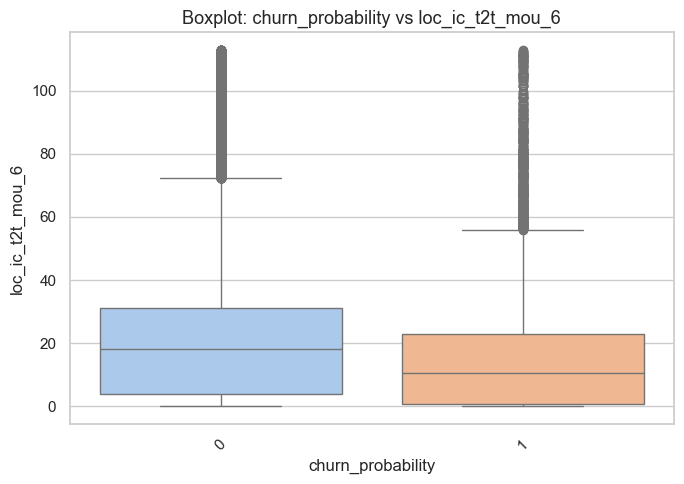

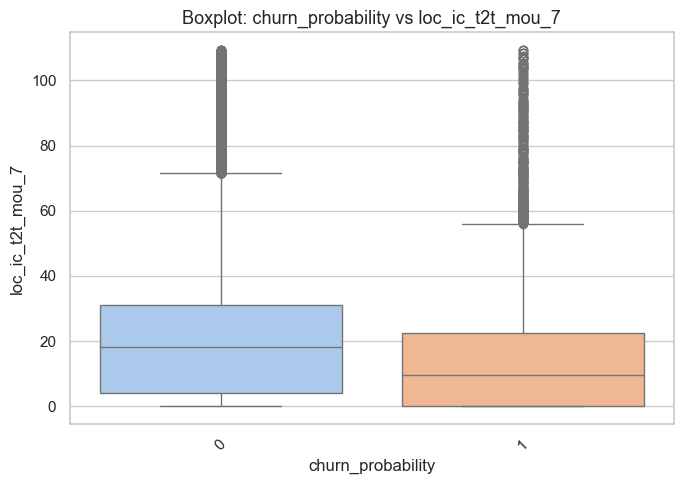

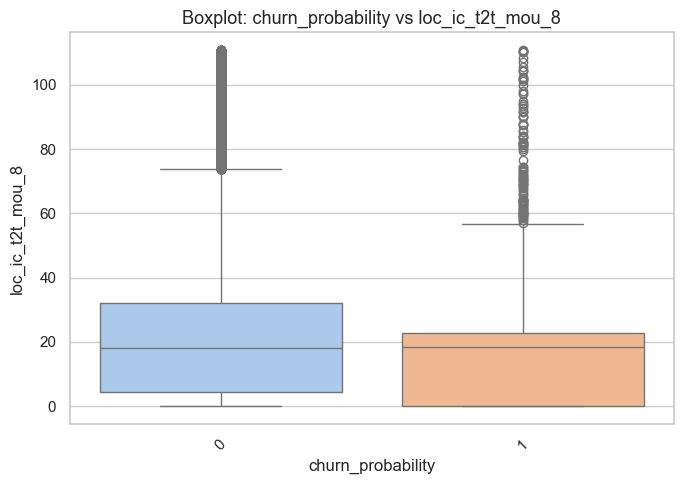

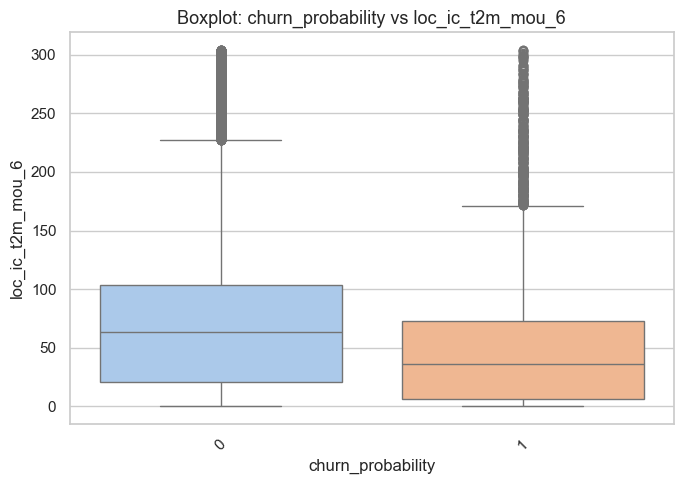

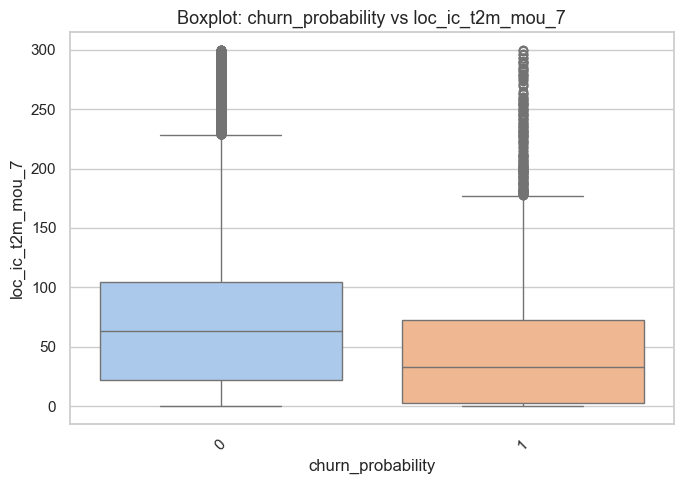

...

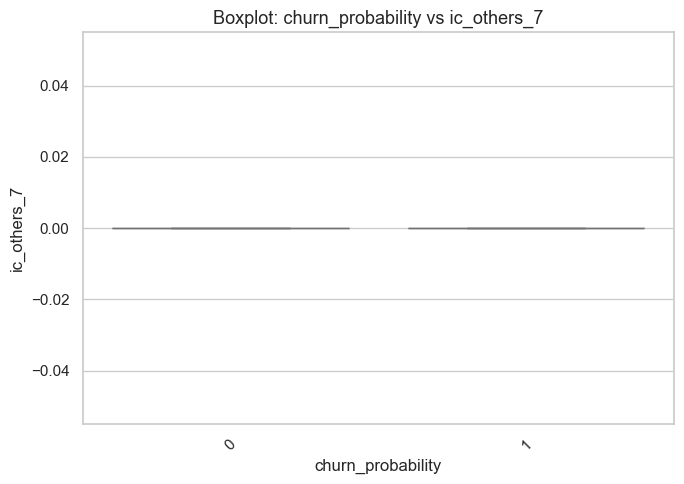

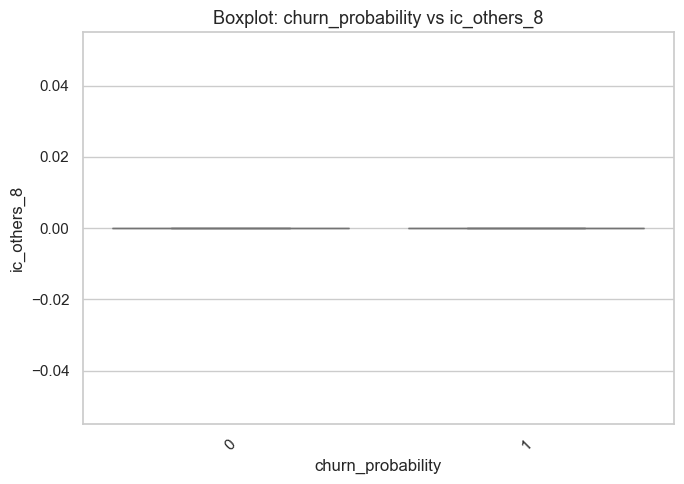

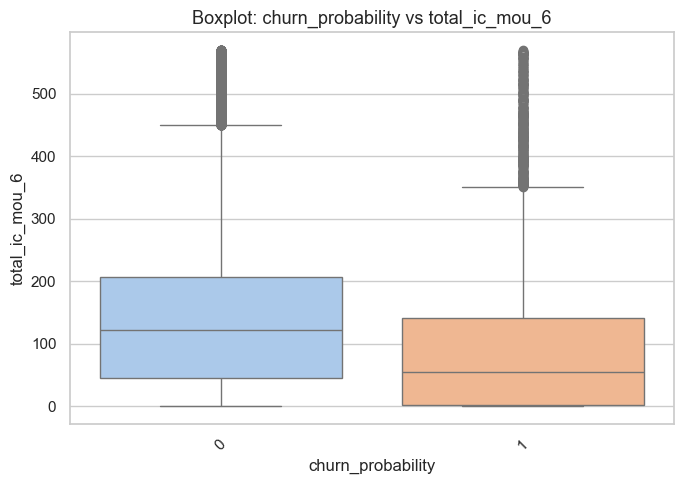

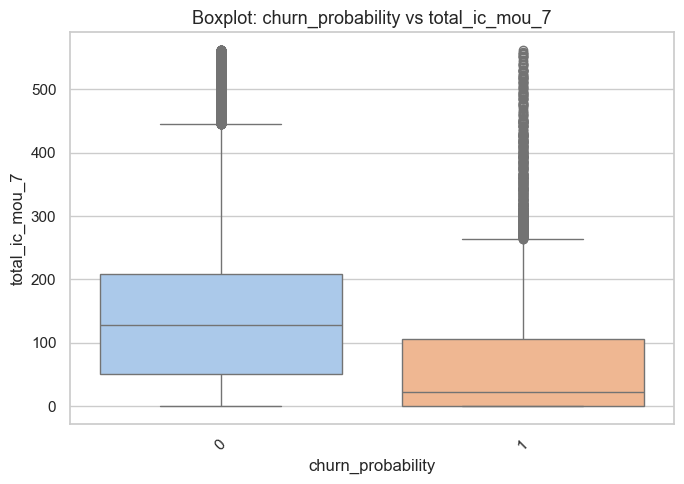

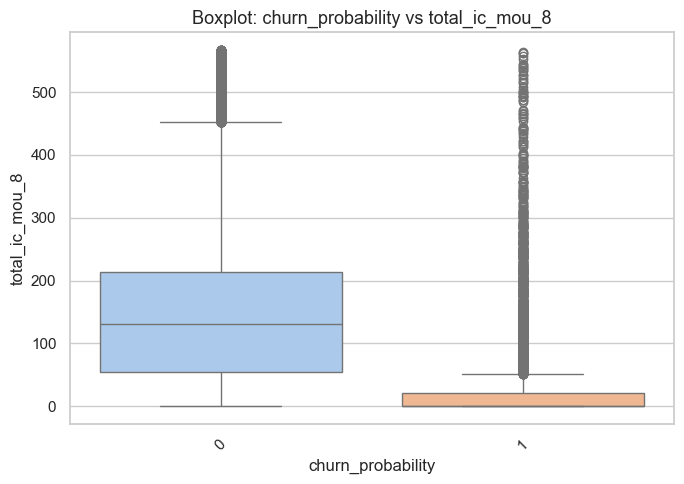

In [43]:
# Analysing for Incoming Calls MOU
ig_mou_group = data_groups['Incoming Calls MOU']
for ig_mou_keys in ig_mou_group.keys():
    for ig_mou in ig_mou_group[ig_mou_keys]:
        bivariate_analysis.boxplot('churn_probability', ig_mou, palette='pastel')

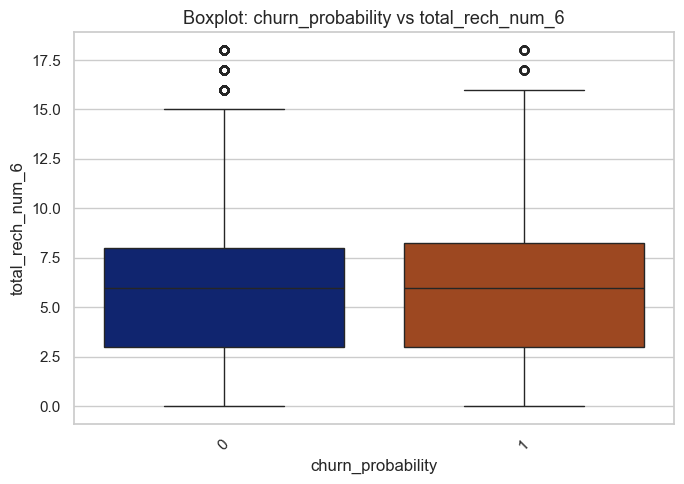

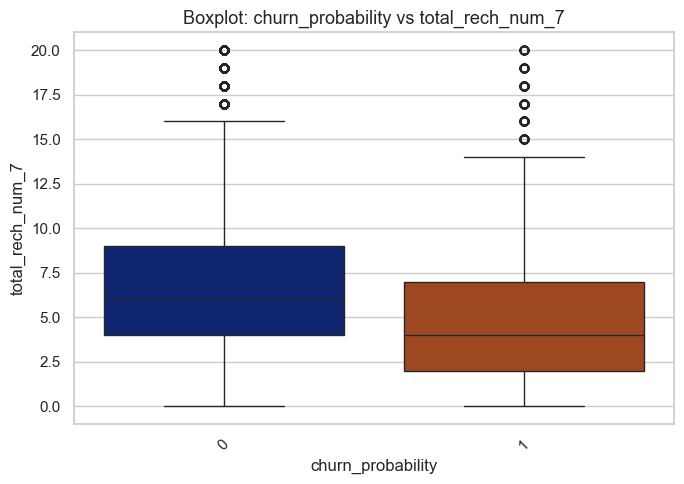

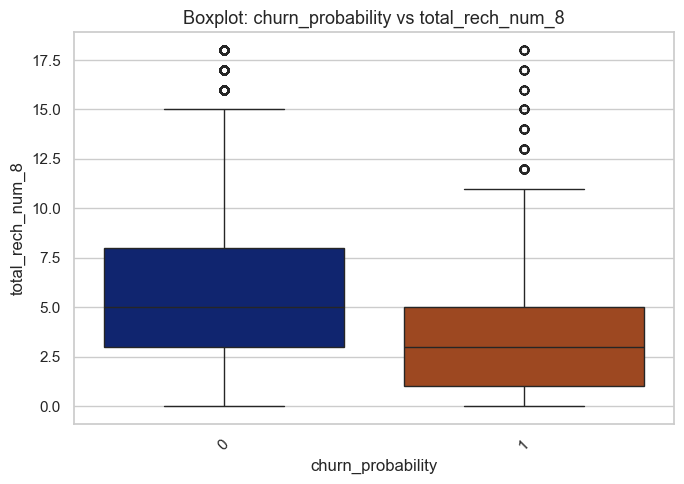

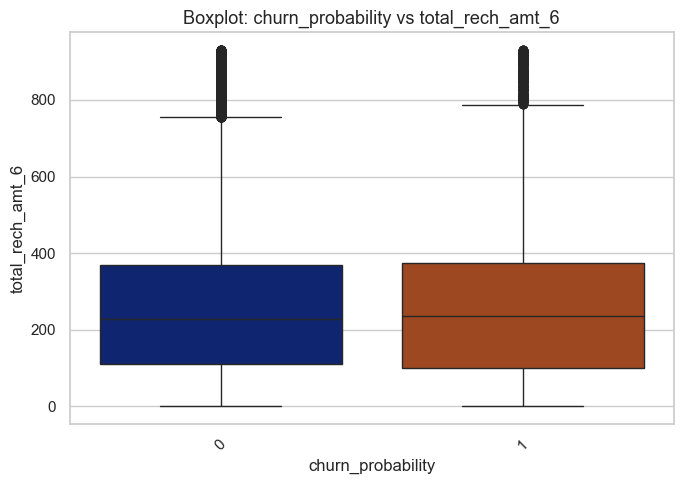

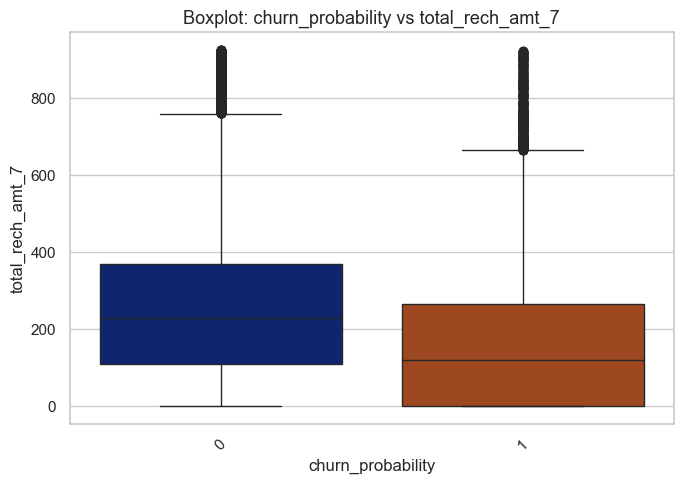

...

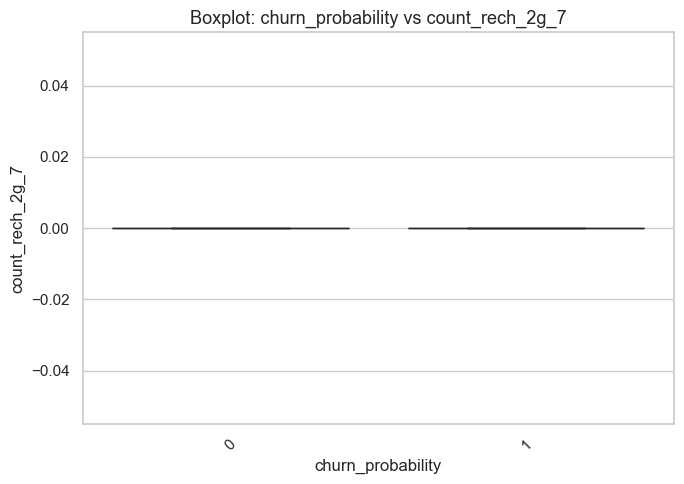

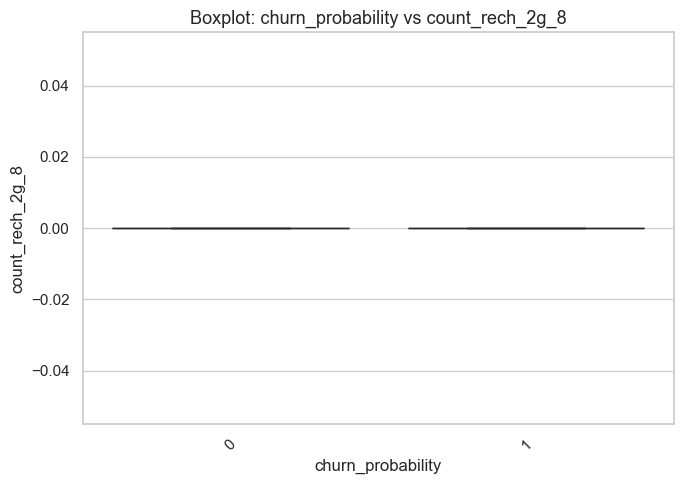

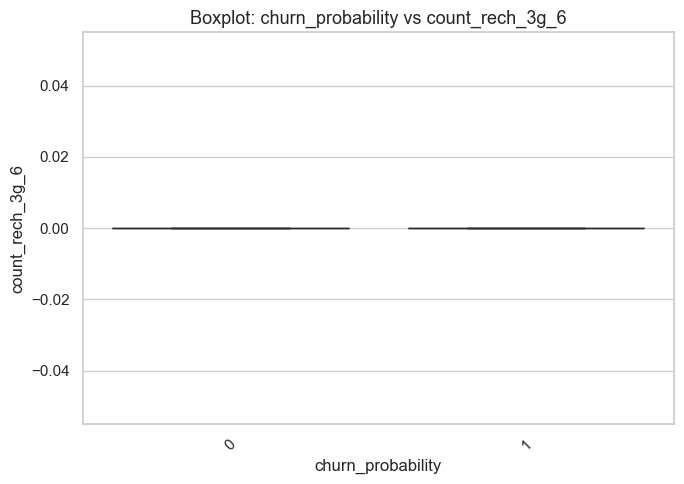

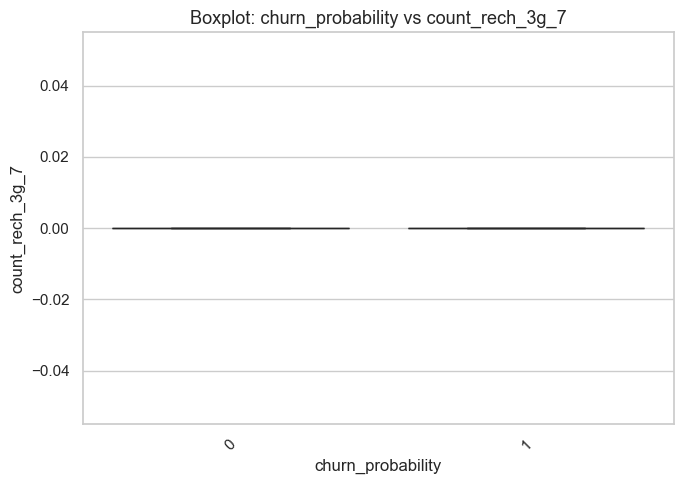

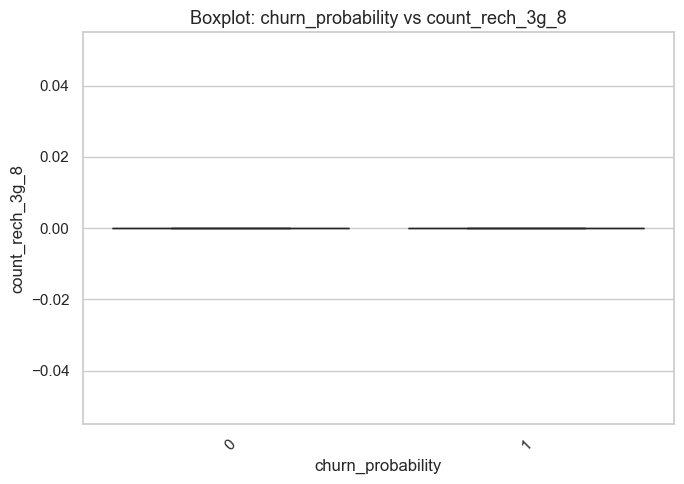

In [44]:
# Analysing for Recharge Data
rech_group = data_groups['Recharge Data']
for rech_group_keys in rech_group.keys():
    for rech in rech_group[rech_group_keys]:
        bivariate_analysis.boxplot('churn_probability', rech, palette='dark')

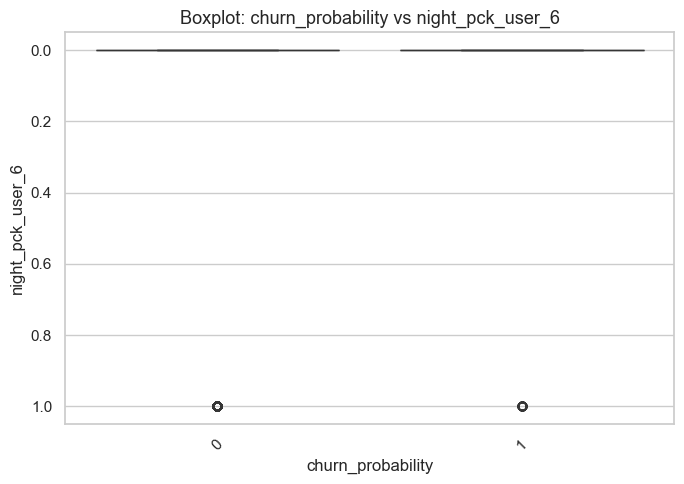

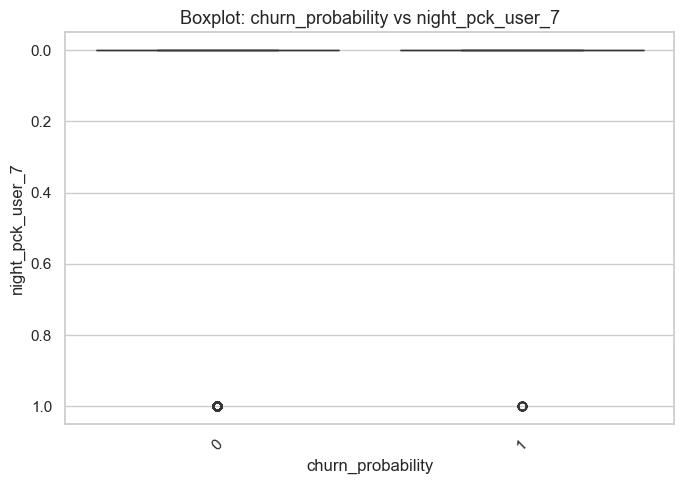

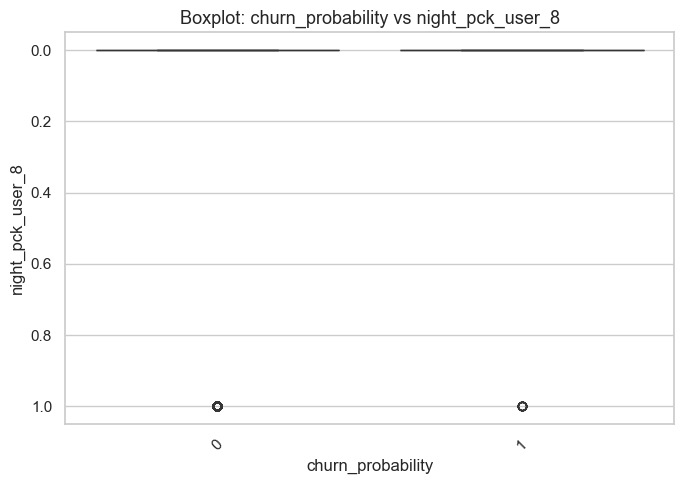

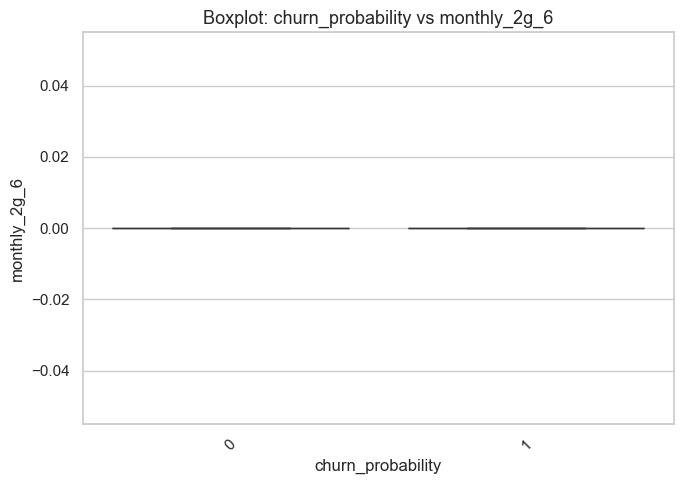

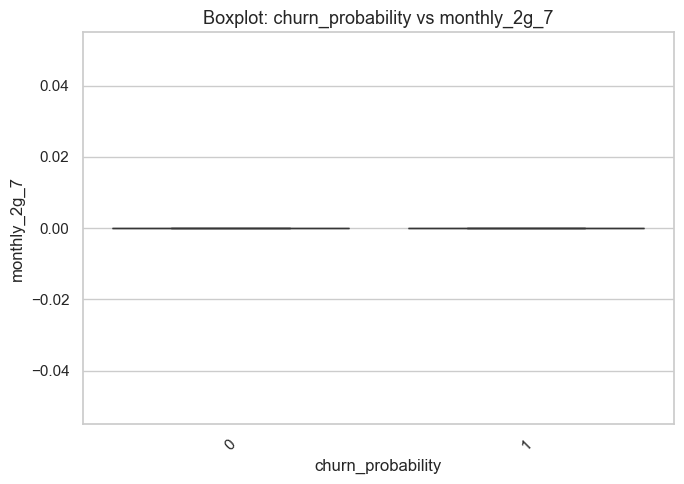

...

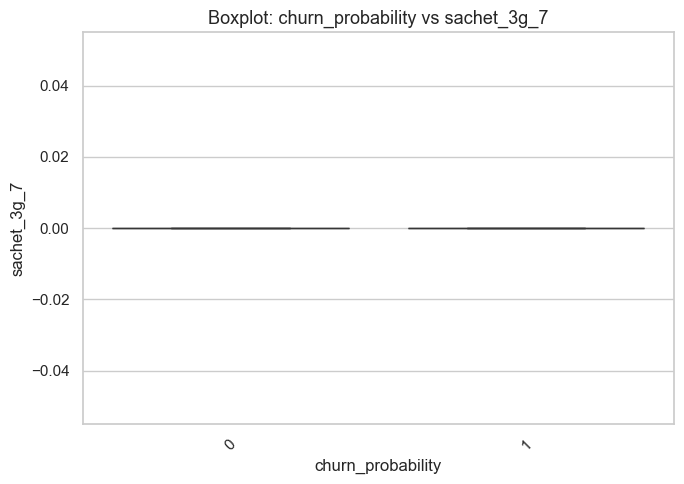

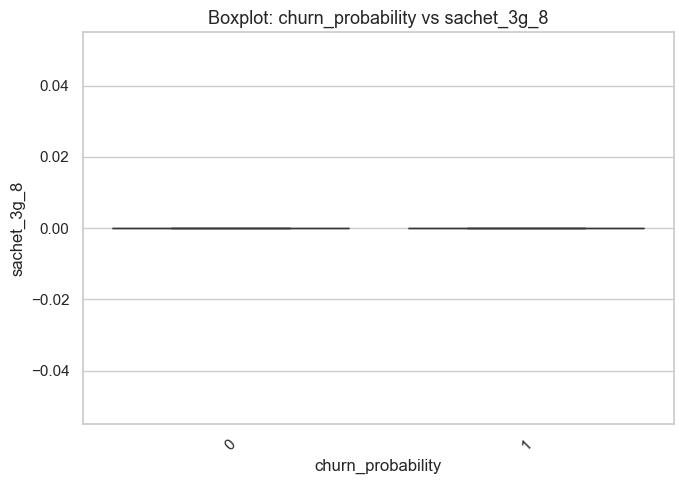

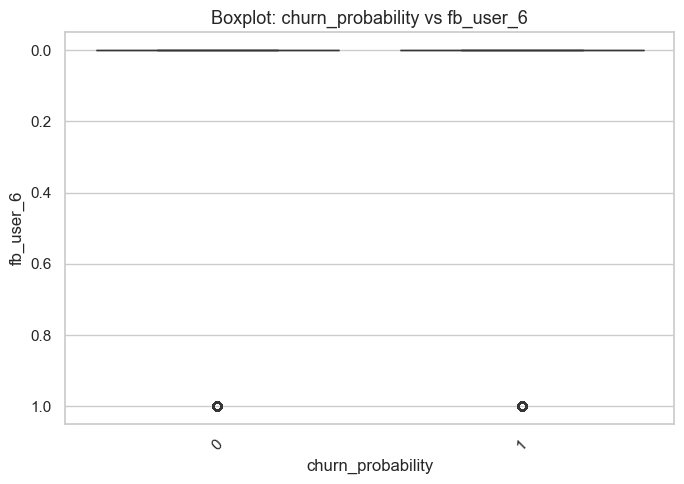

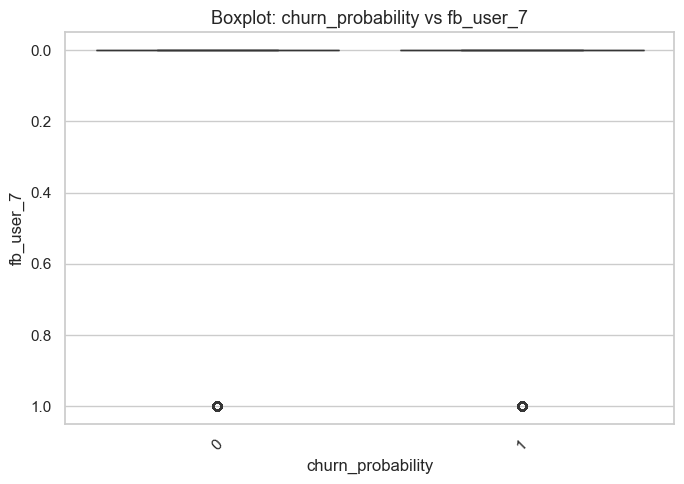

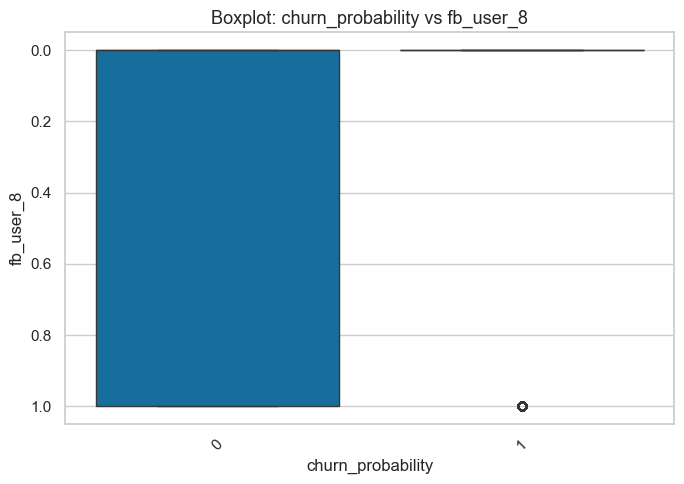

In [45]:
# Analysing for Service Schemes
serv_group = data_groups['Service Schemes']
for serv_group_keys in serv_group.keys():
    for serv in serv_group[serv_group_keys]:
        bivariate_analysis.boxplot('churn_probability', serv, palette='colorblind')

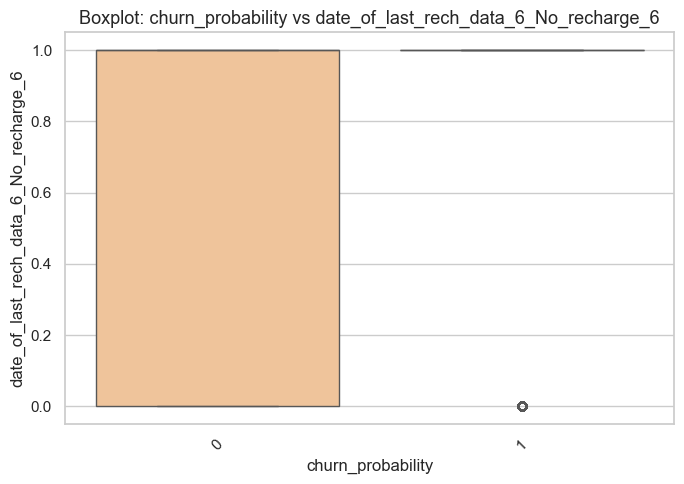

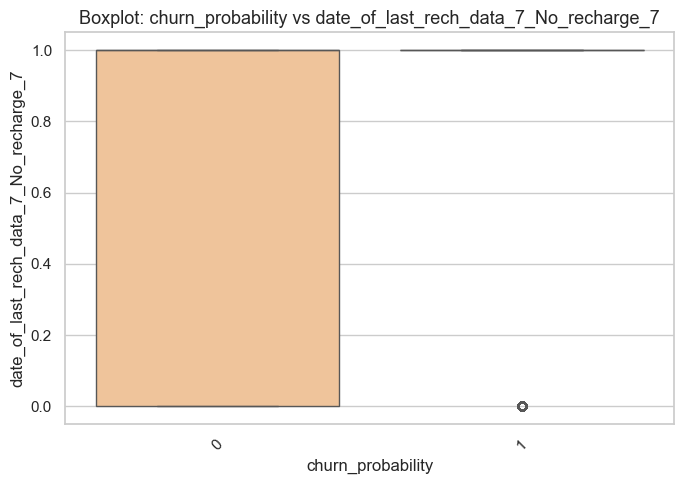

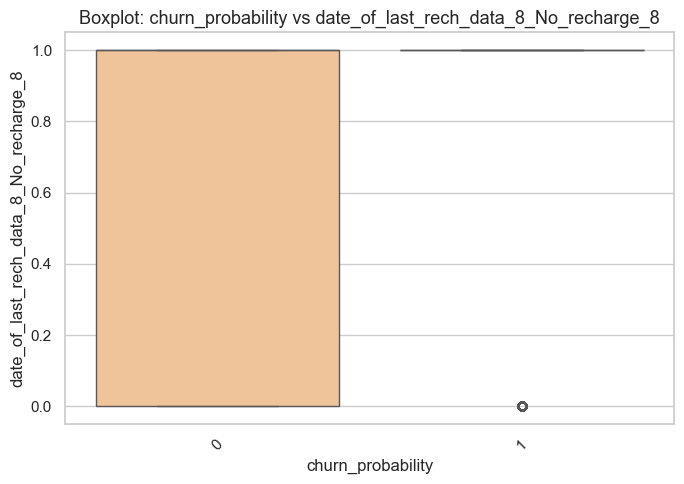

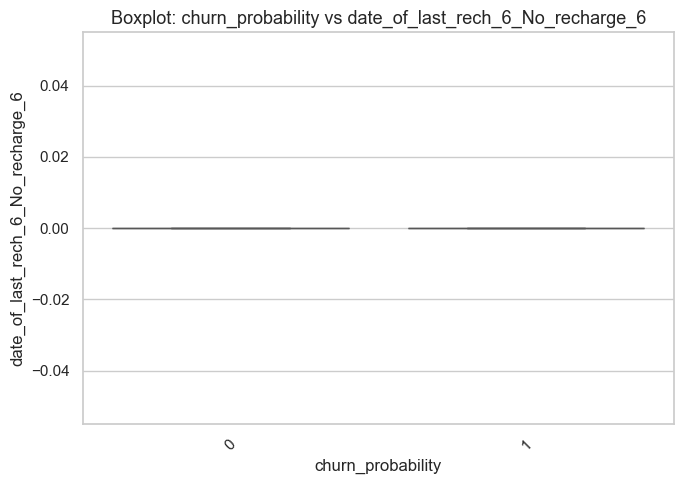

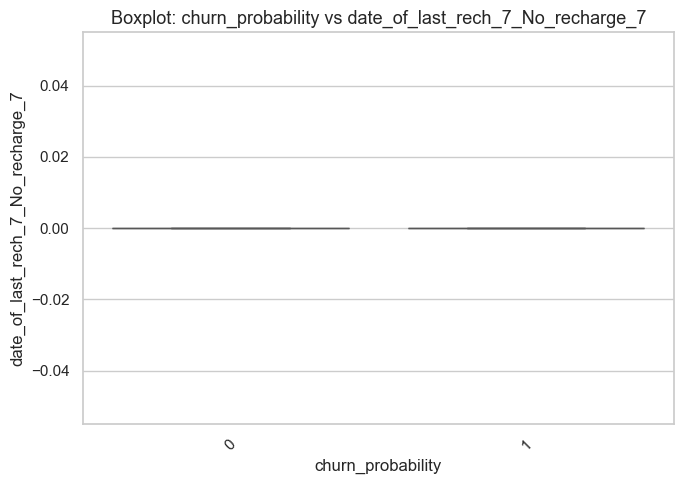

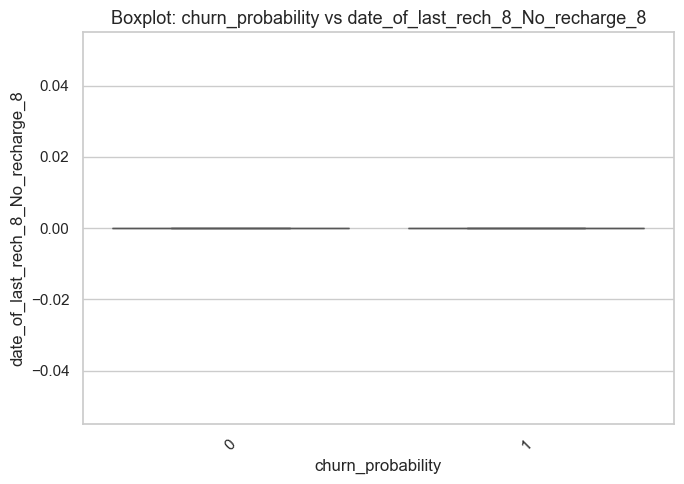

In [46]:
# Analysing for Date of Last Recharge (Weekday and No Recharge)
last_rech_group = data_groups['Date of Last Recharge (No Recharge)']
for last_rech_group_keys in last_rech_group.keys():
    for last_rech in last_rech_group[last_rech_group_keys]:
        bivariate_analysis.boxplot('churn_probability', last_rech, palette='OrRd')

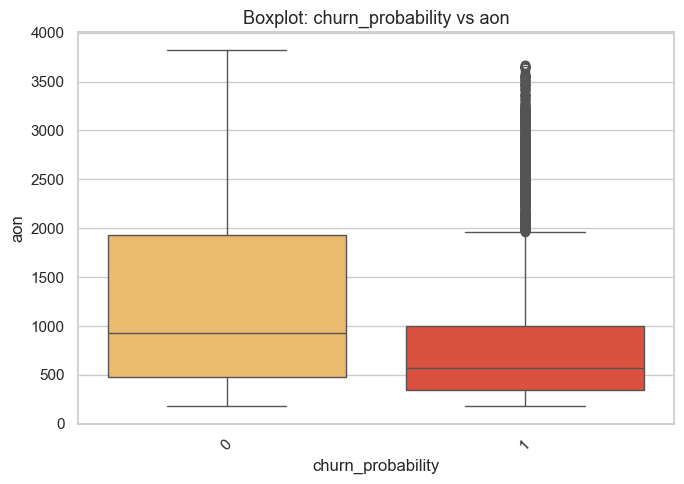

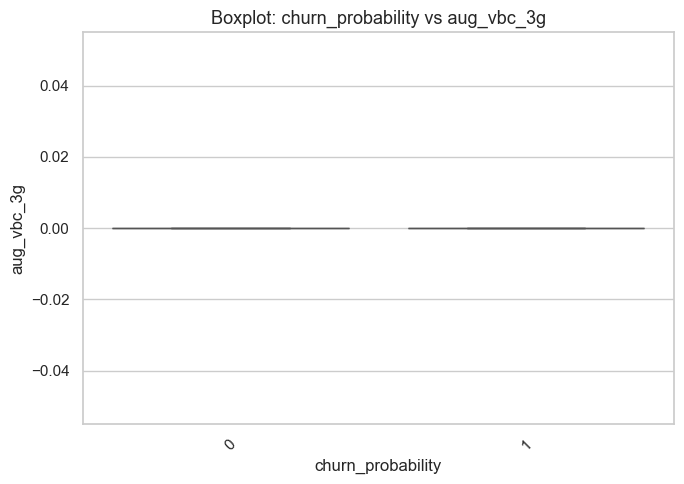

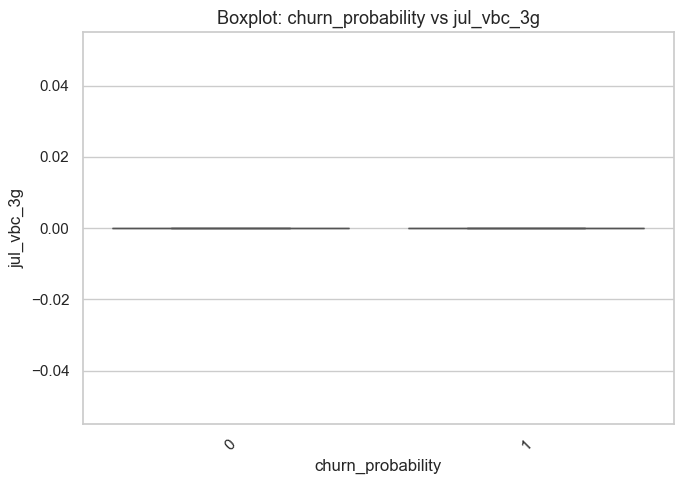

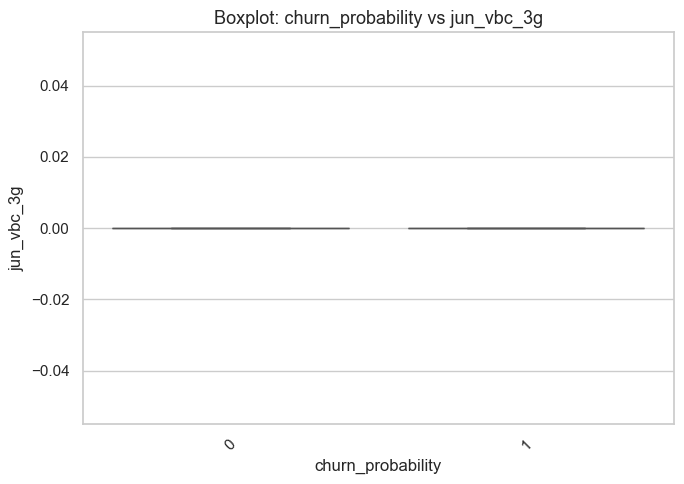

In [47]:
# Analysing for Miscellaneous
misc_group = data_groups['Miscellaneous']
for misc in misc_group:
    bivariate_analysis.boxplot('churn_probability', misc, palette='YlOrRd')

### Multivariate Analysis

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt

class MultivariateAnalysis:
    def __init__(self, dataframe):
        self.dataframe = dataframe
    
    def heatmap(self, cmap='coolwarm', fig_width=15, fig_height=10, 
                title_fontsize=16, tick_fontsize=8, annot_fontsize=8):
        # Set the style of the visualization
        sns.set(style="white")
        
        # Filter out columns with all zero values
        non_zero_columns = self.dataframe.columns[~(self.dataframe == 0).all()]
        filtered_df = self.dataframe[non_zero_columns]
        
        # Create a figure with the specified size
        plt.figure(figsize=(fig_width, fig_height))
        
        # Create the heatmap with annotations
        sns.heatmap(
            filtered_df.corr(),
            cmap=cmap,
            annot=True,  # Display annotations
            fmt=".2f",  # Format of annotations
            annot_kws={"size": annot_fontsize},  # Annotation font size
            linewidths=0.1,
            cbar_kws={'shrink': .75}  # Adjust color bar size
        )
        
        # Title and label adjustments
        plt.title('Correlation Matrix Heatmap', fontsize=title_fontsize)
        plt.xticks(rotation=90, fontsize=tick_fontsize)
        plt.yticks(rotation=0, fontsize=tick_fontsize)
        plt.tight_layout()
        
        # Display the plot
        plt.show()

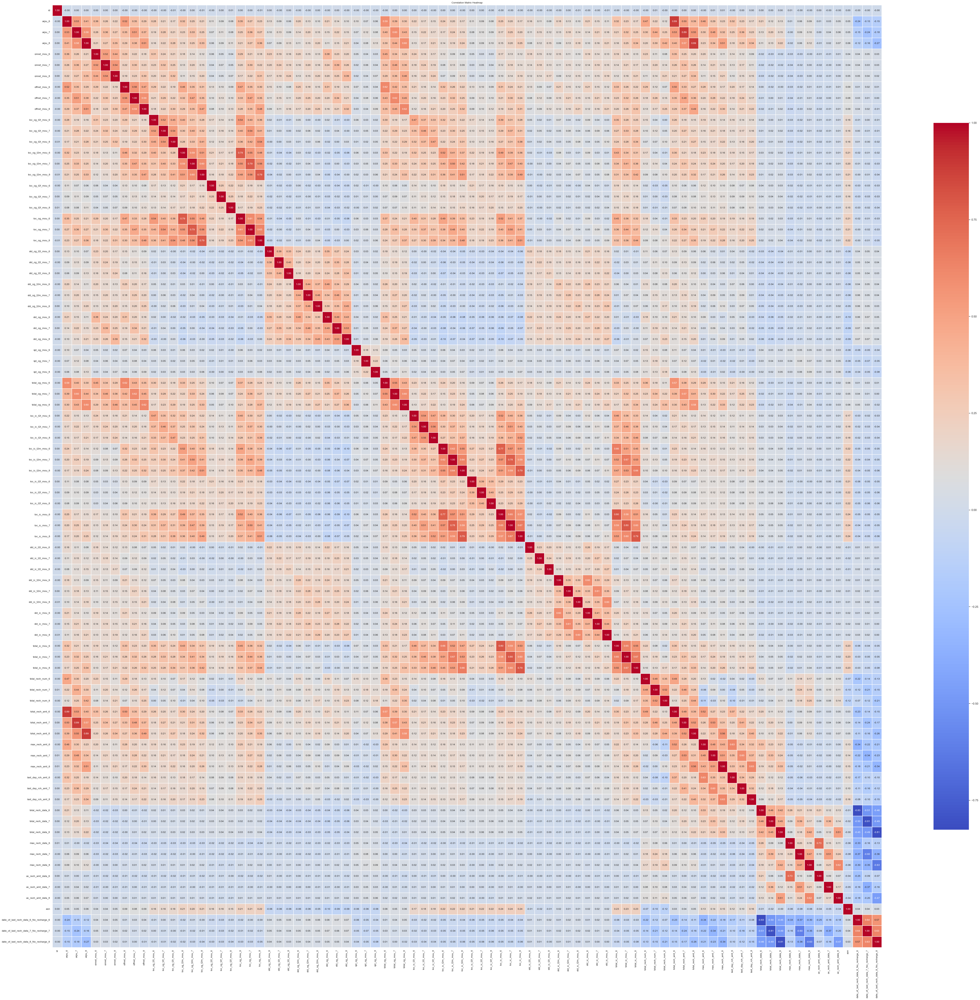

In [49]:
df_heatmap = df_train_clean[numerical_columns]
multivariate_analysis = MultivariateAnalysis(df_heatmap)
multivariate_analysis.heatmap(
    fig_width=60, 
    fig_height=55, 
    title_fontsize=10, 
    tick_fontsize=10, 
    annot_fontsize=10
)


# Feature Engineering and Variable Transformation

#### Create X, y and then Train test split

In [50]:
# Let's create X and y datasets 

X = df_train_clean.drop(['churn_probability', 'id'], axis=1)  # Drop both 'churn_probability' and 'id'
y = df_train_clean['churn_probability']  # Select the target variable
X.shape, y.shape

((69999, 157), (69999,))

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((55999, 157), (14000, 157), (55999,), (14000,))

In [52]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,date_of_last_rech_data_6_No_recharge_6,date_of_last_rech_data_7_No_recharge_7,date_of_last_rech_data_8_No_recharge_8,date_of_last_rech_6_No_recharge_6,date_of_last_rech_7_No_recharge_7,date_of_last_rech_8_No_recharge_8
43305,303.067,152.116,182.735,84.040000,117.360000,73.610000,437.53,123.44,161.290000,0.0,...,534.0,0.0,0.0,0.0,1,1,1,0.0,0.0,0.0
52925,500.700,152.691,217.379,119.040000,15.430000,21.990000,202.64,67.93,117.210000,0.0,...,1535.0,0.0,0.0,0.0,1,1,1,0.0,0.0,0.0
43828,61.082,113.027,0.000,0.000000,42.560000,49.624534,13.55,61.06,120.663087,0.0,...,257.0,0.0,0.0,0.0,0,1,1,0.0,0.0,0.0
13630,218.619,159.206,133.845,3.980000,7.360000,0.000000,59.59,0.06,0.210000,0.0,...,1056.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0
38376,414.729,375.693,311.702,52.219743,49.791241,49.624534,34.81,43.64,26.110000,0.0,...,308.0,0.0,0.0,0.0,1,1,1,0.0,0.0,0.0


In [53]:
# Summary of missing values
print("Total missing values per column:")
print(X_train.isnull().sum())

print("\nPercentage of missing values per column:")
print(X_train.isnull().mean() * 100)

print("\nTotal missing values in the DataFrame:")
print(X_train.isnull().sum().sum())

print("\nPercentage of missing values in the DataFrame:")
print(X_train.isnull().mean().mean() * 100)

Total missing values per column:
arpu_6                                    0
arpu_7                                    0
arpu_8                                    0
onnet_mou_6                               0
onnet_mou_7                               0
                                         ..
date_of_last_rech_data_7_No_recharge_7    0
date_of_last_rech_data_8_No_recharge_8    0
date_of_last_rech_6_No_recharge_6         0
date_of_last_rech_7_No_recharge_7         0
date_of_last_rech_8_No_recharge_8         0
Length: 157, dtype: int64

Percentage of missing values per column:
arpu_6                                    0.0
arpu_7                                    0.0
arpu_8                                    0.0
onnet_mou_6                               0.0
onnet_mou_7                               0.0
                                         ... 
date_of_last_rech_data_7_No_recharge_7    0.0
date_of_last_rech_data_8_No_recharge_8    0.0
date_of_last_rech_6_No_recharge_6         0.0
d

In [54]:
numerical_columns  = X_train.select_dtypes(exclude=['object','datetime','category']).columns.tolist()
categorical_columns = X_train.select_dtypes(include=['category']).columns.tolist()
extra_columns = X_train.select_dtypes(include=['object','datetime']).columns.tolist()
print("Numerical_Columns :", numerical_columns)
print("\nCateogrical_Columns :", categorical_columns)
print("\nExtra_Columns :", extra_columns)

Numerical_Columns : ['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'lo

In [65]:
# Scaling the features by scaling them with Standard scaler

scale = StandardScaler()
X_train_Scaled = scale.fit_transform(X_train)
columns_list = X_train.columns.tolist()

In [66]:
pd.DataFrame(X_train_Scaled, columns=X_train.columns.tolist()).describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,date_of_last_rech_data_6_No_recharge_6,date_of_last_rech_data_7_No_recharge_7,date_of_last_rech_data_8_No_recharge_8,date_of_last_rech_6_No_recharge_6,date_of_last_rech_7_No_recharge_7,date_of_last_rech_8_No_recharge_8
count,5.599900e+04,5.599900e+04,5.599900e+04,5.599900e+04,5.599900e+04,5.599900e+04,5.599900e+04,5.599900e+04,5.599900e+04,55999.0,...,5.599900e+04,55999.0,55999.0,55999.0,5.599900e+04,5.599900e+04,5.599900e+04,55999.0,55999.0,55999.0
mean,-1.547996e-16,-6.344245e-18,1.042994e-16,6.217360e-17,-7.613094e-19,-1.360206e-16,-1.725635e-17,-5.379920e-17,-1.410960e-16,0.0,...,-1.877896e-17,0.0,0.0,0.0,8.146010e-17,-7.143620e-17,-8.374403e-18,0.0,0.0,0.0
std,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,0.0,...,1.000009e+00,0.0,0.0,0.0,1.000009e+00,1.000009e+00,1.000009e+00,0.0,0.0,0.0
min,-2.475960e+00,-2.856731e+00,-2.328814e+00,-8.772576e-01,-8.662505e-01,-8.708000e-01,-1.078473e+00,-1.061329e+00,-1.061011e+00,0.0,...,-1.093543e+00,0.0,0.0,0.0,-1.733186e+00,-1.714396e+00,-1.680250e+00,0.0,0.0,0.0
25%,-7.633585e-01,-7.731635e-01,-7.744501e-01,-7.427227e-01,-7.387266e-01,-7.411873e-01,-7.606137e-01,-7.598976e-01,-7.576560e-01,0.0,...,-7.917789e-01,0.0,0.0,0.0,5.769722e-01,-1.714396e+00,-1.680250e+00,0.0,0.0,0.0
50%,-1.753885e-01,-1.807366e-01,-1.786353e-01,-2.438854e-01,-2.403196e-01,-2.213317e-01,-1.849736e-01,-1.892011e-01,-1.683603e-01,0.0,...,-3.722528e-01,0.0,0.0,0.0,5.769722e-01,5.832959e-01,5.951495e-01,0.0,0.0,0.0
75%,5.001437e-01,5.052847e-01,5.168821e-01,1.447710e-01,1.321338e-01,1.072663e-01,3.299817e-01,3.184430e-01,2.892673e-01,0.0,...,6.245160e-01,0.0,0.0,0.0,5.769722e-01,5.832959e-01,5.951495e-01,0.0,0.0,0.0
max,3.155844e+00,3.157008e+00,3.166575e+00,3.947188e+00,4.011056e+00,4.012155e+00,3.504257e+00,3.539326e+00,3.565048e+00,0.0,...,2.734764e+00,0.0,0.0,0.0,5.769722e-01,5.832959e-01,5.951495e-01,0.0,0.0,0.0


In [67]:
# Let's understand feature importances for raw features as well as components to decide top features for modelling.
rf = RandomForestClassifier(n_estimators=100, n_jobs=-1)
rf.fit(X_train_Scaled, y_train)

RandomForestClassifier(n_jobs=-1)

In [75]:
feature_importances = pd.DataFrame({'col':columns_list, 'importance':rf.feature_importances_})
display(HTML(feature_importances.sort_values(by="importance",ascending=False).to_html()))

,col,importance
80,total_ic_mou_8,0.089663
53,total_og_mou_8,0.063207
2,arpu_8,0.057098
95,total_rech_amt_8,0.040864
98,max_rech_amt_8,0.030425
65,loc_ic_mou_8,0.029628
59,loc_ic_t2m_mou_8,0.024529
101,last_day_rch_amt_8,0.024455
79,total_ic_mou_7,0.020833
52,total_og_mou_7,0.020618


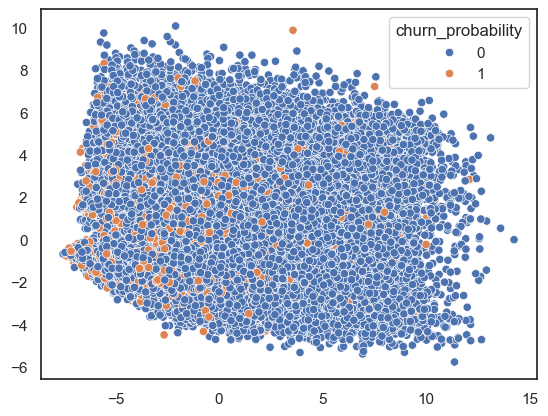

In [76]:
pca = PCA(0.90)
pca_components = pca.fit_transform(X_train_Scaled)
sns.scatterplot(x=pca_components[:,0], y=pca_components[:,1], hue=y_train)
plt.show()

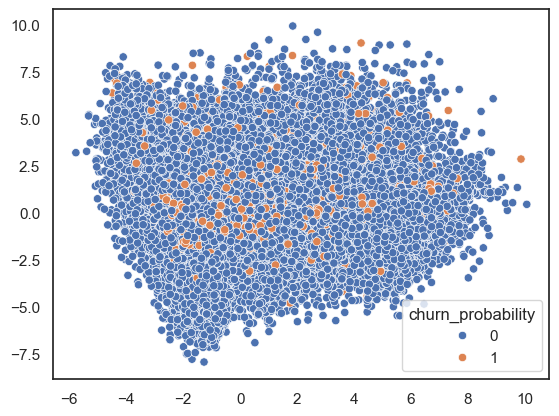

In [77]:
sns.scatterplot(x=pca_components[:,1], y=pca_components[:,2], hue=y_train)
plt.show()

In [78]:
# Let's also check which of the components have high feature importances towards the end goal of churn prediction.

In [89]:
rf = RandomForestClassifier(n_estimators=100, n_jobs=-1)
rf.fit(pca_components, y_train)

# Adjust the component list to match the number of feature importances
n_components = len(rf.feature_importances_)

feature_importances = pd.DataFrame({'col':['component_'+str(i) for i in range(n_components)], 
                                    'importance':rf.feature_importances_})

display(HTML(feature_importances.sort_values(by="importance",ascending=False).to_html()))

,col,importance
4,component_4,0.076783
0,component_0,0.064785
5,component_5,0.031671
2,component_2,0.028784
47,component_47,0.025782
1,component_1,0.024075
44,component_44,0.023501
17,component_17,0.023279
52,component_52,0.023004
9,component_9,0.022722


# Model Selection, Model Building, and Prediction 

In [90]:
# Define the logistic model
lr = LogisticRegression(n_jobs=-1,random_state=0)
scaler = StandardScaler()
pca = PCA(0.90)

pipe_lr = Pipeline(steps=[('scaler',scaler),
                          ('pca',pca),
                          ('model',lr)])

params = [{"model__max_iter": [200,500,1000],
           "model__C": np.logspace(0, 4, 10, 12)}]

search = GridSearchCV(pipe_lr,params,n_jobs=-1,cv=5,verbose=True)

best_model = search.fit(X_train,y_train)

print("Best parameter (CV score=%0.3f):" % best_model.best_score_)
print(best_model.best_params_)
print(best_model.score(X_test,y_test))
print(best_model.best_estimator_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best parameter (CV score=0.918):
{'model__C': 2.7825594022071245, 'model__max_iter': 200}
0.92
Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=0.9)),
                ('model',
                 LogisticRegression(C=2.7825594022071245, max_iter=200,
                                    n_jobs=-1, random_state=0))])


In [91]:
best_model.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=0.9)),
                ('model',
                 LogisticRegression(C=2.7825594022071245, max_iter=200,
                                    n_jobs=-1, random_state=0))])

In [92]:
confusion_matrix(y_train, best_model.best_estimator_.predict(X_train))

array([[49486,   753],
       [ 3814,  1946]])

In [93]:
confusion_matrix(y_test, best_model.best_estimator_.predict(X_test))

array([[12428,   200],
       [  920,   452]])

In [94]:
precision_score(y_test, best_model.best_estimator_.predict(X_test))

0.6932515337423313

In [95]:
recall_score(y_test, best_model.best_estimator_.predict(X_test))

0.3294460641399417

In [98]:
roc_auc_score(y_test, best_model.best_estimator_.predict(X_test))

0.6568041217120362

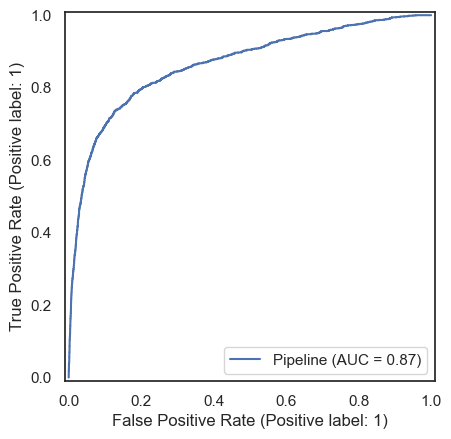

In [104]:
RocCurveDisplay.from_estimator(best_model.best_estimator_,X_test, y_test)
plt.show()

## RandomForest Classifier Model

In [ ]:
rf = RandomForestClassifier(random_state=0,n_jobs=-1,verbose=1)

# Setting hyperparameters
params_rf = {'max_depth': [2,3,5,10],
             'min_samples_leaf': [5,10,20,50,100],
             'n_estimators': [10,25,50,100]}

# model building with 4-fold cv
model_cv = GridSearchCV(estimator=rf, 
                        param_grid=params_rf,
                        verbose=1,
                        n_jobs=-1,
                        return_train_score=True,
                        cv=4)

# Fitting the model with hyperparams and cv
model_cv.fit(X_train,y_train)

Fitting 4 folds for each of 80 candidates, totalling 320 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 11 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   2 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  10 out of  10 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   2 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  10 out of  10 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 11 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   2 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=10)]: Done  10 out of  10 | elapsed:    0.0s f

In [156]:
model_cv.best_score_

0.9417310853836498

In [157]:
# # Build dataframe to see average test and train data to decide hyperparameters of final model
cv_df = pd.DataFrame(model_cv.cv_results_)
cv_df.sort_values(by='rank_test_score').head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_n_estimators,params,split0_test_score,split1_test_score,...,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
8,48.672051,0.496818,0.069319,0.003174,10,30,200,"{'max_depth': 10, 'max_features': 30, 'n_estim...",0.943357,0.942929,...,0.940781,0.941731,0.001457,1,0.952166,0.952285,0.952427,0.952619,0.952374,0.000169
14,71.148278,0.410293,0.088565,0.009376,15,30,200,"{'max_depth': 15, 'max_features': 30, 'n_estim...",0.942857,0.942643,...,0.941567,0.941642,0.001330,2,0.975023,0.974404,0.974428,0.976119,0.974994,0.000696
1,24.624870,0.406063,0.054616,0.003653,5,25,250,"{'max_depth': 5, 'max_features': 25, 'n_estima...",0.943000,0.942714,...,0.941210,0.941606,0.001393,3,0.941570,0.941665,0.942403,0.942119,0.941939,0.000339
4,27.449574,0.112044,0.055641,0.002732,5,35,200,"{'max_depth': 5, 'max_features': 35, 'n_estima...",0.943000,0.942714,...,0.940996,0.941570,0.001385,4,0.941522,0.941761,0.942403,0.942357,0.942011,0.000379
10,58.094896,0.233282,0.078210,0.016972,10,35,200,"{'max_depth': 10, 'max_features': 35, 'n_estim...",0.942786,0.942429,...,0.941210,0.941553,0.001175,5,0.952737,0.952713,0.952523,0.953048,0.952755,0.000188


In [159]:
cv_df.loc[8] 

mean_fit_time                                                 48.672051
std_fit_time                                                   0.496818
mean_score_time                                                0.069319
std_score_time                                                 0.003174
param_max_depth                                                      10
param_max_features                                                   30
param_n_estimators                                                  200
params                {'max_depth': 10, 'max_features': 30, 'n_estim...
split0_test_score                                              0.943357
split1_test_score                                              0.942929
split2_test_score                                              0.939857
split3_test_score                                              0.940781
mean_test_score                                                0.941731
std_test_score                                                 0

In [143]:
final_model = RandomForestClassifier(random_state=0, 
                                     n_jobs=-1, 
                                     max_depth=10, 
                                     max_features=30, 
                                     oob_score=True, 
                                     n_estimators=200)

In [144]:
final_model.fit(X_train,y_train)

RandomForestClassifier(max_depth=10, max_features=30, n_estimators=200,
                       n_jobs=-1, oob_score=True, random_state=0)

In [145]:
# Out of bag score
final_model.oob_score_

0.941677529955892

In [146]:
confusion_matrix(y_train, final_model.predict(X_train))

array([[49509,   730],
       [ 2029,  3731]])

In [147]:
confusion_matrix(y_test, final_model.predict(X_test))

array([[12372,   256],
       [  541,   831]])

In [148]:
precision_score(y_test, final_model.predict(X_test))

0.764489420423183

In [149]:
recall_score(y_test, final_model.predict(X_test))

0.6056851311953353

In [150]:
roc_auc_score(y_test, final_model.predict(X_test))

0.7927063603395111

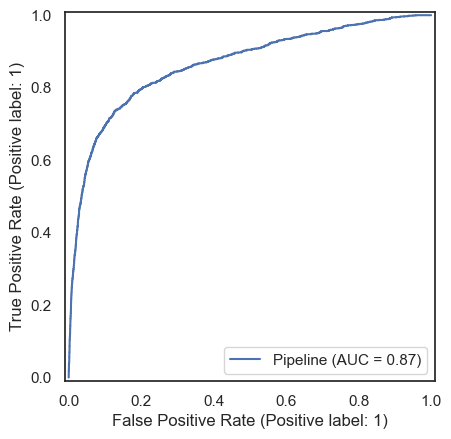

In [151]:
RocCurveDisplay.from_estimator(best_model.best_estimator_,X_test, y_test)
plt.show()

# Submission File

In [152]:
submission_data = df_test_clean[X_train.columns]
submission_data.shape

(30000, 157)

In [153]:
df_test_clean.head()

,level_0,index,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,...,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,date_of_last_rech_data_6_No_recharge_6,date_of_last_rech_data_7_No_recharge_7,date_of_last_rech_data_8_No_recharge_8,date_of_last_rech_6_No_recharge_6,date_of_last_rech_7_No_recharge_7,date_of_last_rech_8_No_recharge_8,churn_probability
0,0,0,69999,91.882,65.330,64.445,31.78,20.23,23.11,60.16,...,0.00,0.00,0.00,1,1,1,0,0,0,0
1,1,1,70000,414.168,515.568,360.868,75.51,41.21,19.84,474.34,...,0.00,0.00,0.00,1,1,1,0,0,0,0
2,2,2,70001,329.844,434.884,746.239,7.54,7.86,8.40,16.98,...,525.61,758.41,241.84,1,1,1,0,0,0,1
3,3,3,70002,43.550,171.390,24.400,5.31,2.16,0.00,40.04,...,0.00,0.00,0.00,1,1,1,0,0,0,0
4,4,4,70003,306.854,406.289,413.329,450.93,609.03,700.68,60.94,...,0.00,0.00,0.00,1,1,1,0,0,0,0


In [154]:
df_test_clean['churn_probability'] = final_model.predict(submission_data)
df_test_clean.reset_index(inplace=True)
output = df_test_clean[['id','churn_probability']]
output.head()

ValueError: cannot insert level_0, already exists

In [ ]:
output.to_csv('ankit_surana.csv',index=False)